# Imports

In [1]:
# import libraries here; add more as necessary
# Ignoring warnings
import warnings
warnings.filterwarnings('ignore')

# Data Manipulation
import pandas as pd

# enabling full display of a row content in a data frame
pd.set_option('display.max_colwidth', None)

# Option to suppress scientific notation in Pandas
pd.set_option('display.float_format', lambda x: '%.3f' % x)

import numpy as np
from scipy import stats
import math
import itertools
import random

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import plot_tree

# DevOps modules
import os
import time

# Feature Selection
from sklearn.feature_selection import RFECV
from sklearn.inspection import permutation_importance

# Modelling
# Using a Classifier Chain
from sklearn.multioutput import ClassifierChain

# Using a single multi-output classifier algorithm
from sklearn.multioutput import MultiOutputClassifier

from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier


# HyperParameter Tuning

# Data Scaling
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

# Unsupervised Learning
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Scoring
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

# magic word for producing visualizations in notebook
%matplotlib inline

In [2]:
# Reading the data
well_df=pd.read_csv('Data/spe_africa_dseats_datathon_2025_wells_dataset.csv')

In [3]:
well_df.head()

,PROD_DATE,WELL_NAME,ON_STREAM_HRS,BOTTOMHOLE_FLOWING_PRESSURE (PSI),DOWNHOLE_TEMPERATURE (deg F),ANNULUS_PRESS (PSI),CHOKE_SIZE (%),WELL_HEAD_PRESSURE (PSI),WELL_HEAD_TEMPERATURE (deg F),CUMULATIVE_OIL_PROD (STB),CUMULATIVE_FORMATION_GAS_PROD (MSCF),CUMULATIVE_TOTAL_GAS_PROD (MSCF),CUMULATIVE_WATER_PROD (BBL)
0,15-Feb-14,Well_#1,0.000,"4,050",189.866,0,1.180,482.46,50.864,0,0,0,0
1,16-Feb-14,Well_#1,0.000,"3,961",189.945,0,2.994,328.601,47.668,0,0,0,0
2,17-Feb-14,Well_#1,0.000,"3,961",190.004,0,1.903,387.218,48.962,0,0,0,0
3,18-Feb-14,Well_#1,0.000,"3,964",190.020,0,0.000,308.98,46.636,0,0,0,0
4,19-Feb-14,Well_#1,0.000,"3,965",190.107,0,30.208,196.057,47.297,0,0,0,0


In [4]:
# Preliminary Informations
print('The Dataset has for {} rows and {} columns'.format(well_df.shape[0], well_df.shape[1]))

The Dataset has for 7955 rows and 13 columns


<a name="Cleaning"></a>
## 1. Data Cleaning

## Shortening the Column Names

In [5]:
# Listing all columns in current training data
well_df.columns

Index(['PROD_DATE', 'WELL_NAME', 'ON_STREAM_HRS',
       'BOTTOMHOLE_FLOWING_PRESSURE (PSI)', 'DOWNHOLE_TEMPERATURE (deg F)',
       'ANNULUS_PRESS (PSI)', 'CHOKE_SIZE (%)', 'WELL_HEAD_PRESSURE (PSI)',
       'WELL_HEAD_TEMPERATURE (deg F)', 'CUMULATIVE_OIL_PROD (STB)',
       'CUMULATIVE_FORMATION_GAS_PROD (MSCF)',
       'CUMULATIVE_TOTAL_GAS_PROD (MSCF)', 'CUMULATIVE_WATER_PROD (BBL)'],
      dtype='object')

In [6]:
# Creating a dictionary to map old names to new names
rename_map={'PROD_DATE':'date', 'WELL_NAME':'well_name', 'ON_STREAM_HRS':'on_str_hrs', 'BOTTOMHOLE_FLOWING_PRESSURE (PSI)':'bottom_hole_psi',
            'DOWNHOLE_TEMPERATURE (deg F)':'downhole_temp', 'ANNULUS_PRESS (PSI)':'Annulus_p', 'CHOKE_SIZE (%)':'choke_size',
            'WELL_HEAD_PRESSURE (PSI)':'whp', 'WELL_HEAD_TEMPERATURE (deg F)':'wht', 'CUMULATIVE_OIL_PROD (STB)':'cumm_oil_stb',
            'CUMULATIVE_FORMATION_GAS_PROD (MSCF)':'cumm_form_gas_mscf', 'CUMULATIVE_TOTAL_GAS_PROD (MSCF)':'cumm_total_gas_mscf', 
            'CUMULATIVE_WATER_PROD (BBL)':'cumm_water_bbl'}

In [7]:
# Renaming columns "INPLACE"
well_df.rename(columns=rename_map, inplace=True)

In [8]:
# Viewing top 5 rows of the data
well_df.head()

,date,well_name,on_str_hrs,bottom_hole_psi,downhole_temp,Annulus_p,choke_size,whp,wht,cumm_oil_stb,cumm_form_gas_mscf,cumm_total_gas_mscf,cumm_water_bbl
0,15-Feb-14,Well_#1,0.000,"4,050",189.866,0,1.180,482.46,50.864,0,0,0,0
1,16-Feb-14,Well_#1,0.000,"3,961",189.945,0,2.994,328.601,47.668,0,0,0,0
2,17-Feb-14,Well_#1,0.000,"3,961",190.004,0,1.903,387.218,48.962,0,0,0,0
3,18-Feb-14,Well_#1,0.000,"3,964",190.020,0,0.000,308.98,46.636,0,0,0,0
4,19-Feb-14,Well_#1,0.000,"3,965",190.107,0,30.208,196.057,47.297,0,0,0,0


## Data Type check

In [9]:
well_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7955 entries, 0 to 7954
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   date                 7955 non-null   object 
 1   well_name            7955 non-null   object 
 2   on_str_hrs           7955 non-null   float64
 3   bottom_hole_psi      7955 non-null   object 
 4   downhole_temp        7955 non-null   float64
 5   Annulus_p            7955 non-null   object 
 6   choke_size           7955 non-null   float64
 7   whp                  7955 non-null   object 
 8   wht                  7955 non-null   float64
 9   cumm_oil_stb         7955 non-null   object 
 10  cumm_form_gas_mscf   7955 non-null   object 
 11  cumm_total_gas_mscf  7955 non-null   object 
 12  cumm_water_bbl       7955 non-null   object 
dtypes: float64(4), object(9)
memory usage: 808.1+ KB


## Observations
1. date should be converted to a date time type
2. bottomhole pressure should be investigated and converted to float
3. Annulus pressure should be investigated and converted to float
4. well head pressure should be investigated and converted to float
5. cummulative oil production should be investigated and converted to float
6. cummulative formation gas production should be investigated and converted to float
7. cummulative total gas should be investigated and converted to float
8. cummulative water production should be investigated and converted to float

In [10]:
#1. 
well_df['date_conv']=pd.to_datetime(well_df['date'], format='%d-%b-%y')
well_df

,date,well_name,on_str_hrs,bottom_hole_psi,downhole_temp,Annulus_p,choke_size,whp,wht,cumm_oil_stb,cumm_form_gas_mscf,cumm_total_gas_mscf,cumm_water_bbl,date_conv
0,15-Feb-14,Well_#1,0.000,"4,050",189.866,0,1.180,482.46,50.864,0,0,0,0,2014-02-15
1,16-Feb-14,Well_#1,0.000,"3,961",189.945,0,2.994,328.601,47.668,0,0,0,0,2014-02-16
2,17-Feb-14,Well_#1,0.000,"3,961",190.004,0,1.903,387.218,48.962,0,0,0,0,2014-02-17
3,18-Feb-14,Well_#1,0.000,"3,964",190.020,0,0.000,308.98,46.636,0,0,0,0,2014-02-18
4,19-Feb-14,Well_#1,0.000,"3,965",190.107,0,30.208,196.057,47.297,0,0,0,0,2014-02-19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7950,05-Apr-15,Well_#20,18.940,"2,505",149.177,633.188,77.321,115.406,85.532,"497,425","235,131","352,697","522,788",2015-04-05
7951,06-Apr-15,Well_#20,21.060,"2,503",149.169,617.591,72.403,116.285,84.959,"497,609","235,205","352,808","523,266",2015-04-06
7952,07-Apr-15,Well_#20,24.000,"2,481",149.175,645.435,100.000,111.943,87.361,"497,879","235,314","352,971","523,885",2015-04-07
7953,08-Apr-15,Well_#20,15.940,"2,485",149.178,651.282,76.408,111.962,87.583,"498,019","235,370","353,055","524,431",2015-04-08


In [11]:
well_df.columns

Index(['date', 'well_name', 'on_str_hrs', 'bottom_hole_psi', 'downhole_temp',
       'Annulus_p', 'choke_size', 'whp', 'wht', 'cumm_oil_stb',
       'cumm_form_gas_mscf', 'cumm_total_gas_mscf', 'cumm_water_bbl',
       'date_conv'],
      dtype='object')

In [12]:
#2 - 8.
# Float investigation and conversions
to_conv_to_float= ['bottom_hole_psi',
       'Annulus_p', 'whp', 'cumm_oil_stb',
       'cumm_form_gas_mscf', 'cumm_total_gas_mscf', 'cumm_water_bbl']
for col in to_conv_to_float:
    # Using try-except block for investigation
    try:
        well_df[col]=well_df[col].str.replace(',', '')
        well_df[col]=well_df[col].astype('float64')
    except Exception as e:
        print(f"Error in parsing column: {col}")
        raise Exception(e)

# Re-investigating
well_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7955 entries, 0 to 7954
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   date                 7955 non-null   object        
 1   well_name            7955 non-null   object        
 2   on_str_hrs           7955 non-null   float64       
 3   bottom_hole_psi      7955 non-null   float64       
 4   downhole_temp        7955 non-null   float64       
 5   Annulus_p            7955 non-null   float64       
 6   choke_size           7955 non-null   float64       
 7   whp                  7955 non-null   float64       
 8   wht                  7955 non-null   float64       
 9   cumm_oil_stb         7955 non-null   float64       
 10  cumm_form_gas_mscf   7955 non-null   float64       
 11  cumm_total_gas_mscf  7955 non-null   float64       
 12  cumm_water_bbl       7955 non-null   float64       
 13  date_conv            7955 non-nul

## Observations
1. There's a comma in the data and pandas is reading that as an object. Solution was to replace ',' with nothing before changing data type. This fixed everything.

   Error in parsing column: bottom_hole_psi -> Exception: could not convert string to float: '4,050'

## Consistency check for Object columns

In [13]:
# confirming that well bore name have just one value for each category
print('Unique Values for {} are {} '.format('Well Name', well_df['well_name'].unique()))

Unique Values for Well Name are ['Well_#1' 'Well_#2' 'Well_#3' 'Well_#4' 'Well_#5' 'Well_#6' 'Well_#7'
 'Well_#8' 'Well_#9' 'Well_#10' 'Well_#11' 'Well_#12' 'Well_#13'
 'Well_#14' 'Well_#15' 'Well_#16' 'Well_#17' 'Well_#18' 'Well_#19'
 'Well_#20'] 


**Observation** 

Data is consistent

## Missing data check

In [14]:
well_df.isna().sum()

date                   0
well_name              0
on_str_hrs             0
bottom_hole_psi        0
downhole_temp          0
Annulus_p              0
choke_size             0
whp                    0
wht                    0
cumm_oil_stb           0
cumm_form_gas_mscf     0
cumm_total_gas_mscf    0
cumm_water_bbl         0
date_conv              0
dtype: int64

**Observation**

There is no missing data

## Duplicates Check

In [15]:
dup = well_df.duplicated()
well_df[dup]

,date,well_name,on_str_hrs,bottom_hole_psi,downhole_temp,Annulus_p,choke_size,whp,wht,cumm_oil_stb,cumm_form_gas_mscf,cumm_total_gas_mscf,cumm_water_bbl,date_conv


**Observation**

There are no duplicate entries in the dataset

In [16]:
well_df

,date,well_name,on_str_hrs,bottom_hole_psi,downhole_temp,Annulus_p,choke_size,whp,wht,cumm_oil_stb,cumm_form_gas_mscf,cumm_total_gas_mscf,cumm_water_bbl,date_conv
0,15-Feb-14,Well_#1,0.000,4050.000,189.866,0.000,1.180,482.460,50.864,0.000,0.000,0.000,0.000,2014-02-15
1,16-Feb-14,Well_#1,0.000,3961.000,189.945,0.000,2.994,328.601,47.668,0.000,0.000,0.000,0.000,2014-02-16
2,17-Feb-14,Well_#1,0.000,3961.000,190.004,0.000,1.903,387.218,48.962,0.000,0.000,0.000,0.000,2014-02-17
3,18-Feb-14,Well_#1,0.000,3964.000,190.020,0.000,0.000,308.980,46.636,0.000,0.000,0.000,0.000,2014-02-18
4,19-Feb-14,Well_#1,0.000,3965.000,190.107,0.000,30.208,196.057,47.297,0.000,0.000,0.000,0.000,2014-02-19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7950,05-Apr-15,Well_#20,18.940,2505.000,149.177,633.188,77.321,115.406,85.532,497425.000,235131.000,352697.000,522788.000,2015-04-05
7951,06-Apr-15,Well_#20,21.060,2503.000,149.169,617.591,72.403,116.285,84.959,497609.000,235205.000,352808.000,523266.000,2015-04-06
7952,07-Apr-15,Well_#20,24.000,2481.000,149.175,645.435,100.000,111.943,87.361,497879.000,235314.000,352971.000,523885.000,2015-04-07
7953,08-Apr-15,Well_#20,15.940,2485.000,149.178,651.282,76.408,111.962,87.583,498019.000,235370.000,353055.000,524431.000,2015-04-08


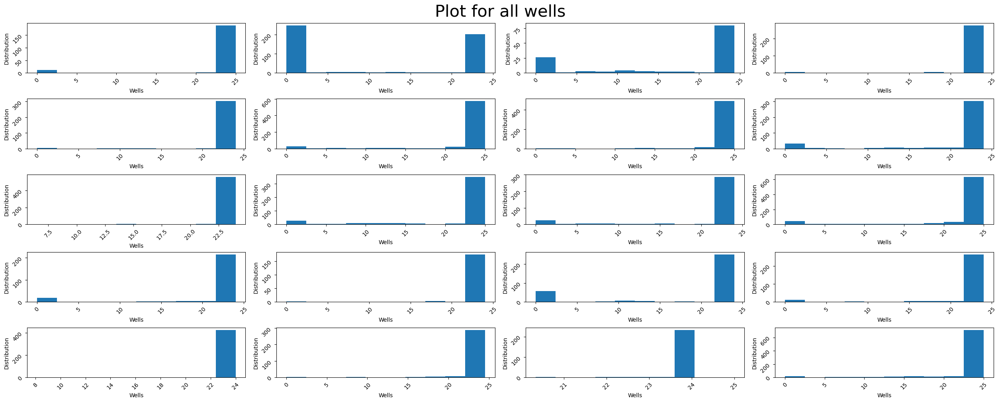

In [17]:
# Initial removal of unimportant features. Checking the trend on on stream hours. Our assumption is that it's mostly 24hrs
# Visualizing with a box plot across wells
# From the trends, we get a sense of which features trend similarly. Below, we access the linearity of features with oil
subplot_locations=list(itertools.product([0,1,2,3,4], [0,1,2,3]))
fig, ax = plt.subplots(nrows=5, ncols=4, constrained_layout=True)
fig.suptitle('Plot for all wells', fontsize=30)
fig.set_size_inches(25, 10)

for well, subplot_location in zip(well_df['well_name'].unique(), subplot_locations):
    ax[subplot_location[0],subplot_location[1]].hist(well_df[well_df.well_name==well]['on_str_hrs'])
    ax[subplot_location[0],subplot_location[1]].tick_params(labelrotation=45)
    ax[subplot_location[0],subplot_location[1]].set_xlabel('Wells')
    ax[subplot_location[0],subplot_location[1]].set_ylabel('Distribution')
plt.show()

**Observation**

Most cases have a 24 hours stream on time but there's variation in some wells. So, we decided to leave that feature.

<a name="empirical analysis"></a>
## 3. Empirical Analysis

In [18]:
# Helper Functions
def get_reservoir(max_well_psi, rsv_col_to_use='init_psi'):
    rsv_output=[]
    for rsv in rsv_details.rsv_name.unique():
        rsv_psi=rsv_details[rsv_details.rsv_name==rsv][rsv_col_to_use].values[0]
        # Taking into consideration the constraints in question 1
        # and also that the bottom hole flowing pressure cannot be more than the reservoir pressure
        psi_differential=rsv_psi-max_well_psi
        
        # Now, if psi_differential is <= 200, well is most likely from that reservoir
        if psi_differential<=200 and psi_differential>=0:
            rsv_output.append(f"{rsv_psi} -> {rsv}")
        else:
            pass
    return ', '.join(rsv_output)

def get_saturation_type(bool_):
    if bool_==True:
        return 'Saturated'
    elif bool_==False:
        return 'Undersat'

def get_rsv_name(rsv, kind='name'):
    if kind == 'name':
        return rsv[-4:]
    else:
        return rsv[0:4]

def plot_template(df, all_wells, coordinates, column, save='Y'):
    fig, ax = plt.subplots(nrows=10, ncols=2, constrained_layout=True)
    fig.suptitle('Plot for all wells', fontsize=30)
    fig.set_size_inches(20, 50)
    if 'gor' in column.lower():
        for well, subplot_location in zip(all_wells, coordinates):
            ax[subplot_location[0],subplot_location[1]].plot(df[df.well_name==well].date_conv, df[df.well_name==well][column])
            ax[subplot_location[0],subplot_location[1]].plot(df[df.well_name==well].date_conv, df[df.well_name==well]['solution_gor'])
            ax[subplot_location[0],subplot_location[1]].tick_params(labelrotation=45)
            ax[subplot_location[0],subplot_location[1]].set_xlabel('Date')
            ax[subplot_location[0],subplot_location[1]].set_ylabel(column)
            ax[subplot_location[0],subplot_location[1]].set_title(well)
            ax[subplot_location[0],subplot_location[1]].grid()
    else:
        for well, subplot_location in zip(all_wells, coordinates):
            ax[subplot_location[0],subplot_location[1]].plot(df[df.well_name==well].date_conv, df[df.well_name==well][column])
            ax[subplot_location[0],subplot_location[1]].tick_params(labelrotation=45)
            ax[subplot_location[0],subplot_location[1]].set_xlabel('Date')
            ax[subplot_location[0],subplot_location[1]].set_ylabel(column)
            ax[subplot_location[0],subplot_location[1]].set_title(well)
            ax[subplot_location[0],subplot_location[1]].grid()
    if save=='Y':
        plt.savefig(f"{column}.png", dpi=500, bbox_inches='tight')
    else:
        pass
    plt.show()
    
def get_trend(df, all_wells, column, save='Y'):
    subplot_locations=list(itertools.product(list(range(10)), [0,1]))
    plot_template(df, all_wells, subplot_locations, column)

In [19]:
# Loading the Reservoir data
rsv_details=pd.read_csv('Data/reservoir_info.csv')

In [20]:
rsv_details.columns

Index(['Reservoir Name', 'Initial Reservoir Pressure (PSI)',
       'Bubble Point Pressure (PSI)',
       'Current Average Reservoir Pressure (PSI)',
       'Solution Gas-Oil-Ratio (SCF/BBL)', 'Formation Volume Factor (RB/STB)'],
      dtype='object')

In [21]:
rsv_details.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 6 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Reservoir Name                            5 non-null      object 
 1   Initial Reservoir Pressure (PSI)          5 non-null      object 
 2   Bubble Point Pressure (PSI)               5 non-null      object 
 3   Current Average Reservoir Pressure (PSI)  5 non-null      object 
 4   Solution Gas-Oil-Ratio (SCF/BBL)          5 non-null      object 
 5   Formation Volume Factor (RB/STB)          5 non-null      float64
dtypes: float64(1), object(5)
memory usage: 372.0+ bytes


In [22]:
# renaming columns
# Creating a dictionary to map old names to new names
rsv_rename_map={'Reservoir Name':'rsv_name','Initial Reservoir Pressure (PSI)':'init_psi', 'Bubble Point Pressure (PSI)':'bubble_psi',
               'Current Average Reservoir Pressure (PSI)':'current_avg_psi','Solution Gas-Oil-Ratio (SCF/BBL)':'solution_gor',
                'Formation Volume Factor (RB/STB)':'form_v_fact'}

In [23]:
# Renaming columns "INPLACE"
rsv_details.rename(columns=rsv_rename_map, inplace=True)

In [24]:
rsv_details

,rsv_name,init_psi,bubble_psi,current_avg_psi,solution_gor,form_v_fact
0,ACHI,"3,500","3,300","2,700",800,1.200
1,KEMA,"4,200","4,000","3,900",600,1.450
2,MAKO,"3,500","3,500","3,000",500,1.150
3,DEPU,"2,800","2,800","2,400","1,200",1.370
4,JANI,"4,500","4,300","4,200","1,000",1.300


In [25]:
rsv_details.columns

Index(['rsv_name', 'init_psi', 'bubble_psi', 'current_avg_psi', 'solution_gor',
       'form_v_fact'],
      dtype='object')

In [26]:
# Quick Cleaning
# Float investigation and conversions
conv_cols=['init_psi', 'bubble_psi', 'current_avg_psi', 'solution_gor']

for col in conv_cols:
    # Using try-except block for investigation
    try:
        # Same issue of , in the data is here
        rsv_details[col]=rsv_details[col].str.replace(',', '')
        rsv_details[col]=rsv_details[col].astype('float64')
    except Exception as e:
        print(f"Error in parsing column: {col}")
        raise Exception(e)

In [27]:
rsv_details.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   rsv_name         5 non-null      object 
 1   init_psi         5 non-null      float64
 2   bubble_psi       5 non-null      float64
 3   current_avg_psi  5 non-null      float64
 4   solution_gor     5 non-null      float64
 5   form_v_fact      5 non-null      float64
dtypes: float64(5), object(1)
memory usage: 372.0+ bytes


#### 1) Identify the reservoir each well is producing from assuming not more than 200 psi differential pressure at the maximum bottom hole pressure.

In [28]:
# Obtaining Max bottomhole pressure for all the wells
max_well_bottom_psis = well_df.groupby(['well_name'], as_index=False)['bottom_hole_psi'].max().sort_values('bottom_hole_psi', ascending=False)

# Applying helper function to max psi df
max_well_bottom_psis['reservoir']=max_well_bottom_psis['bottom_hole_psi'].apply(get_reservoir, rsv_col_to_use='init_psi')

In [29]:
max_well_bottom_psis

,well_name,bottom_hole_psi,reservoir
0,Well_#1,4096.000,4200.0 -> KEMA
1,Well_#10,4051.000,4200.0 -> KEMA
10,Well_#19,4036.000,4200.0 -> KEMA
6,Well_#15,4032.000,4200.0 -> KEMA
7,Well_#16,3836.000,
17,Well_#7,3821.000,
16,Well_#6,3797.000,
11,Well_#2,3735.000,
13,Well_#3,2985.000,
15,Well_#5,2933.000,


## Observation
Using the Initial PSI, we run into an issue where we can't get the reservoir of many wells. To remedy that, we try the same thing with the current average psi.

In [30]:
# Applying helper function to max psi df with current average this time
max_well_bottom_psis['reservoir_using_avg']=max_well_bottom_psis['bottom_hole_psi'].apply(get_reservoir, rsv_col_to_use='current_avg_psi')

In [31]:
#max_well_bottom_psis.to_excel('reservoirs.xlsx')

In [32]:
# Sorting by well number
max_well_bottom_psis.sort_values('well_name',  key=lambda col: col.str.replace('Well_#', '').astype('int'), inplace=True)

In [33]:
max_well_bottom_psis

,well_name,bottom_hole_psi,reservoir,reservoir_using_avg
0,Well_#1,4096.000,4200.0 -> KEMA,4200.0 -> JANI
11,Well_#2,3735.000,,3900.0 -> KEMA
13,Well_#3,2985.000,,3000.0 -> MAKO
14,Well_#4,2340.000,,2400.0 -> DEPU
15,Well_#5,2933.000,,3000.0 -> MAKO
16,Well_#6,3797.000,,3900.0 -> KEMA
17,Well_#7,3821.000,,3900.0 -> KEMA
18,Well_#8,2681.000,2800.0 -> DEPU,2700.0 -> ACHI
19,Well_#9,2333.000,,2400.0 -> DEPU
1,Well_#10,4051.000,4200.0 -> KEMA,4200.0 -> JANI


In [34]:
# We decided to get the bottomhole Flowing pressure which is the pressure where oil and gas production had started
# removing days where both oil and gas is 0

non_zero_days=well_df.copy()
non_zero_days=non_zero_days[(non_zero_days.cumm_oil_stb!=0)&(non_zero_days.cumm_form_gas_mscf!=0)]

In [35]:
# Recomputing max
# Obtaining Max bottomhole pressure for all the wells
max_well_bottom_psis_nz = non_zero_days.groupby(['well_name'], as_index=False)['bottom_hole_psi'].max().sort_values('bottom_hole_psi', ascending=False)

# Applying helper function to max psi df
max_well_bottom_psis_nz['reservoir']=max_well_bottom_psis_nz['bottom_hole_psi'].apply(get_reservoir, rsv_col_to_use='init_psi')
max_well_bottom_psis_nz['reservoir_with_avg']=max_well_bottom_psis_nz['bottom_hole_psi'].apply(get_reservoir, rsv_col_to_use='current_avg_psi')

In [36]:
max_well_bottom_psis_nz.sort_values('well_name',  key=lambda col: col.str.replace('Well_#', '').astype('int'), inplace=True)

In [37]:
# Using bhfp , we are unable to classify well 16
max_well_bottom_psis_nz

,well_name,bottom_hole_psi,reservoir,reservoir_with_avg
0,Well_#1,3777.000,,3900.0 -> KEMA
11,Well_#2,3735.000,,3900.0 -> KEMA
13,Well_#3,2985.000,,3000.0 -> MAKO
14,Well_#4,2340.000,,2400.0 -> DEPU
15,Well_#5,2933.000,,3000.0 -> MAKO
16,Well_#6,3797.000,,3900.0 -> KEMA
17,Well_#7,3821.000,,3900.0 -> KEMA
18,Well_#8,2681.000,2800.0 -> DEPU,2700.0 -> ACHI
19,Well_#9,2333.000,,2400.0 -> DEPU
1,Well_#10,4051.000,4200.0 -> KEMA,4200.0 -> JANI


In [38]:
#max_well_bottom_psis.to_excel('reservoirs_with_bhp.xlsx', index=False)
#max_well_bottom_psis_nz.to_excel('reservoirs_bhfp.xlsx', index=False)

**Summaries**

1. We are able to classifiy all the wells using the current average psi and the maximum bottom hole pressure.

#### 2) Determine for each reservoir whether saturated or undersaturated using the initial condition.
1. Reservoir is Saturated when the Initial Pressure <= Bubble point
2. Reservoir is Undersaturated when the Initial Pressure > Bubble point

In [39]:
# Adding the Undersat/Saturated details to the rsv dataframe
rsv_details['rsv_type'] = rsv_details['init_psi'] <= rsv_details['bubble_psi']
rsv_details['rsv_type'] = rsv_details['rsv_type'].map(get_saturation_type)

In [40]:
rsv_details

,rsv_name,init_psi,bubble_psi,current_avg_psi,solution_gor,form_v_fact,rsv_type
0,ACHI,3500.000,3300.000,2700.000,800.000,1.200,Undersat
1,KEMA,4200.000,4000.000,3900.000,600.000,1.450,Undersat
2,MAKO,3500.000,3500.000,3000.000,500.000,1.150,Saturated
3,DEPU,2800.000,2800.000,2400.000,1200.000,1.370,Saturated
4,JANI,4500.000,4300.000,4200.000,1000.000,1.300,Undersat


In [41]:
# Adding the Reservoir details to the max_well dataframe
max_well_bottom_psis['rsv_name']=max_well_bottom_psis['reservoir_using_avg'].apply(get_rsv_name)
max_well_bottom_psis['rsv_value']=max_well_bottom_psis['reservoir_using_avg'].apply(get_rsv_name, kind='value')

In [42]:
max_well_bottom_psis=pd.merge(max_well_bottom_psis, rsv_details[['rsv_name', 'rsv_type']], on='rsv_name', how='left')
max_well_bottom_psis

,well_name,bottom_hole_psi,reservoir,reservoir_using_avg,rsv_name,rsv_value,rsv_type
0,Well_#1,4096.000,4200.0 -> KEMA,4200.0 -> JANI,JANI,4200,Undersat
1,Well_#2,3735.000,,3900.0 -> KEMA,KEMA,3900,Undersat
2,Well_#3,2985.000,,3000.0 -> MAKO,MAKO,3000,Saturated
3,Well_#4,2340.000,,2400.0 -> DEPU,DEPU,2400,Saturated
4,Well_#5,2933.000,,3000.0 -> MAKO,MAKO,3000,Saturated
5,Well_#6,3797.000,,3900.0 -> KEMA,KEMA,3900,Undersat
6,Well_#7,3821.000,,3900.0 -> KEMA,KEMA,3900,Undersat
7,Well_#8,2681.000,2800.0 -> DEPU,2700.0 -> ACHI,ACHI,2700,Undersat
8,Well_#9,2333.000,,2400.0 -> DEPU,DEPU,2400,Saturated
9,Well_#10,4051.000,4200.0 -> KEMA,4200.0 -> JANI,JANI,4200,Undersat


#### 3) Identify whether the well is naturally flowing or gas lifted
The well is Naturally flowing when formation gas is equal to the total gas. So, we will need the dataset to classify these.

In [43]:
well_df

,date,well_name,on_str_hrs,bottom_hole_psi,downhole_temp,Annulus_p,choke_size,whp,wht,cumm_oil_stb,cumm_form_gas_mscf,cumm_total_gas_mscf,cumm_water_bbl,date_conv
0,15-Feb-14,Well_#1,0.000,4050.000,189.866,0.000,1.180,482.460,50.864,0.000,0.000,0.000,0.000,2014-02-15
1,16-Feb-14,Well_#1,0.000,3961.000,189.945,0.000,2.994,328.601,47.668,0.000,0.000,0.000,0.000,2014-02-16
2,17-Feb-14,Well_#1,0.000,3961.000,190.004,0.000,1.903,387.218,48.962,0.000,0.000,0.000,0.000,2014-02-17
3,18-Feb-14,Well_#1,0.000,3964.000,190.020,0.000,0.000,308.980,46.636,0.000,0.000,0.000,0.000,2014-02-18
4,19-Feb-14,Well_#1,0.000,3965.000,190.107,0.000,30.208,196.057,47.297,0.000,0.000,0.000,0.000,2014-02-19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7950,05-Apr-15,Well_#20,18.940,2505.000,149.177,633.188,77.321,115.406,85.532,497425.000,235131.000,352697.000,522788.000,2015-04-05
7951,06-Apr-15,Well_#20,21.060,2503.000,149.169,617.591,72.403,116.285,84.959,497609.000,235205.000,352808.000,523266.000,2015-04-06
7952,07-Apr-15,Well_#20,24.000,2481.000,149.175,645.435,100.000,111.943,87.361,497879.000,235314.000,352971.000,523885.000,2015-04-07
7953,08-Apr-15,Well_#20,15.940,2485.000,149.178,651.282,76.408,111.962,87.583,498019.000,235370.000,353055.000,524431.000,2015-04-08


In [44]:
# Obtaining the well oil, formation gas, total gas and water production from the cummulative
all_wells=well_df.well_name.unique()

In [45]:
well_df.columns

Index(['date', 'well_name', 'on_str_hrs', 'bottom_hole_psi', 'downhole_temp',
       'Annulus_p', 'choke_size', 'whp', 'wht', 'cumm_oil_stb',
       'cumm_form_gas_mscf', 'cumm_total_gas_mscf', 'cumm_water_bbl',
       'date_conv'],
      dtype='object')

In [46]:
cumm_feats=['cumm_oil_stb', 'cumm_form_gas_mscf', 'cumm_total_gas_mscf', 'cumm_water_bbl']
cp=well_df.copy()
df_=pd.DataFrame(columns=['date', 'well_name', 'on_str_hrs', 'bottom_hole_psi', 'downhole_temp',
       'Annulus_p', 'choke_size', 'whp', 'wht', 'cumm_oil_stb',
       'cumm_form_gas_mscf', 'cumm_total_gas_mscf', 'cumm_water_bbl',
       'date_conv', 'oil_stb', 'form_gas_mscf', 'total_gas_mscf', 'water_bbl'])

flow_status={}

for well_n in all_wells:
    df=cp[cp.well_name==well_n]
    shp=df.shape
    df.sort_values('date_conv', ascending=True, inplace=True)
    for feat in cumm_feats:
        new_feat=feat.replace('cumm_', '')
        df[new_feat]=df[feat]-df[feat].shift(1)
        df.fillna(method='bfill', inplace=True)
        #display(df)
    # Confirming that well is natural flowing or not
    equal_count=sum(df['form_gas_mscf']==df['total_gas_mscf'])
    df_=pd.concat([df_,df], axis=0)

    if equal_count==shp[0]:
        flow_status[well_n]='Natural Flowing'
        print(f"{well_n} is Natural Flowing")
    else:
        flow_status[well_n]='Gas Lifted'
        print(f"{well_n} is Gas Lifted")
    

    

Well_#1 is Gas Lifted
Well_#2 is Natural Flowing
Well_#3 is Gas Lifted
Well_#4 is Gas Lifted
Well_#5 is Natural Flowing
Well_#6 is Natural Flowing
Well_#7 is Gas Lifted
Well_#8 is Gas Lifted
Well_#9 is Gas Lifted
Well_#10 is Natural Flowing
Well_#11 is Gas Lifted
Well_#12 is Natural Flowing
Well_#13 is Natural Flowing
Well_#14 is Natural Flowing
Well_#15 is Natural Flowing
Well_#16 is Natural Flowing
Well_#17 is Gas Lifted
Well_#18 is Natural Flowing
Well_#19 is Natural Flowing
Well_#20 is Gas Lifted


In [47]:
# Changing to df to join
cols = ['flow_status']
flow_df = pd.DataFrame.from_dict(flow_status, orient='index', columns=cols)
flow_df.reset_index(inplace=True, names='well_name')


In [48]:
flow_df

,well_name,flow_status
0,Well_#1,Gas Lifted
1,Well_#2,Natural Flowing
2,Well_#3,Gas Lifted
3,Well_#4,Gas Lifted
4,Well_#5,Natural Flowing
5,Well_#6,Natural Flowing
6,Well_#7,Gas Lifted
7,Well_#8,Gas Lifted
8,Well_#9,Gas Lifted
9,Well_#10,Natural Flowing


In [49]:
max_well_bottom_psis=pd.merge(max_well_bottom_psis, flow_df, on='well_name', how='left')
max_well_bottom_psis

,well_name,bottom_hole_psi,reservoir,reservoir_using_avg,rsv_name,rsv_value,rsv_type,flow_status
0,Well_#1,4096.000,4200.0 -> KEMA,4200.0 -> JANI,JANI,4200,Undersat,Gas Lifted
1,Well_#2,3735.000,,3900.0 -> KEMA,KEMA,3900,Undersat,Natural Flowing
2,Well_#3,2985.000,,3000.0 -> MAKO,MAKO,3000,Saturated,Gas Lifted
3,Well_#4,2340.000,,2400.0 -> DEPU,DEPU,2400,Saturated,Gas Lifted
4,Well_#5,2933.000,,3000.0 -> MAKO,MAKO,3000,Saturated,Natural Flowing
5,Well_#6,3797.000,,3900.0 -> KEMA,KEMA,3900,Undersat,Natural Flowing
6,Well_#7,3821.000,,3900.0 -> KEMA,KEMA,3900,Undersat,Gas Lifted
7,Well_#8,2681.000,2800.0 -> DEPU,2700.0 -> ACHI,ACHI,2700,Undersat,Gas Lifted
8,Well_#9,2333.000,,2400.0 -> DEPU,DEPU,2400,Saturated,Gas Lifted
9,Well_#10,4051.000,4200.0 -> KEMA,4200.0 -> JANI,JANI,4200,Undersat,Natural Flowing


In [50]:
well_df_analysis=df_

In [51]:
well_df_analysis.drop(cumm_feats, axis=1, inplace=True)

In [52]:
#well_df_analysis.to_csv('tt.csv')

In [53]:
well_df_analysis.head()

,date,well_name,on_str_hrs,bottom_hole_psi,downhole_temp,Annulus_p,choke_size,whp,wht,date_conv,oil_stb,form_gas_mscf,total_gas_mscf,water_bbl
0,15-Feb-14,Well_#1,0.000,4050.000,189.866,0.000,1.180,482.460,50.864,2014-02-15,0.000,0.000,0.000,0.000
1,16-Feb-14,Well_#1,0.000,3961.000,189.945,0.000,2.994,328.601,47.668,2014-02-16,0.000,0.000,0.000,0.000
2,17-Feb-14,Well_#1,0.000,3961.000,190.004,0.000,1.903,387.218,48.962,2014-02-17,0.000,0.000,0.000,0.000
3,18-Feb-14,Well_#1,0.000,3964.000,190.020,0.000,0.000,308.980,46.636,2014-02-18,0.000,0.000,0.000,0.000
4,19-Feb-14,Well_#1,0.000,3965.000,190.107,0.000,30.208,196.057,47.297,2014-02-19,0.000,0.000,0.000,0.000


In [54]:
# Adding Solution GOR value based on reservoir
max_well_bottom_psis=pd.merge(max_well_bottom_psis, rsv_details[['rsv_name', 'solution_gor']], on='rsv_name', how='left')

In [55]:
max_well_bottom_psis

,well_name,bottom_hole_psi,reservoir,reservoir_using_avg,rsv_name,rsv_value,rsv_type,flow_status,solution_gor
0,Well_#1,4096.000,4200.0 -> KEMA,4200.0 -> JANI,JANI,4200,Undersat,Gas Lifted,1000.000
1,Well_#2,3735.000,,3900.0 -> KEMA,KEMA,3900,Undersat,Natural Flowing,600.000
2,Well_#3,2985.000,,3000.0 -> MAKO,MAKO,3000,Saturated,Gas Lifted,500.000
3,Well_#4,2340.000,,2400.0 -> DEPU,DEPU,2400,Saturated,Gas Lifted,1200.000
4,Well_#5,2933.000,,3000.0 -> MAKO,MAKO,3000,Saturated,Natural Flowing,500.000
5,Well_#6,3797.000,,3900.0 -> KEMA,KEMA,3900,Undersat,Natural Flowing,600.000
6,Well_#7,3821.000,,3900.0 -> KEMA,KEMA,3900,Undersat,Gas Lifted,600.000
7,Well_#8,2681.000,2800.0 -> DEPU,2700.0 -> ACHI,ACHI,2700,Undersat,Gas Lifted,800.000
8,Well_#9,2333.000,,2400.0 -> DEPU,DEPU,2400,Saturated,Gas Lifted,1200.000
9,Well_#10,4051.000,4200.0 -> KEMA,4200.0 -> JANI,JANI,4200,Undersat,Natural Flowing,1000.000


In [56]:
well_df_analysis=pd.merge(well_df_analysis, max_well_bottom_psis[['well_name', 'rsv_name', 'rsv_value', 'solution_gor']], on='well_name', how='left')

In [57]:
well_df_analysis

,date,well_name,on_str_hrs,bottom_hole_psi,downhole_temp,Annulus_p,choke_size,whp,wht,date_conv,oil_stb,form_gas_mscf,total_gas_mscf,water_bbl,rsv_name,rsv_value,solution_gor
0,15-Feb-14,Well_#1,0.000,4050.000,189.866,0.000,1.180,482.460,50.864,2014-02-15,0.000,0.000,0.000,0.000,JANI,4200,1000.000
1,16-Feb-14,Well_#1,0.000,3961.000,189.945,0.000,2.994,328.601,47.668,2014-02-16,0.000,0.000,0.000,0.000,JANI,4200,1000.000
2,17-Feb-14,Well_#1,0.000,3961.000,190.004,0.000,1.903,387.218,48.962,2014-02-17,0.000,0.000,0.000,0.000,JANI,4200,1000.000
3,18-Feb-14,Well_#1,0.000,3964.000,190.020,0.000,0.000,308.980,46.636,2014-02-18,0.000,0.000,0.000,0.000,JANI,4200,1000.000
4,19-Feb-14,Well_#1,0.000,3965.000,190.107,0.000,30.208,196.057,47.297,2014-02-19,0.000,0.000,0.000,0.000,JANI,4200,1000.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7950,05-Apr-15,Well_#20,18.940,2505.000,149.177,633.188,77.321,115.406,85.532,2015-04-05,170.000,67.000,101.000,445.000,MAKO,3000,500.000
7951,06-Apr-15,Well_#20,21.060,2503.000,149.169,617.591,72.403,116.285,84.959,2015-04-06,184.000,74.000,111.000,478.000,MAKO,3000,500.000
7952,07-Apr-15,Well_#20,24.000,2481.000,149.175,645.435,100.000,111.943,87.361,2015-04-07,270.000,109.000,163.000,619.000,MAKO,3000,500.000
7953,08-Apr-15,Well_#20,15.940,2485.000,149.178,651.282,76.408,111.962,87.583,2015-04-08,140.000,56.000,84.000,546.000,MAKO,3000,500.000


In [58]:
well_df_analysis['rsv_value'] = well_df_analysis['rsv_value'].astype('float64')
well_df_analysis['solution_gor'] = well_df_analysis['solution_gor'].astype('float64')
well_df_analysis

,date,well_name,on_str_hrs,bottom_hole_psi,downhole_temp,Annulus_p,choke_size,whp,wht,date_conv,oil_stb,form_gas_mscf,total_gas_mscf,water_bbl,rsv_name,rsv_value,solution_gor
0,15-Feb-14,Well_#1,0.000,4050.000,189.866,0.000,1.180,482.460,50.864,2014-02-15,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000
1,16-Feb-14,Well_#1,0.000,3961.000,189.945,0.000,2.994,328.601,47.668,2014-02-16,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000
2,17-Feb-14,Well_#1,0.000,3961.000,190.004,0.000,1.903,387.218,48.962,2014-02-17,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000
3,18-Feb-14,Well_#1,0.000,3964.000,190.020,0.000,0.000,308.980,46.636,2014-02-18,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000
4,19-Feb-14,Well_#1,0.000,3965.000,190.107,0.000,30.208,196.057,47.297,2014-02-19,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7950,05-Apr-15,Well_#20,18.940,2505.000,149.177,633.188,77.321,115.406,85.532,2015-04-05,170.000,67.000,101.000,445.000,MAKO,3000.000,500.000
7951,06-Apr-15,Well_#20,21.060,2503.000,149.169,617.591,72.403,116.285,84.959,2015-04-06,184.000,74.000,111.000,478.000,MAKO,3000.000,500.000
7952,07-Apr-15,Well_#20,24.000,2481.000,149.175,645.435,100.000,111.943,87.361,2015-04-07,270.000,109.000,163.000,619.000,MAKO,3000.000,500.000
7953,08-Apr-15,Well_#20,15.940,2485.000,149.178,651.282,76.408,111.962,87.583,2015-04-08,140.000,56.000,84.000,546.000,MAKO,3000.000,500.000


#### 4) Determine if production from a well is steady or unsteady. Consider unsteady wells as those with more than 50% drop in oil production at least once every 3 to 6 months 

In [59]:
steady_unsteady_status={}

for w_ in all_wells:
    wl=well_df_analysis.copy()
    wl=wl[wl.well_name==w_]
    
    wl.sort_values('date_conv', ascending=True, inplace=True)
    wl['rate_drop']=((wl['oil_stb'].shift(1)-wl['oil_stb'])/(wl['oil_stb'].shift(1)+0.000001))*100
    min_date, max_date=wl.date_conv.min(), wl.date_conv.max()
    #print(min_date, max_date)
    
    curr_date=min_date
    while curr_date<max_date:
        next_date=curr_date+pd.DateOffset(months=6)
        wl=wl[(wl['date_conv'] > curr_date) & (wl['date_conv'] <= next_date)]
        date_diff=(wl['date_conv'].max()-wl['date_conv'].min()).days/30
        max_drop=wl['rate_drop'].max()
        if max_drop>50 and date_diff>=3 and date_diff<=6.1:
            print(max_drop, 'Unsteady')
            steady_unsteady_status[w_]='Unsteady'
            break
        else:
            steady_unsteady_status[w_]='Steady'
            print(date_diff, max_drop, 'Steady')
            break
        curr_date+=pd.DateOffset(months=6)
        

# since we have to check once in 3 to 6months, we could just roll and get the min rate every 6 months
    

82.14285687615956 Unsteady
99.99999975 Unsteady
99.99999987654321 Unsteady
70.8296942612841 Unsteady
99.99999933774835 Unsteady
99.99999997415352 Unsteady
77.45266776967718 Unsteady
99.99999991645781 Unsteady
87.71929812723441 Unsteady
99.99999935064936 Unsteady
99.9999997979798 Unsteady
99.99999986263737 Unsteady
99.99999896907218 Unsteady
6.066666666666666 37.17774757506411 Steady
99.99999978723405 Unsteady
6.1 49.04942947129495 Steady
87.71498760722974 Unsteady
99.99999984177215 Unsteady
6.066666666666666 25.411334505646554 Steady
99.99999978401728 Unsteady


In [60]:
# Changing to df to join
cols = ['steady_unsteady_status']
steady_unsteady_status_df = pd.DataFrame.from_dict(steady_unsteady_status, orient='index', columns=cols)
steady_unsteady_status_df.reset_index(inplace=True, names='well_name')

In [61]:
max_well_bottom_psis=pd.merge(max_well_bottom_psis, steady_unsteady_status_df, on='well_name', how='left')
max_well_bottom_psis

,well_name,bottom_hole_psi,reservoir,reservoir_using_avg,rsv_name,rsv_value,rsv_type,flow_status,solution_gor,steady_unsteady_status
0,Well_#1,4096.000,4200.0 -> KEMA,4200.0 -> JANI,JANI,4200,Undersat,Gas Lifted,1000.000,Unsteady
1,Well_#2,3735.000,,3900.0 -> KEMA,KEMA,3900,Undersat,Natural Flowing,600.000,Unsteady
2,Well_#3,2985.000,,3000.0 -> MAKO,MAKO,3000,Saturated,Gas Lifted,500.000,Unsteady
3,Well_#4,2340.000,,2400.0 -> DEPU,DEPU,2400,Saturated,Gas Lifted,1200.000,Unsteady
4,Well_#5,2933.000,,3000.0 -> MAKO,MAKO,3000,Saturated,Natural Flowing,500.000,Unsteady
5,Well_#6,3797.000,,3900.0 -> KEMA,KEMA,3900,Undersat,Natural Flowing,600.000,Unsteady
6,Well_#7,3821.000,,3900.0 -> KEMA,KEMA,3900,Undersat,Gas Lifted,600.000,Unsteady
7,Well_#8,2681.000,2800.0 -> DEPU,2700.0 -> ACHI,ACHI,2700,Undersat,Gas Lifted,800.000,Unsteady
8,Well_#9,2333.000,,2400.0 -> DEPU,DEPU,2400,Saturated,Gas Lifted,1200.000,Unsteady
9,Well_#10,4051.000,4200.0 -> KEMA,4200.0 -> JANI,JANI,4200,Undersat,Natural Flowing,1000.000,Unsteady


In [62]:
well_df_analysis.head(20)

,date,well_name,on_str_hrs,bottom_hole_psi,downhole_temp,Annulus_p,choke_size,whp,wht,date_conv,oil_stb,form_gas_mscf,total_gas_mscf,water_bbl,rsv_name,rsv_value,solution_gor
0,15-Feb-14,Well_#1,0.000,4050.000,189.866,0.000,1.180,482.460,50.864,2014-02-15,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000
1,16-Feb-14,Well_#1,0.000,3961.000,189.945,0.000,2.994,328.601,47.668,2014-02-16,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000
2,17-Feb-14,Well_#1,0.000,3961.000,190.004,0.000,1.903,387.218,48.962,2014-02-17,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000
3,18-Feb-14,Well_#1,0.000,3964.000,190.020,0.000,0.000,308.980,46.636,2014-02-18,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000
4,19-Feb-14,Well_#1,0.000,3965.000,190.107,0.000,30.208,196.057,47.297,2014-02-19,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000
5,20-Feb-14,Well_#1,0.000,3964.000,190.181,0.000,0.000,58.036,47.878,2014-02-20,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000
6,21-Feb-14,Well_#1,0.000,3972.000,189.939,0.000,39.999,304.692,47.938,2014-02-21,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000
7,22-Feb-14,Well_#1,0.000,3978.000,189.609,0.000,0.000,453.734,49.351,2014-02-22,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000
8,23-Feb-14,Well_#1,0.000,3985.000,189.435,0.000,0.424,667.130,49.351,2014-02-23,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000
9,24-Feb-14,Well_#1,0.000,4096.000,189.343,0.000,0.441,440.036,49.316,2014-02-24,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000


#### 5) Determine from the formation GOR trend whether the well is flowing at/below or above the solution GOR of the selected reservoir or a combination of both trends

Formation Gas-Oil Ratio (GOR) is the formation gas production divided by the oil production.

In [63]:
well_df_analysis.head()

,date,well_name,on_str_hrs,bottom_hole_psi,downhole_temp,Annulus_p,choke_size,whp,wht,date_conv,oil_stb,form_gas_mscf,total_gas_mscf,water_bbl,rsv_name,rsv_value,solution_gor
0,15-Feb-14,Well_#1,0.000,4050.000,189.866,0.000,1.180,482.460,50.864,2014-02-15,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000
1,16-Feb-14,Well_#1,0.000,3961.000,189.945,0.000,2.994,328.601,47.668,2014-02-16,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000
2,17-Feb-14,Well_#1,0.000,3961.000,190.004,0.000,1.903,387.218,48.962,2014-02-17,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000
3,18-Feb-14,Well_#1,0.000,3964.000,190.020,0.000,0.000,308.980,46.636,2014-02-18,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000
4,19-Feb-14,Well_#1,0.000,3965.000,190.107,0.000,30.208,196.057,47.297,2014-02-19,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000


In [64]:
well_df_analysis['formation_GOR']=(well_df_analysis['form_gas_mscf']*1000)/(well_df_analysis['oil_stb']+0.0000001)

In [65]:
well_df_analysis.head(15)

,date,well_name,on_str_hrs,bottom_hole_psi,downhole_temp,Annulus_p,choke_size,whp,wht,date_conv,oil_stb,form_gas_mscf,total_gas_mscf,water_bbl,rsv_name,rsv_value,solution_gor,formation_GOR
0,15-Feb-14,Well_#1,0.000,4050.000,189.866,0.000,1.180,482.460,50.864,2014-02-15,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000
1,16-Feb-14,Well_#1,0.000,3961.000,189.945,0.000,2.994,328.601,47.668,2014-02-16,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000
2,17-Feb-14,Well_#1,0.000,3961.000,190.004,0.000,1.903,387.218,48.962,2014-02-17,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000
3,18-Feb-14,Well_#1,0.000,3964.000,190.020,0.000,0.000,308.980,46.636,2014-02-18,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000
4,19-Feb-14,Well_#1,0.000,3965.000,190.107,0.000,30.208,196.057,47.297,2014-02-19,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000
5,20-Feb-14,Well_#1,0.000,3964.000,190.181,0.000,0.000,58.036,47.878,2014-02-20,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000
6,21-Feb-14,Well_#1,0.000,3972.000,189.939,0.000,39.999,304.692,47.938,2014-02-21,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000
7,22-Feb-14,Well_#1,0.000,3978.000,189.609,0.000,0.000,453.734,49.351,2014-02-22,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000
8,23-Feb-14,Well_#1,0.000,3985.000,189.435,0.000,0.424,667.130,49.351,2014-02-23,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000
9,24-Feb-14,Well_#1,0.000,4096.000,189.343,0.000,0.441,440.036,49.316,2014-02-24,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000


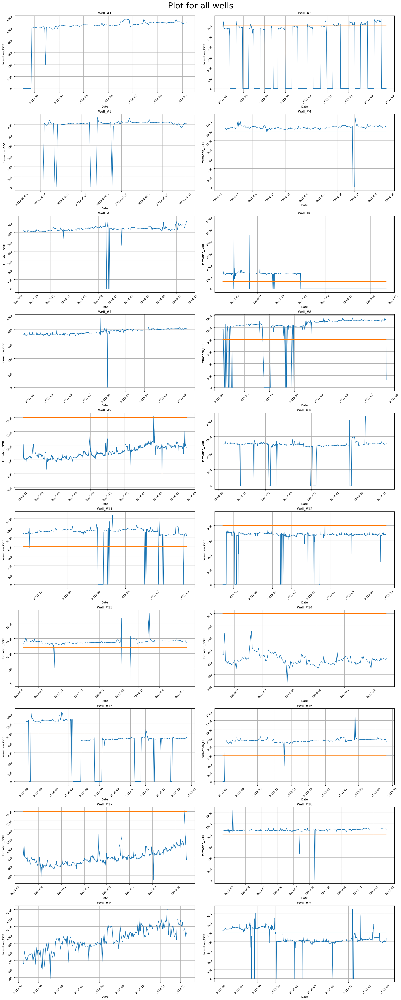

In [66]:
get_trend(well_df_analysis, all_wells, 'formation_GOR', save='n')

In [67]:
# Manually classifying
gor_=['aSolGOR',
'bSolGOR',
'aSolGOR',
'aSolGOR',
'aSolGOR',
'Combo',
'aSolGOR',
'aSolGOR',
'bSolGOR',
'aSolGOR',
'aSolGOR',
'bSolGOR',
'aSolGOR',
'bSolGOR',
'Combo',
'aSolGOR',
'bSolGOR',
'aSolGOR',
'Combo',
'Combo']

In [68]:
max_well_bottom_psis['gor_trend']=gor_

#### 6) Determine from the watercut trend whether it is Flat, Increasing, Decreasing or a Combination of 2 or more trends.

Water cut is percentage of liquid that is water. 

In [69]:
well_df_analysis.columns

Index(['date', 'well_name', 'on_str_hrs', 'bottom_hole_psi', 'downhole_temp',
       'Annulus_p', 'choke_size', 'whp', 'wht', 'date_conv', 'oil_stb',
       'form_gas_mscf', 'total_gas_mscf', 'water_bbl', 'rsv_name', 'rsv_value',
       'solution_gor', 'formation_GOR'],
      dtype='object')

In [70]:
well_df_analysis['water_cut']=(well_df_analysis['water_bbl']/(well_df_analysis['oil_stb']+well_df_analysis['water_bbl']+0.0000001))*100

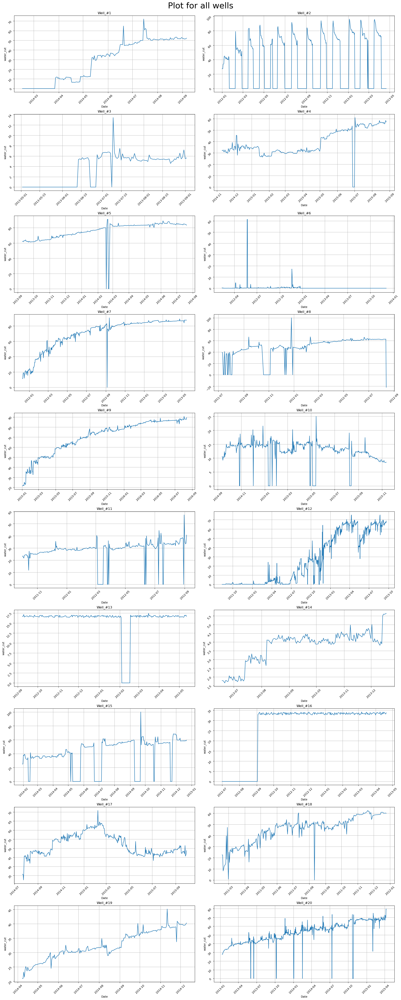

In [71]:
get_trend(well_df_analysis, all_wells, 'water_cut', save='n')

In [72]:
water_cut_=['Incr',
'Combo',
'Flat',
'Combo',
'Combo',
'flat',
'Incr',
'flat',
'Incr',
'Combo',
'Flat',
'Incr',
'Flat',
'Combo',
'Incr',
'Flat',
'Combo',
'Incr',
'Incr',
'Incr']

In [73]:
max_well_bottom_psis['water_cut_trend']=water_cut_

#### 7) Determine from the oil productivity index trend whether it is Flat, Increasing, Decreasing or a Combination of 2 or more trends. You may use average reservoir pressure for the oil productivity index computation 

In [74]:
well_df_analysis['pi']=(well_df_analysis['oil_stb']/(well_df_analysis['rsv_value']-well_df_analysis['bottom_hole_psi']+0.0000001))

In [75]:
well_df_analysis.head(10)

,date,well_name,on_str_hrs,bottom_hole_psi,downhole_temp,Annulus_p,choke_size,whp,wht,date_conv,oil_stb,form_gas_mscf,total_gas_mscf,water_bbl,rsv_name,rsv_value,solution_gor,formation_GOR,water_cut,pi
0,15-Feb-14,Well_#1,0.000,4050.000,189.866,0.000,1.180,482.460,50.864,2014-02-15,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000,0.000,0.000
1,16-Feb-14,Well_#1,0.000,3961.000,189.945,0.000,2.994,328.601,47.668,2014-02-16,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000,0.000,0.000
2,17-Feb-14,Well_#1,0.000,3961.000,190.004,0.000,1.903,387.218,48.962,2014-02-17,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000,0.000,0.000
3,18-Feb-14,Well_#1,0.000,3964.000,190.020,0.000,0.000,308.980,46.636,2014-02-18,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000,0.000,0.000
4,19-Feb-14,Well_#1,0.000,3965.000,190.107,0.000,30.208,196.057,47.297,2014-02-19,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000,0.000,0.000
5,20-Feb-14,Well_#1,0.000,3964.000,190.181,0.000,0.000,58.036,47.878,2014-02-20,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000,0.000,0.000
6,21-Feb-14,Well_#1,0.000,3972.000,189.939,0.000,39.999,304.692,47.938,2014-02-21,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000,0.000,0.000
7,22-Feb-14,Well_#1,0.000,3978.000,189.609,0.000,0.000,453.734,49.351,2014-02-22,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000,0.000,0.000
8,23-Feb-14,Well_#1,0.000,3985.000,189.435,0.000,0.424,667.130,49.351,2014-02-23,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000,0.000,0.000
9,24-Feb-14,Well_#1,0.000,4096.000,189.343,0.000,0.441,440.036,49.316,2014-02-24,0.000,0.000,0.000,0.000,JANI,4200.000,1000.000,0.000,0.000,0.000


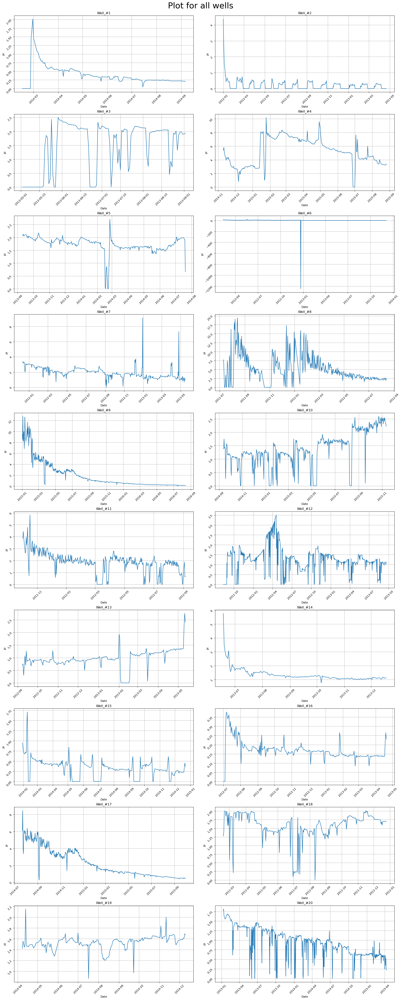

In [76]:
get_trend(well_df_analysis, all_wells, 'pi', save='n')

In [77]:
pi=['Decr',
'flat',
'combo',
'combo',
'flat',
'flat',
'flat',
'combo',
'Decr',
'Incr',
'Decr',
'combo',
'Incr',
'Decr',
'Decr',
'Combo',
'Decr',
'Combo',
'Flat',
'Decr']

In [78]:
len(pi)

20

In [79]:
max_well_bottom_psis['pi_trend']=pi

In [80]:
max_well_bottom_psis.columns

Index(['well_name', 'bottom_hole_psi', 'reservoir', 'reservoir_using_avg',
       'rsv_name', 'rsv_value', 'rsv_type', 'flow_status', 'solution_gor',
       'steady_unsteady_status', 'gor_trend', 'water_cut_trend', 'pi_trend'],
      dtype='object')

In [81]:
max_well_bottom_psis[['well_name', 'rsv_name', 'rsv_type', 'flow_status', 'steady_unsteady_status',
       'gor_trend', 'water_cut_trend', 'pi_trend']].to_excel('well_classification.xlsx', index=False)

In [82]:
# From the Pi graph, we notice some negative pi in well 6. On investigating, we notice that there is indeed a negative oil, gas and water reading
# and this was because the production dropped to 0 on that day and the day before didn't have 0. So, in the right sense, these should be 0.
well_df_analysis[well_df_analysis['pi']<0]

,date,well_name,on_str_hrs,bottom_hole_psi,downhole_temp,Annulus_p,choke_size,whp,wht,date_conv,oil_stb,form_gas_mscf,total_gas_mscf,water_bbl,rsv_name,rsv_value,solution_gor,formation_GOR,water_cut,pi
1723,22-Dec-12,Well_#6,24.000,2995.000,203.532,25.979,62.441,67.024,110.307,2012-12-22,-1129301.000,-1458660.000,-1458660.000,-22395.000,KEMA,3900.000,600.000,1291.649,1.945,-1247.846


In [83]:
# Setting -ve values to 0
lambd=lambda x: 0 if x < 0 else x

well_df_analysis['oil_stb']=well_df_analysis['oil_stb'].apply(lambd)
well_df_analysis['form_gas_mscf']=well_df_analysis['form_gas_mscf'].apply(lambd)
well_df_analysis['total_gas_mscf']=well_df_analysis['total_gas_mscf'].apply(lambd)
well_df_analysis['water_bbl']=well_df_analysis['water_bbl'].apply(lambd)
well_df_analysis['pi']=well_df_analysis['pi'].apply(lambd)

In [84]:
well_df_analysis[well_df_analysis['date_conv']=='2012-12-22']

,date,well_name,on_str_hrs,bottom_hole_psi,downhole_temp,Annulus_p,choke_size,whp,wht,date_conv,oil_stb,form_gas_mscf,total_gas_mscf,water_bbl,rsv_name,rsv_value,solution_gor,formation_GOR,water_cut,pi
560,22-Dec-12,Well_#2,0.000,3509.000,196.777,0.000,0.000,1677.880,48.724,2012-12-22,0.000,0.000,0.000,0.000,KEMA,3900.000,600.000,0.000,0.000,0.000
1723,22-Dec-12,Well_#6,24.000,2995.000,203.532,25.979,62.441,67.024,110.307,2012-12-22,0.000,0.000,0.000,0.000,KEMA,3900.000,600.000,1291.649,1.945,0.000
2449,22-Dec-12,Well_#7,24.000,3363.000,202.663,974.673,49.474,321.448,94.885,2012-12-22,747.000,590.000,862.000,3634.000,KEMA,3900.000,600.000,789.826,82.949,1.391
4815,22-Dec-12,Well_#12,23.990,2128.000,158.831,0.000,41.623,97.317,83.529,2012-12-22,853.000,573.000,573.000,741.000,ACHI,2700.000,800.000,671.747,46.487,1.491
5193,22-Dec-12,Well_#13,24.000,1572.000,106.643,18.220,11.726,41.872,35.745,2012-12-22,791.000,1081.000,1081.000,157.000,DEPU,2400.000,1200.000,1366.625,16.561,0.955
6020,22-Dec-12,Well_#16,24.000,2489.000,202.677,18.524,11.873,123.000,104.637,2012-12-22,230.000,213.000,213.000,116.000,KEMA,3900.000,600.000,926.087,33.526,0.163


<a name="eda"></a>
# 2. EDA

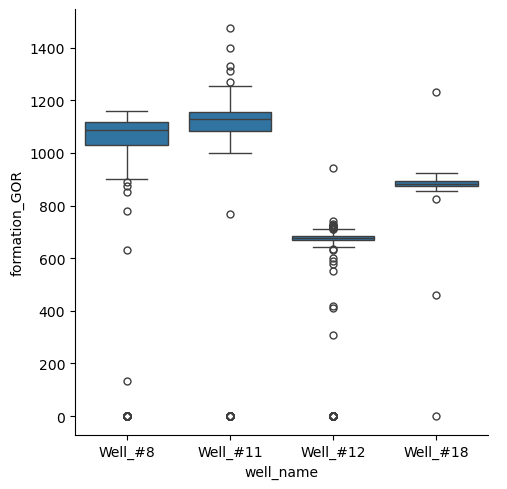

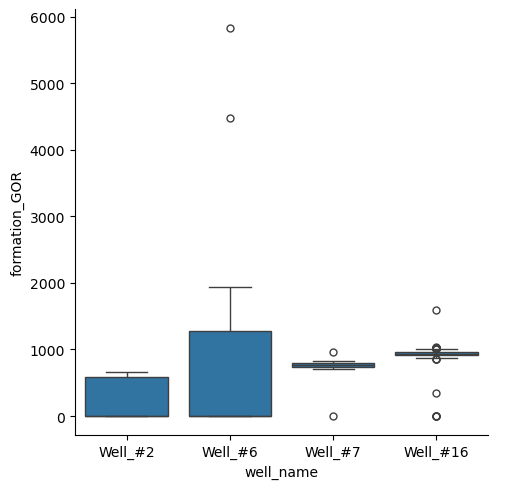

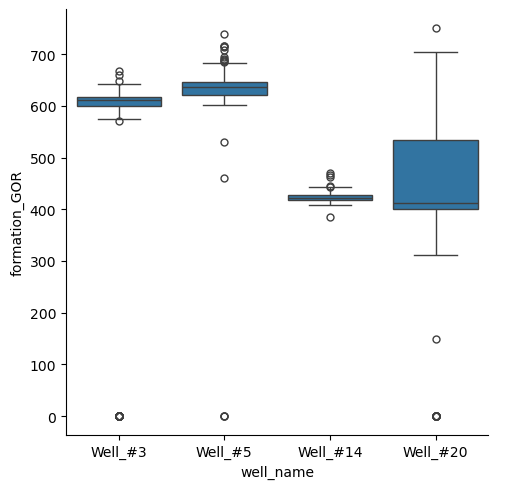

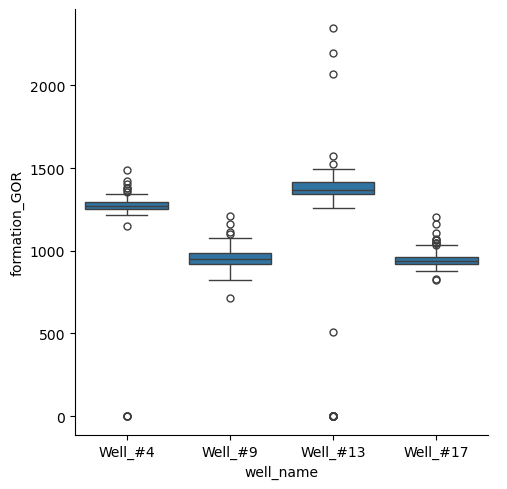

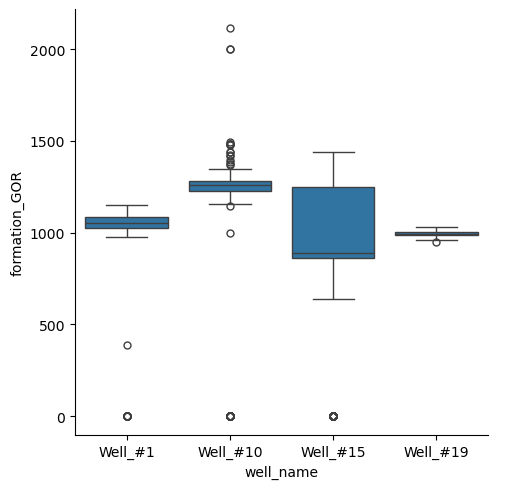

In [85]:
#GOR Distribution across Reservoirs
unique_rsvs=rsv_details.rsv_name.unique()
for rsv_ in unique_rsvs:
    rsv_df=well_df_analysis[well_df_analysis['rsv_name']==rsv_]
    sns.catplot(x='well_name', y='formation_GOR', data=rsv_df, kind='box')
    plt.show()

**Observation**

GORs are in similar range for most reservoirs. This indicates that GOR might be a good feature.

Displaying Production Profiles for Wells in Reservoir ACHI


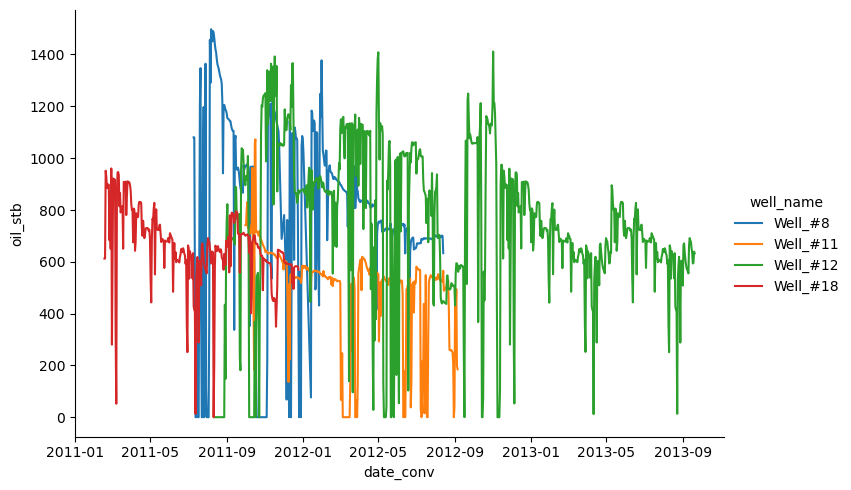

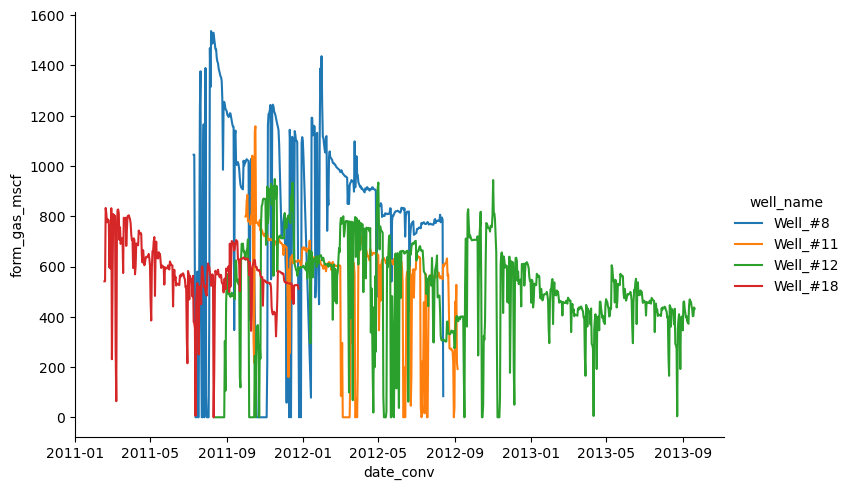

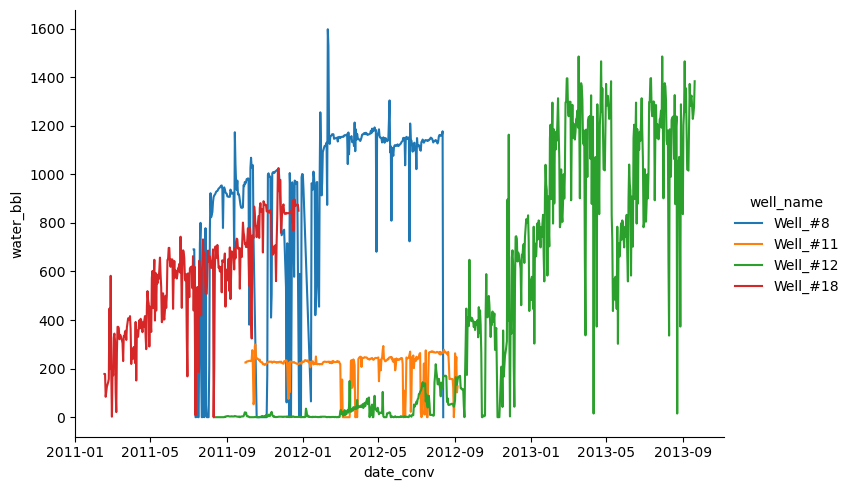



Displaying Production Profiles for Wells in Reservoir KEMA


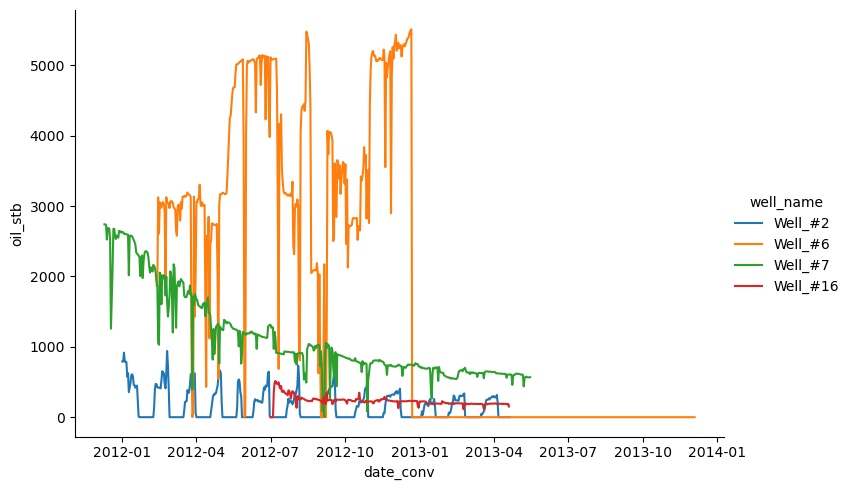

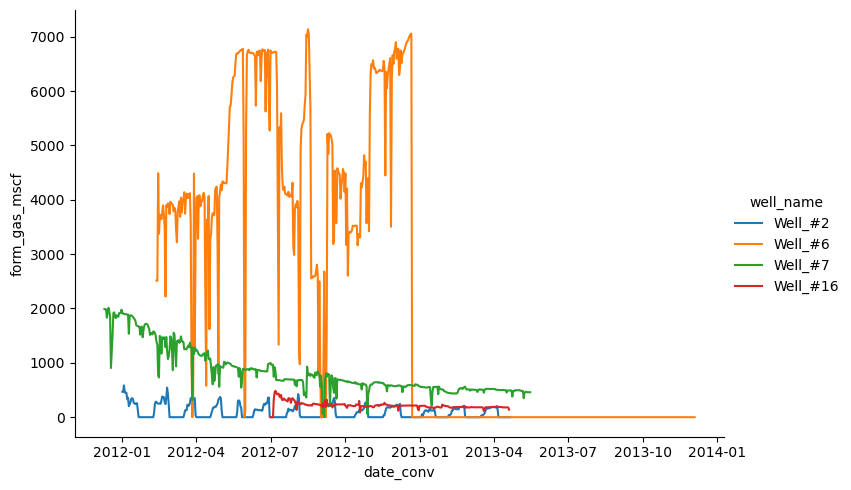

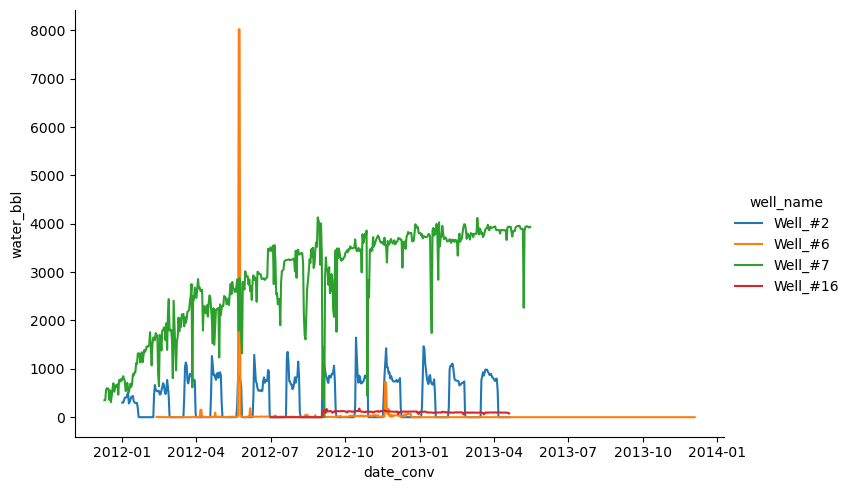



Displaying Production Profiles for Wells in Reservoir MAKO


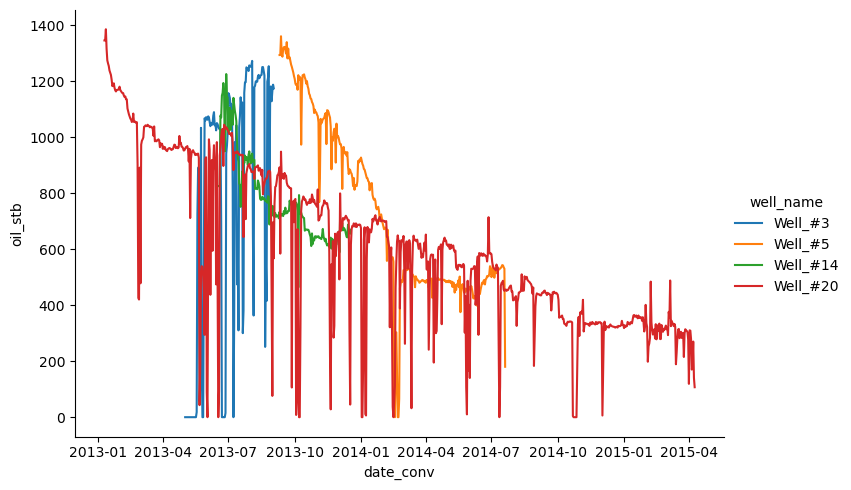

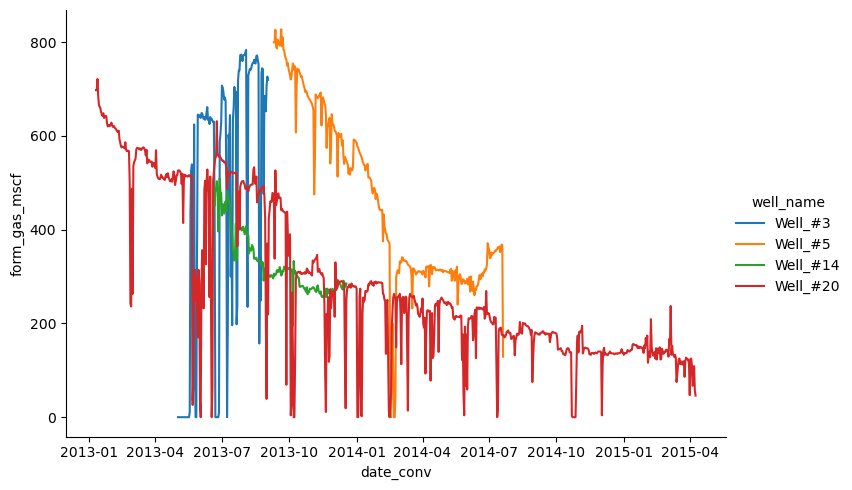

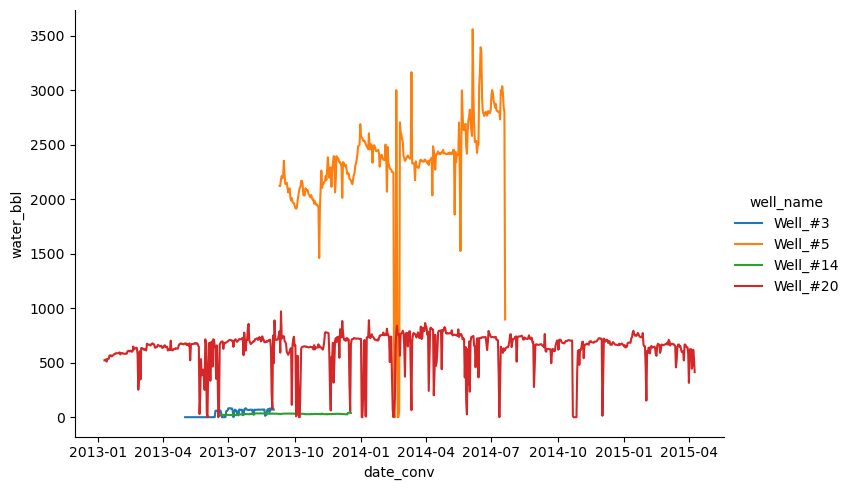



Displaying Production Profiles for Wells in Reservoir DEPU


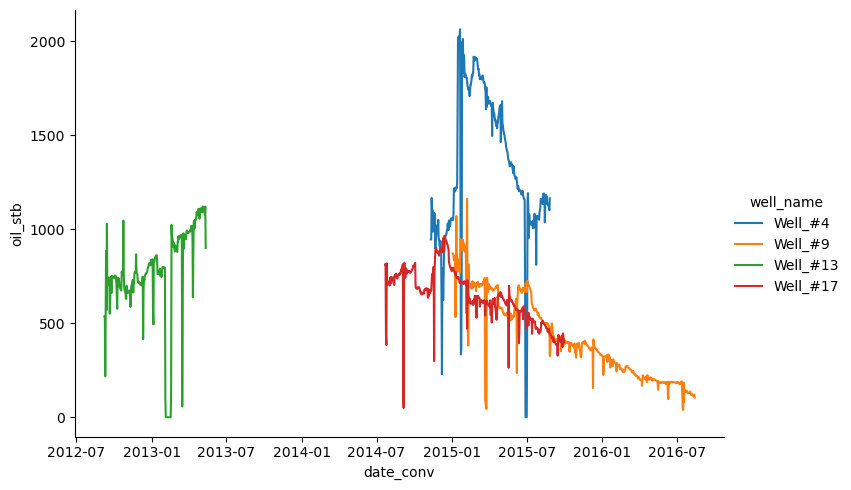

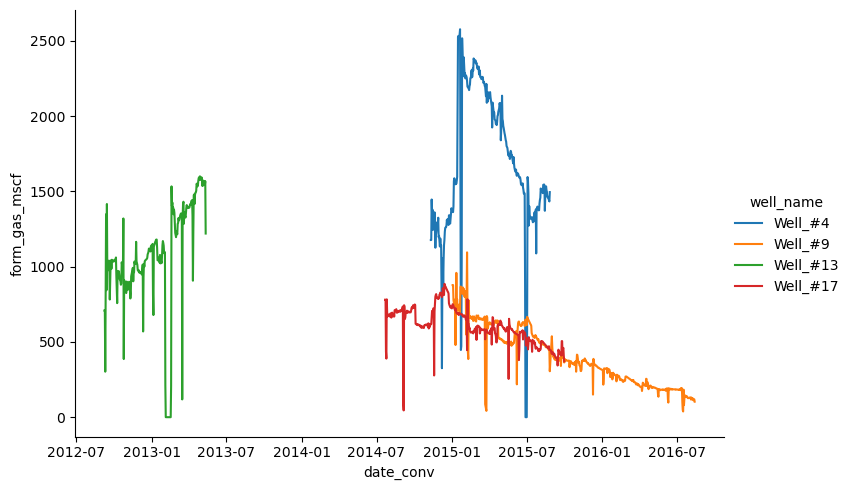

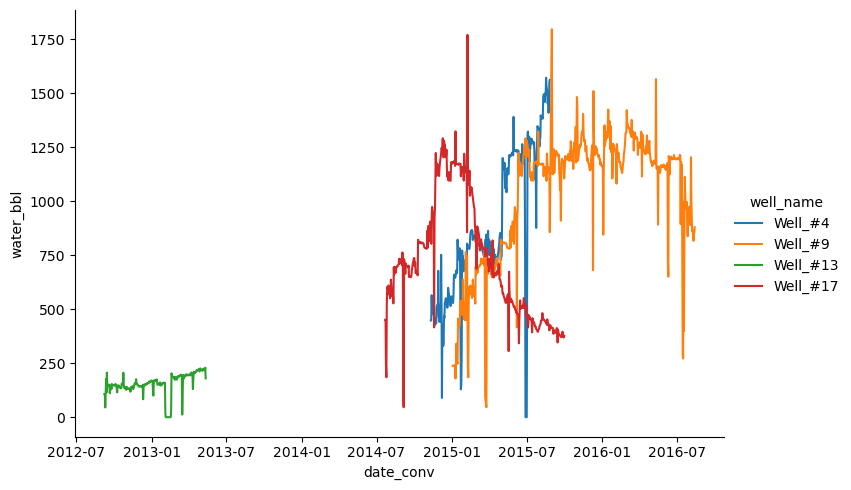



Displaying Production Profiles for Wells in Reservoir JANI


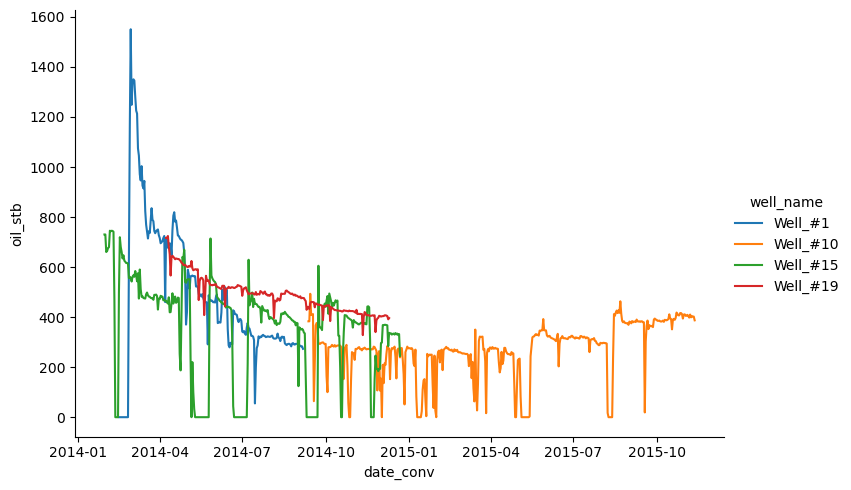

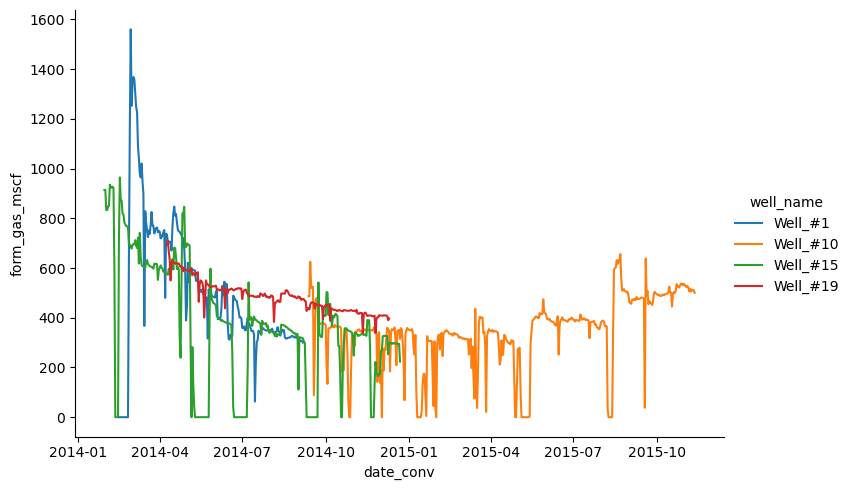

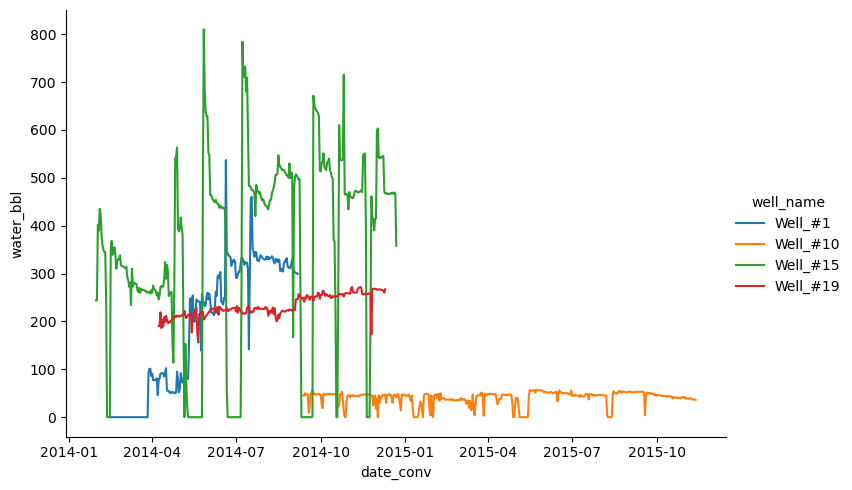

In [86]:
# Quick EDA to see Trends of oil, gas and water across wells in a reservoir, to see if trends are similar
outputs=['oil_stb', 'form_gas_mscf', 'water_bbl']

for rsv_ in unique_rsvs:
    print(f"Displaying Production Profiles for Wells in Reservoir {rsv_}")
    for out in outputs:
        rsv_df=well_df_analysis[well_df_analysis['rsv_name']==rsv_]
        sns.relplot(x='date_conv', y=out, data=rsv_df, kind='line', hue='well_name', height=5, aspect=1.5)
        plt.show()
    print('\n')

**Observations**
1. Gas and oil production in Mako and Jani is Similar across wells. But the water production profile is very different.
2. Water Production in wells in same reservoir is not similar anywhere.

In [87]:
well_df_analysis.columns

Index(['date', 'well_name', 'on_str_hrs', 'bottom_hole_psi', 'downhole_temp',
       'Annulus_p', 'choke_size', 'whp', 'wht', 'date_conv', 'oil_stb',
       'form_gas_mscf', 'total_gas_mscf', 'water_bbl', 'rsv_name', 'rsv_value',
       'solution_gor', 'formation_GOR', 'water_cut', 'pi'],
      dtype='object')

Feature Trend for Wells in Reservoir ACHI


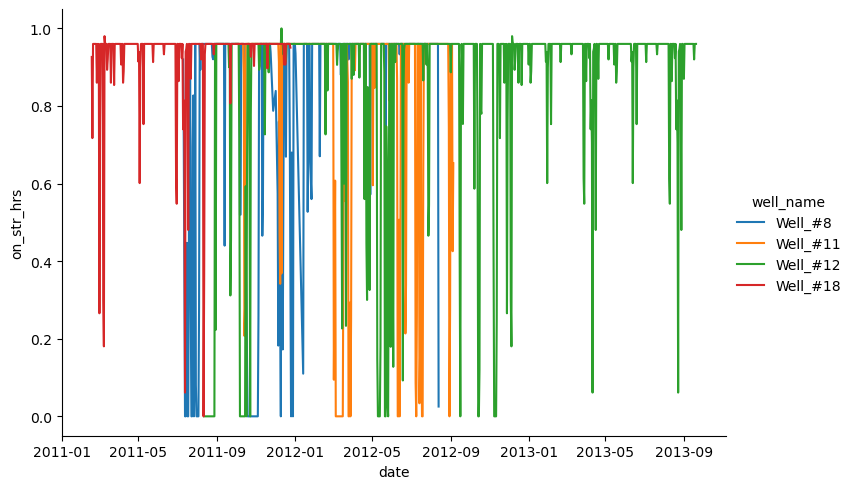

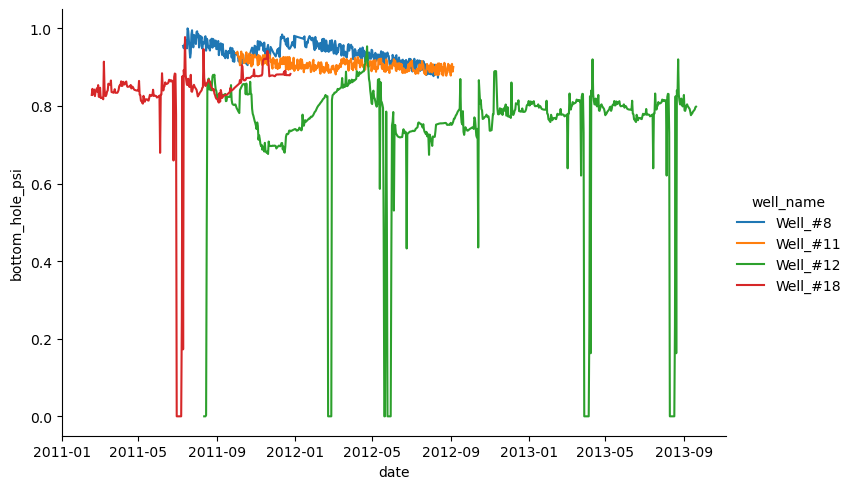

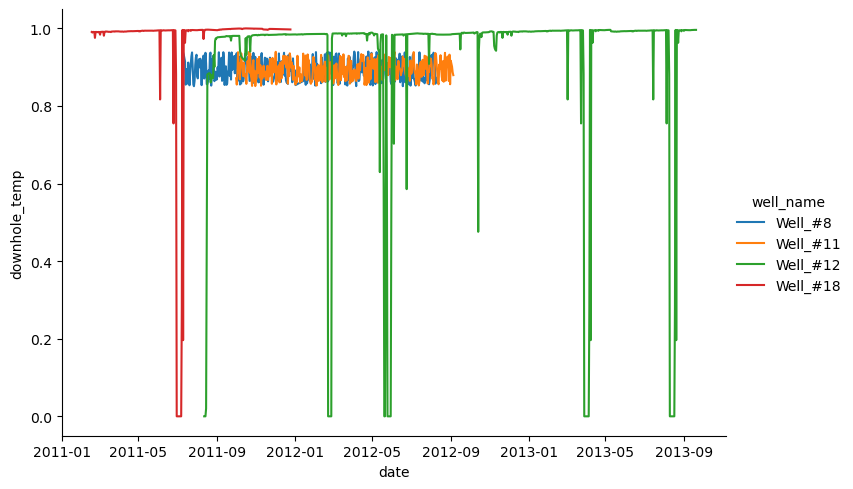

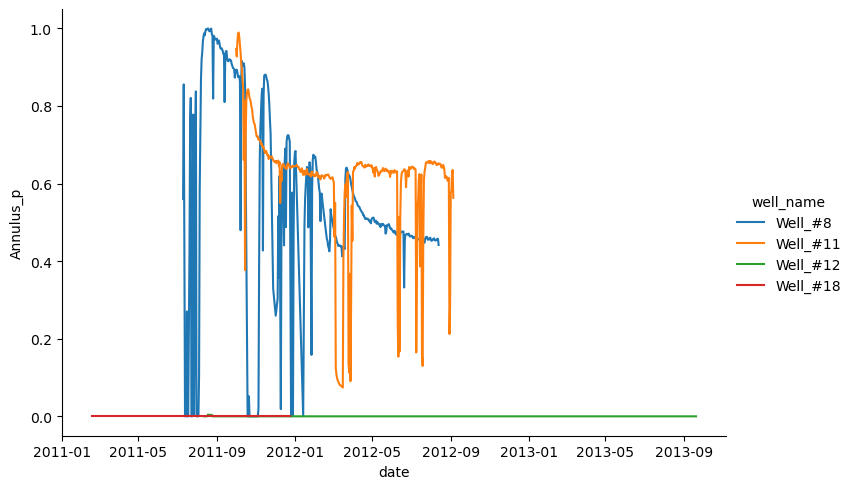

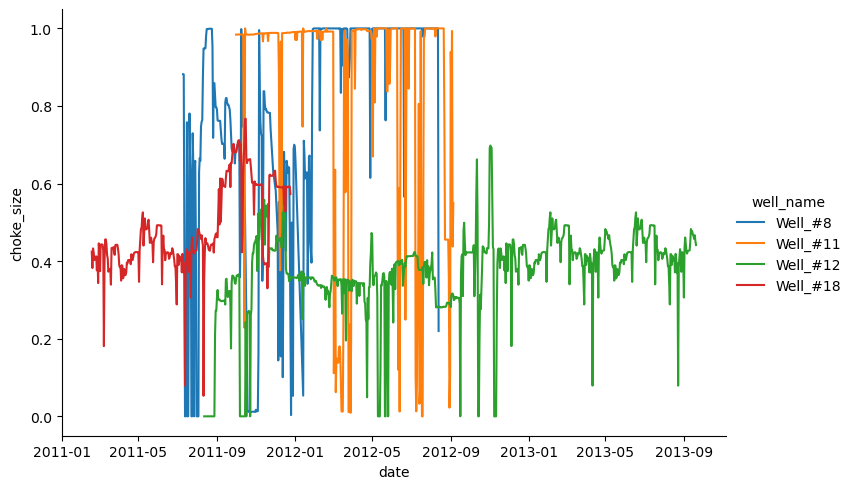

...

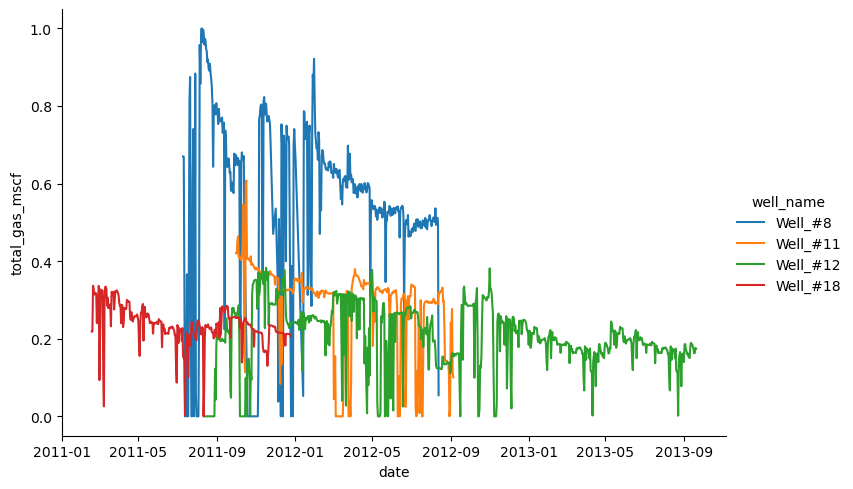

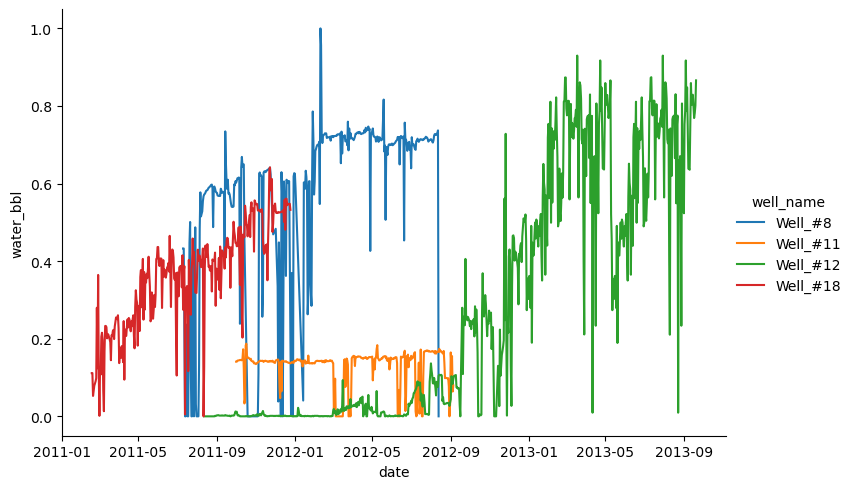

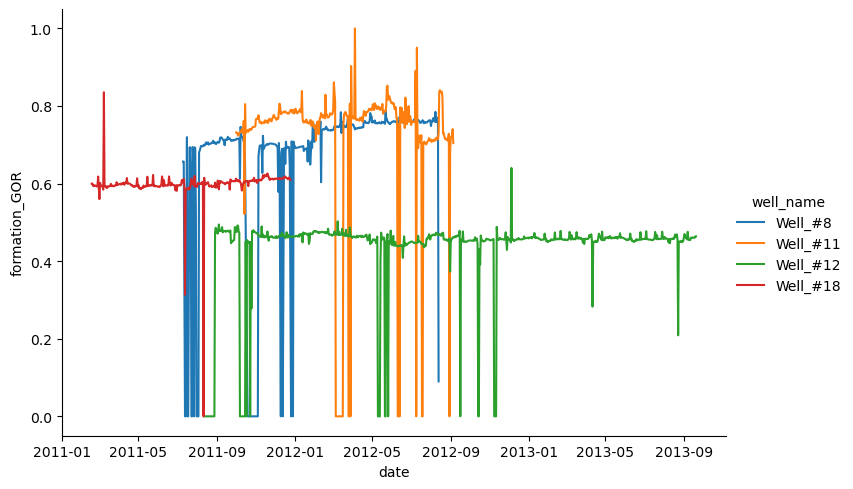

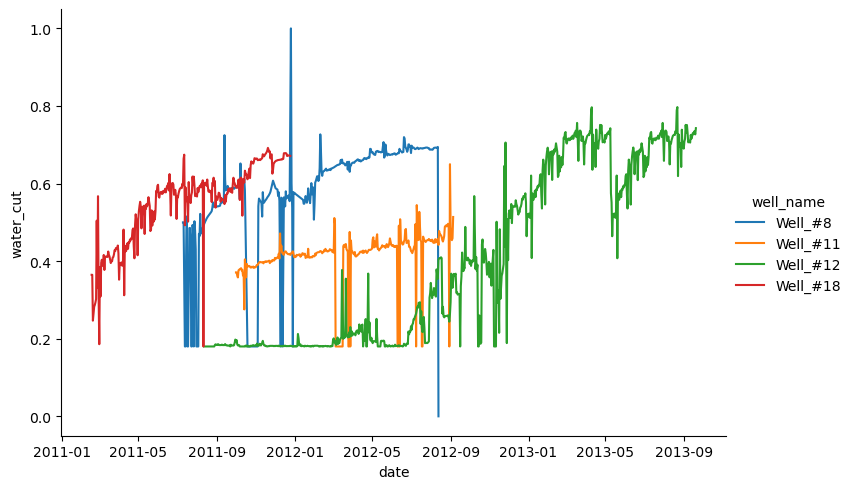

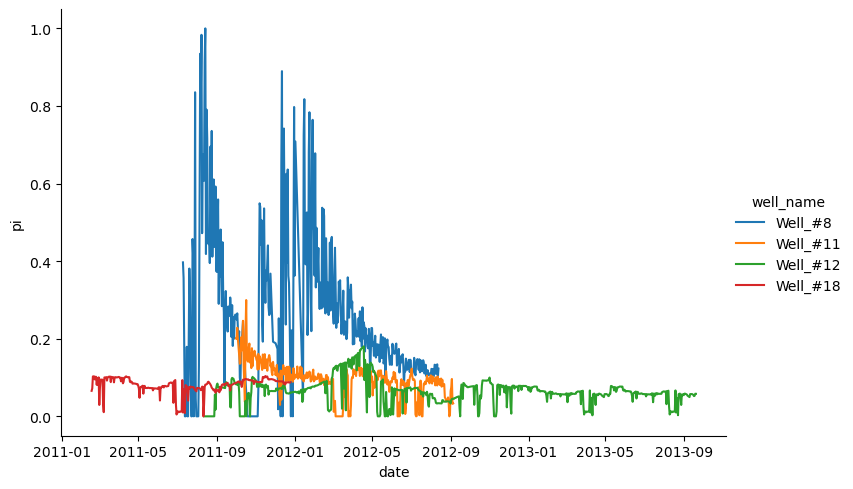

Feature Trend for Wells in Reservoir KEMA


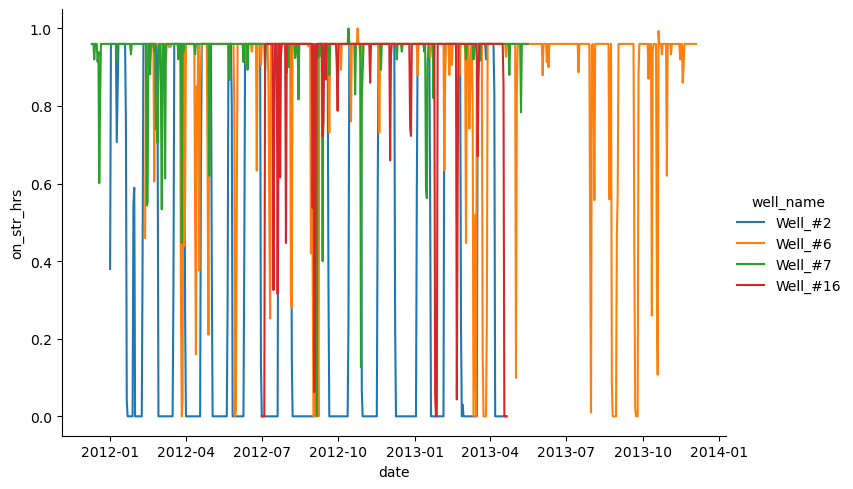

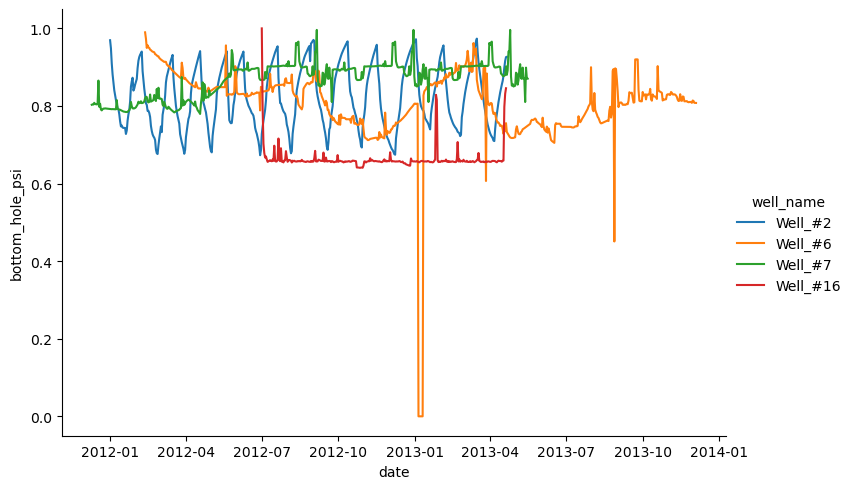

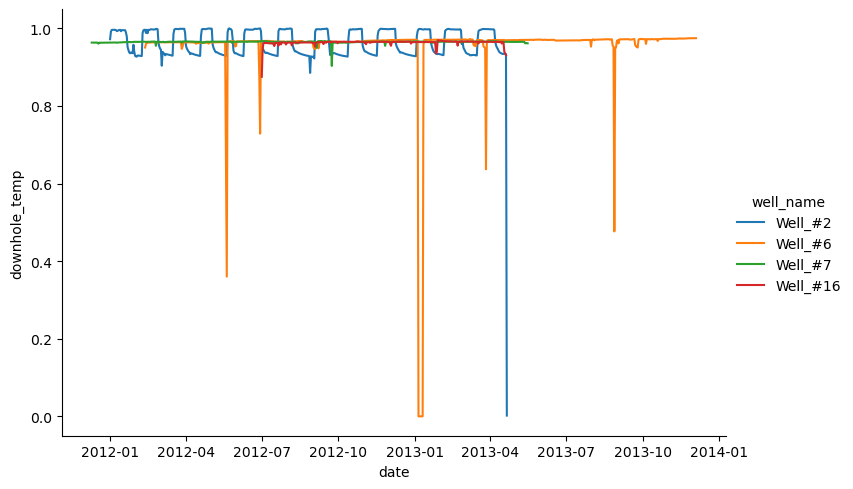

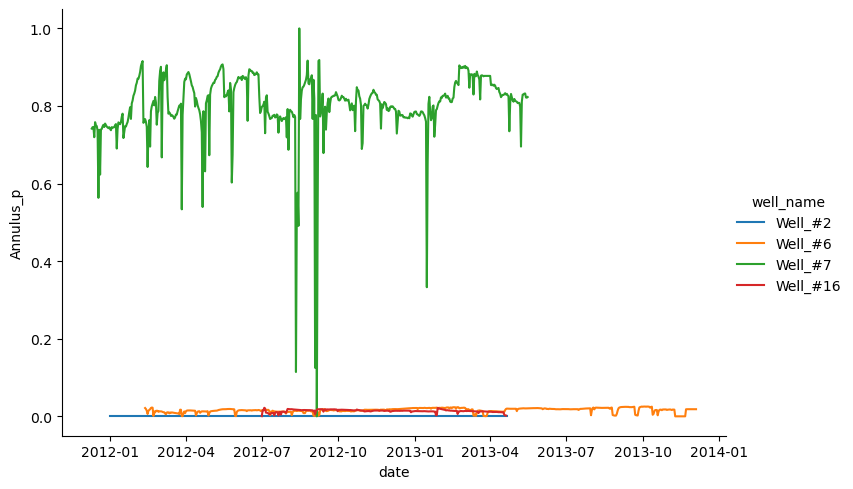

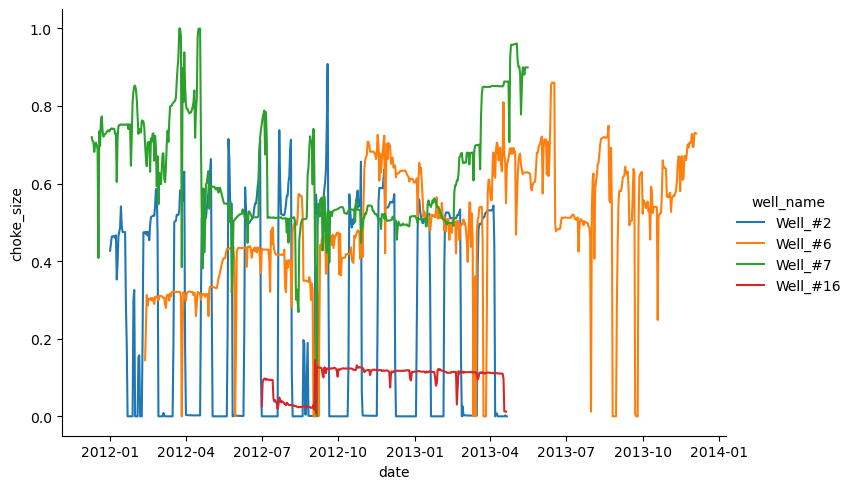

...

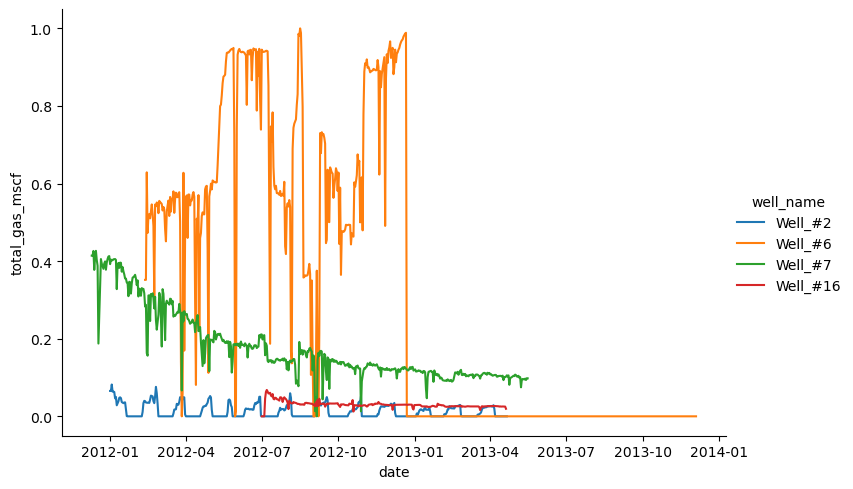

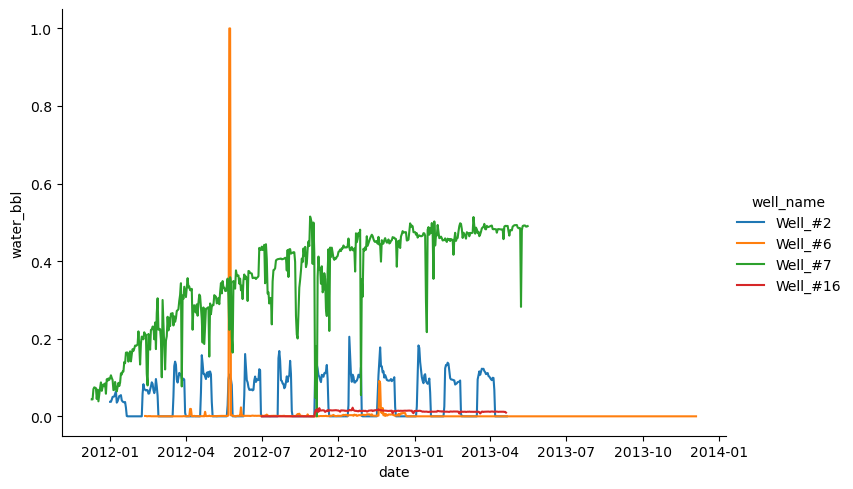

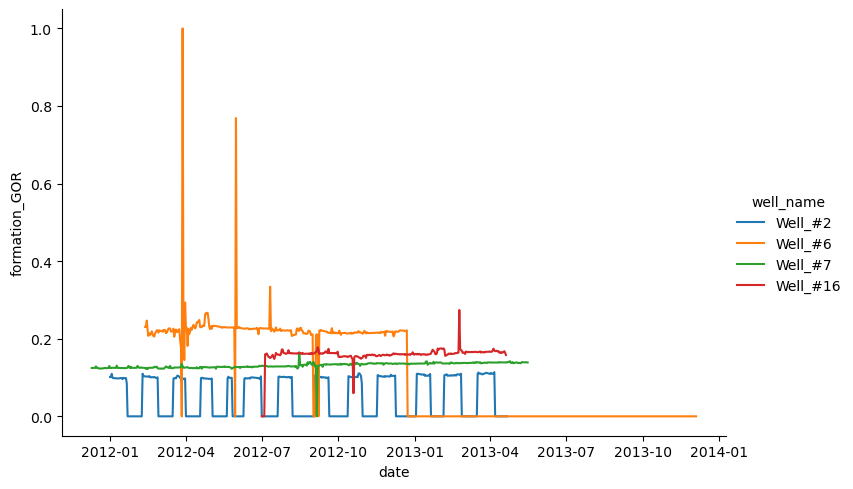

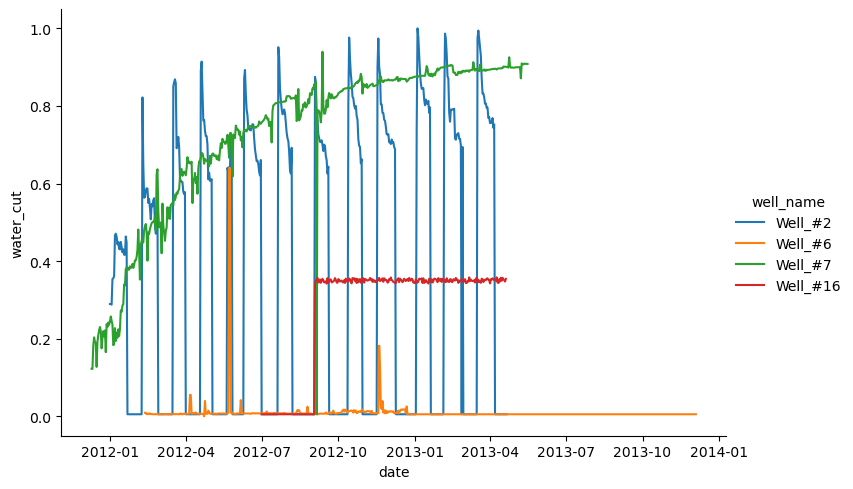

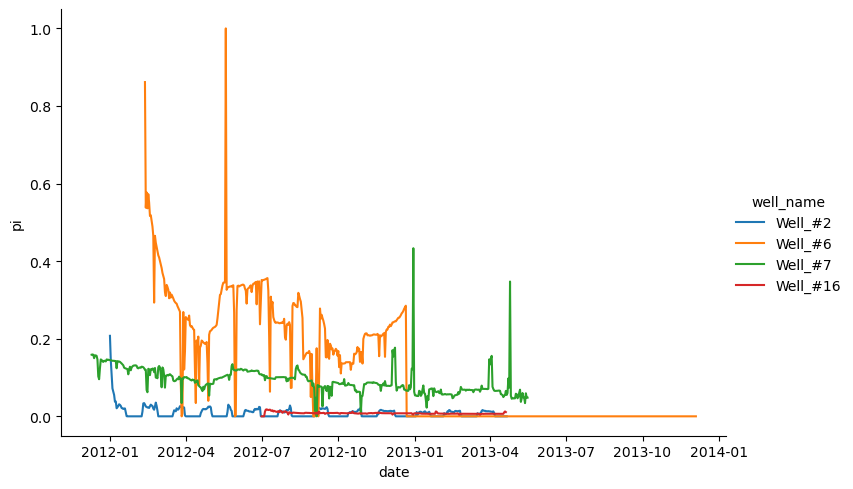

Feature Trend for Wells in Reservoir MAKO


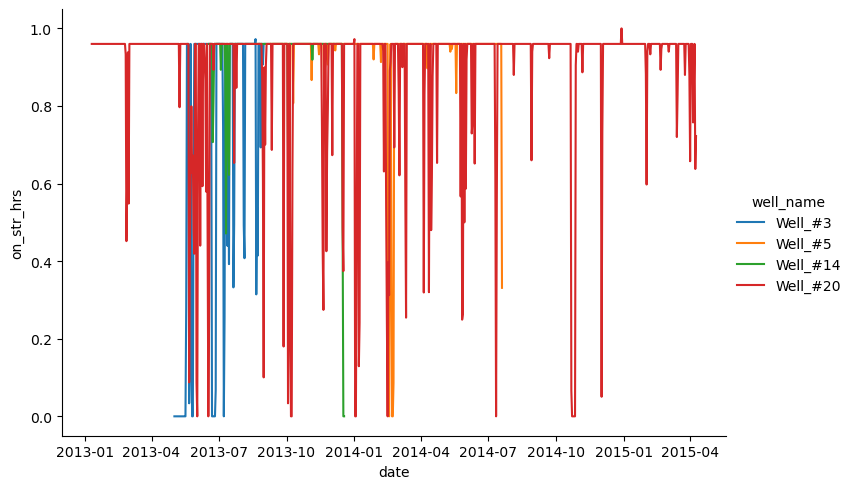

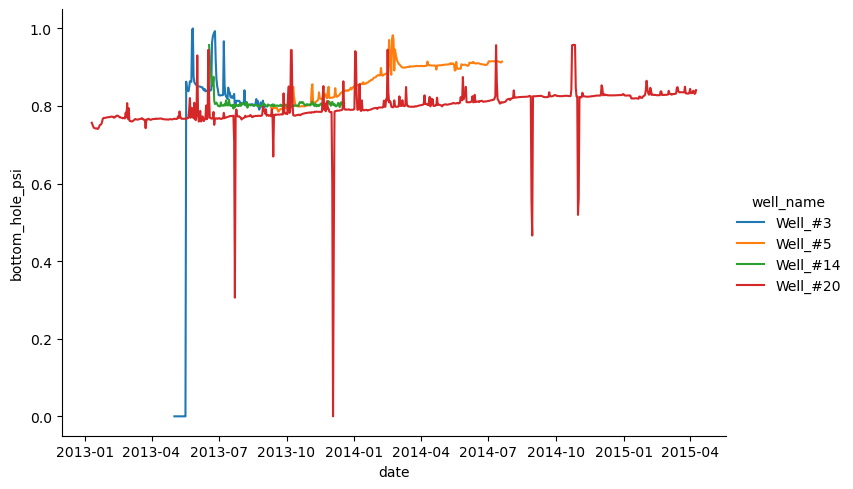

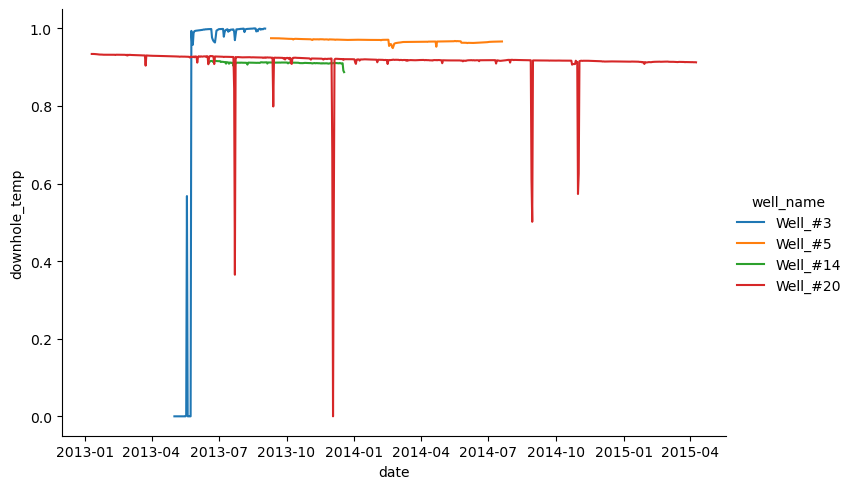

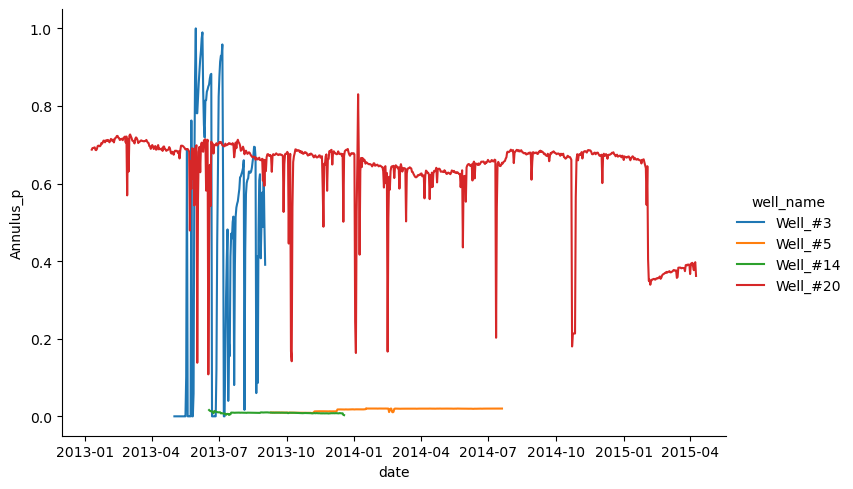

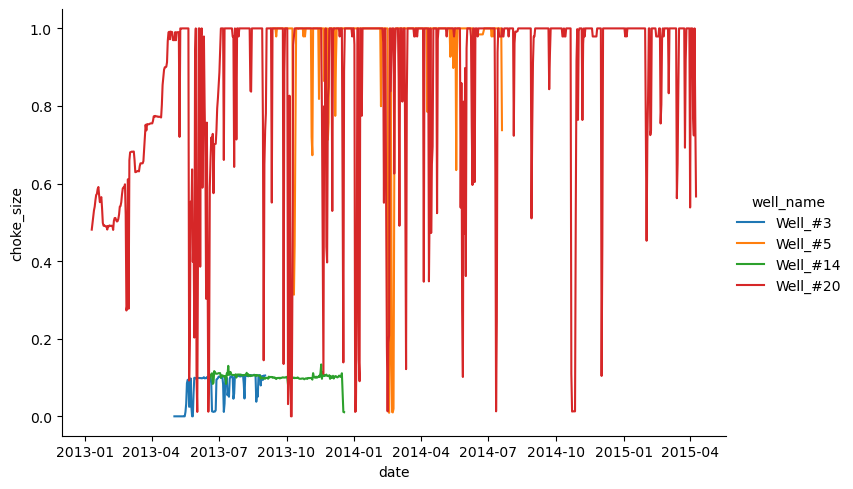

...

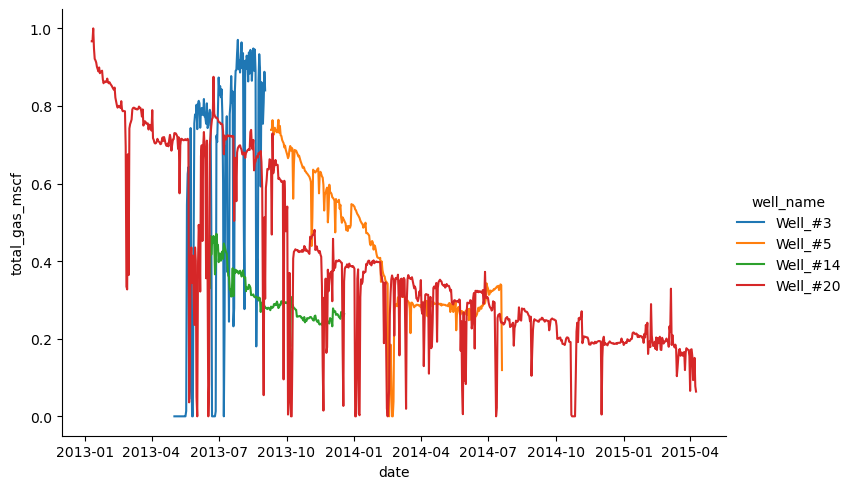

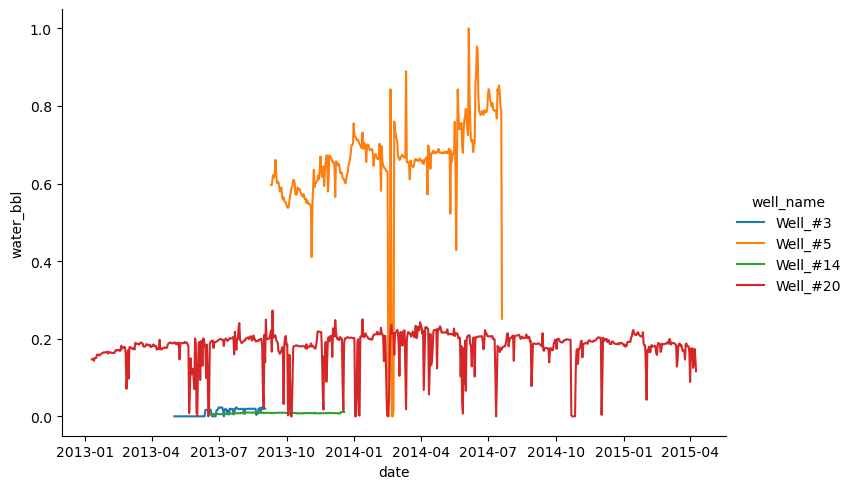

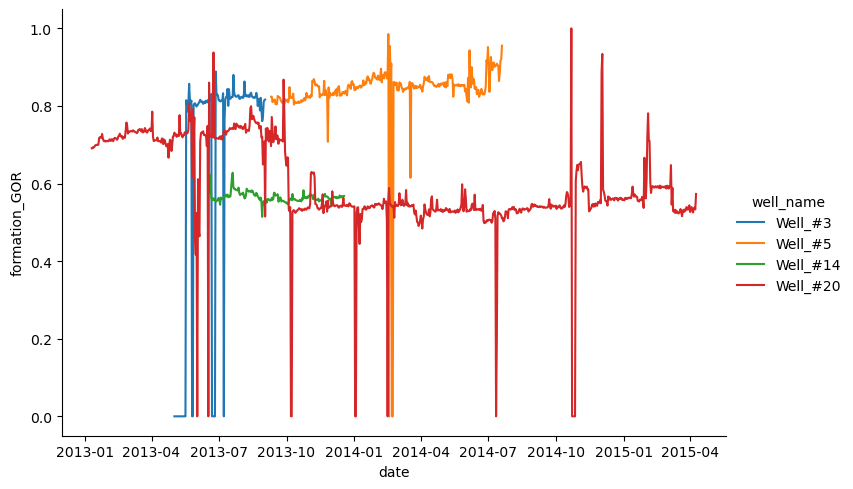

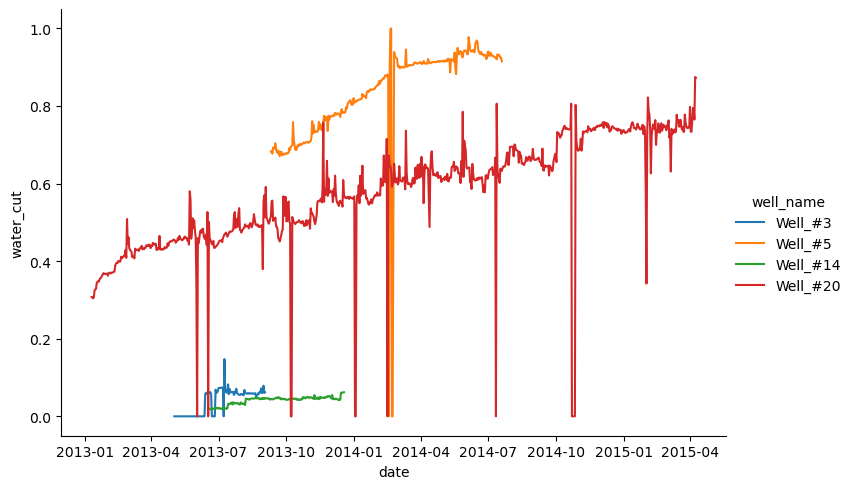

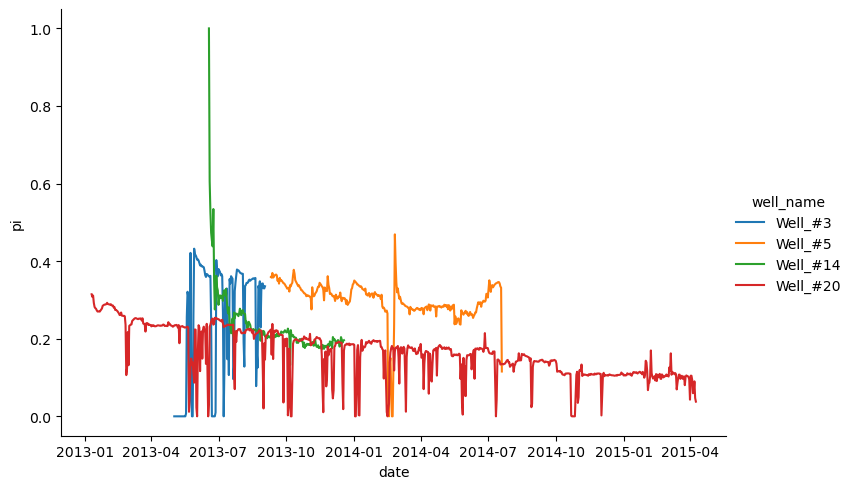

Feature Trend for Wells in Reservoir DEPU


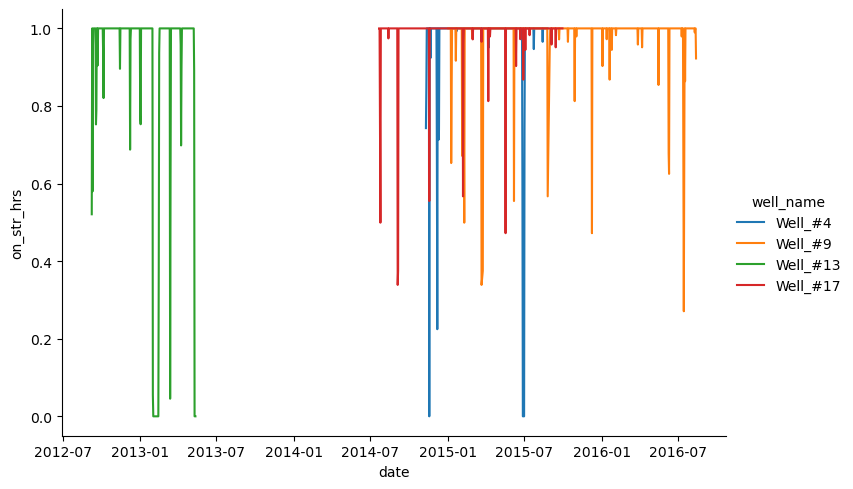

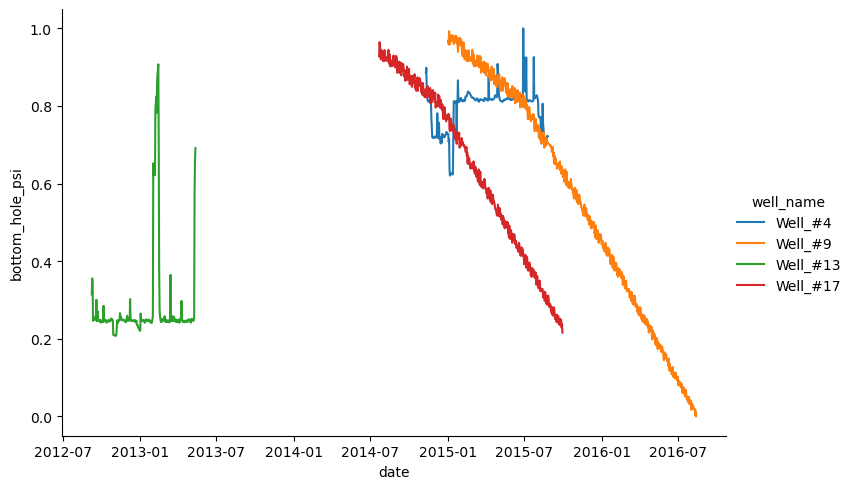

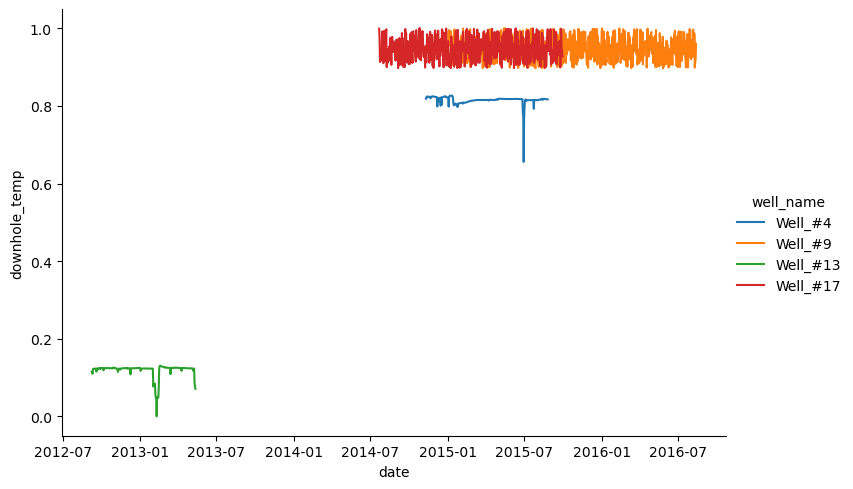

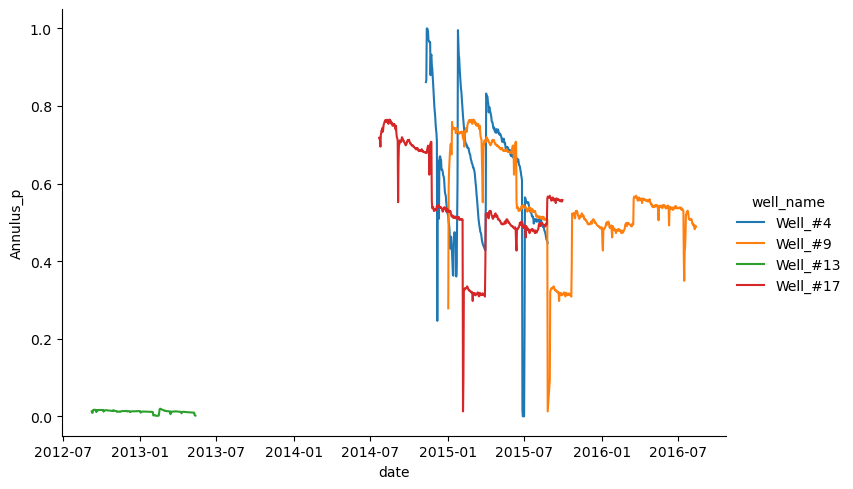

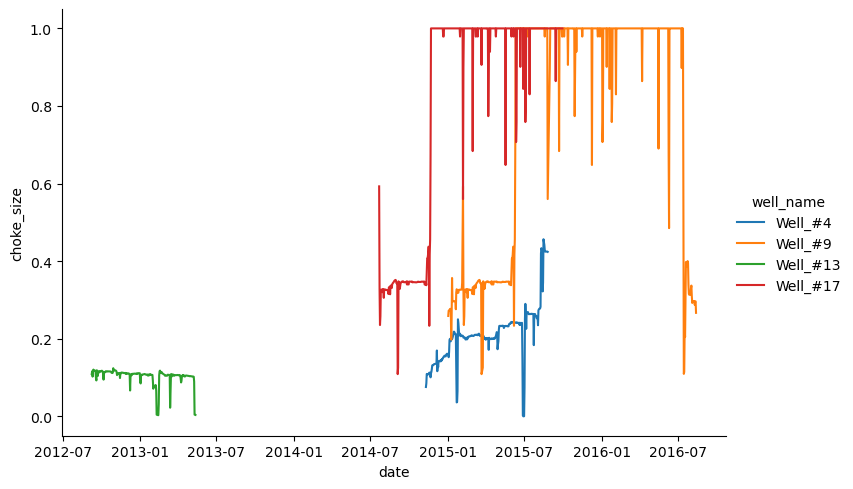

...

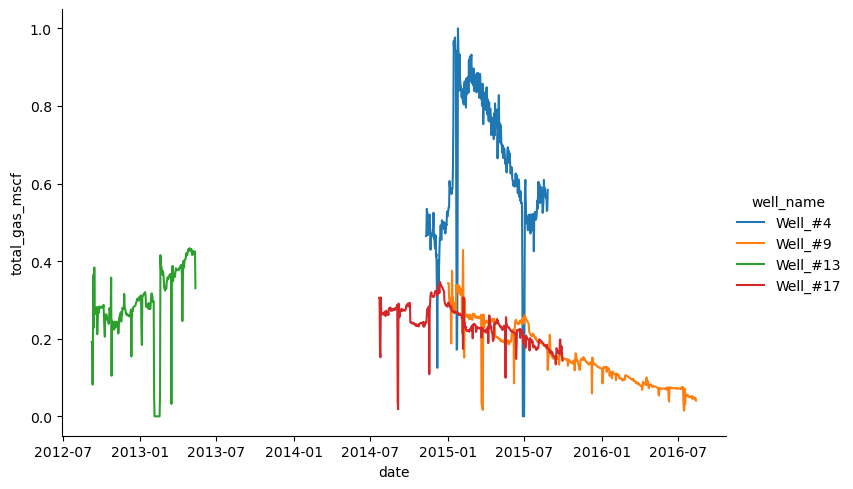

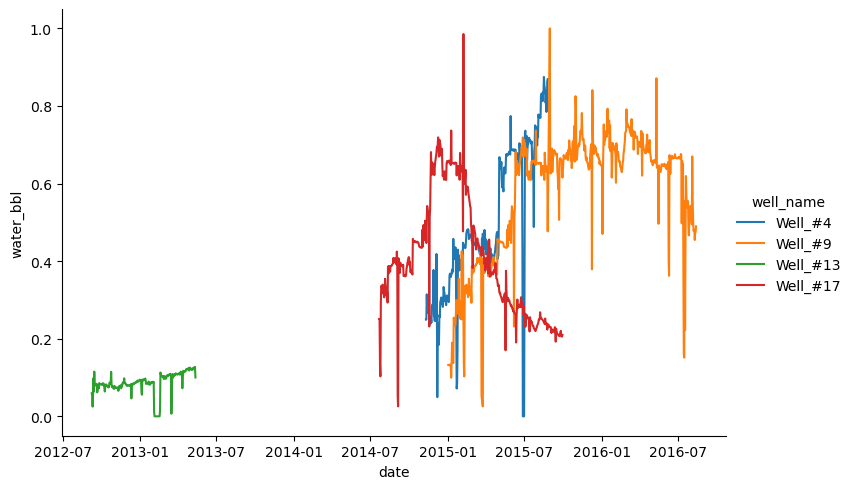

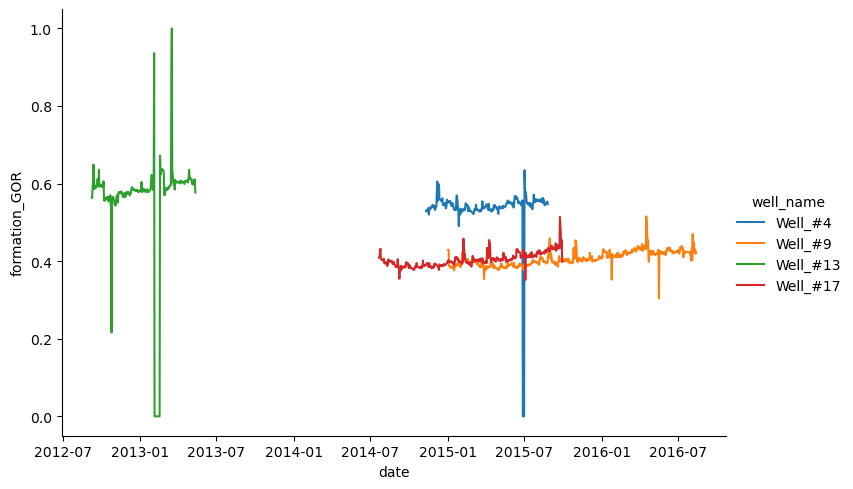

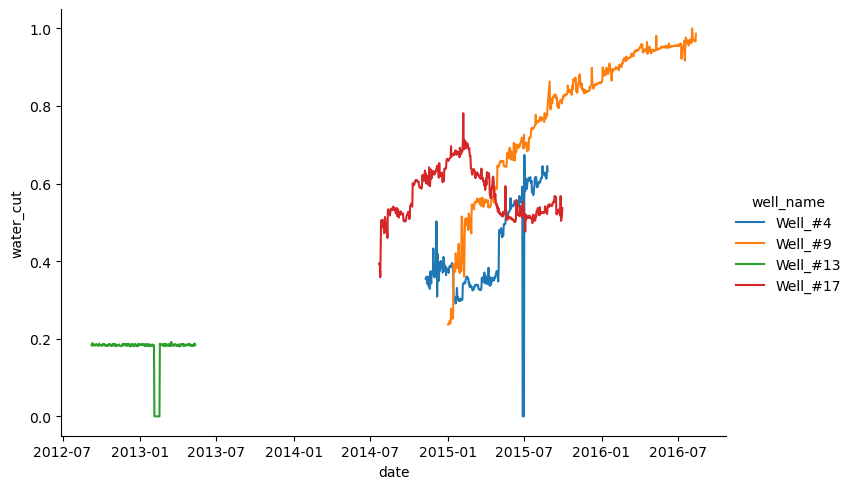

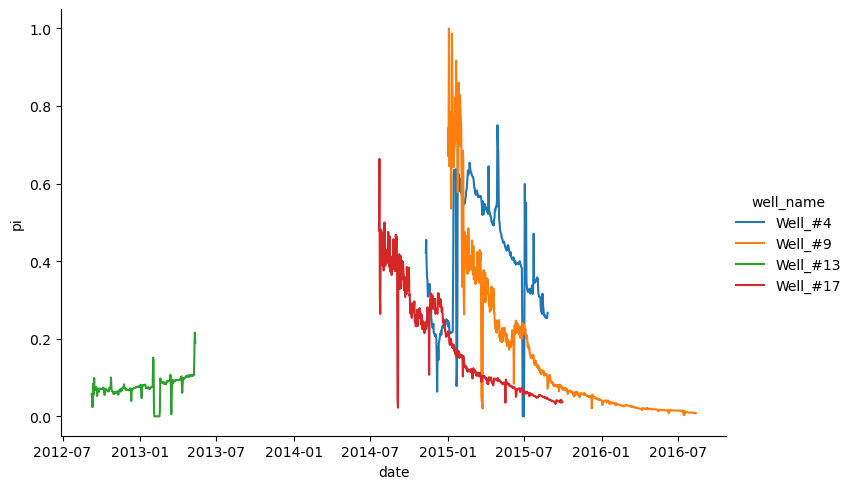

Feature Trend for Wells in Reservoir JANI


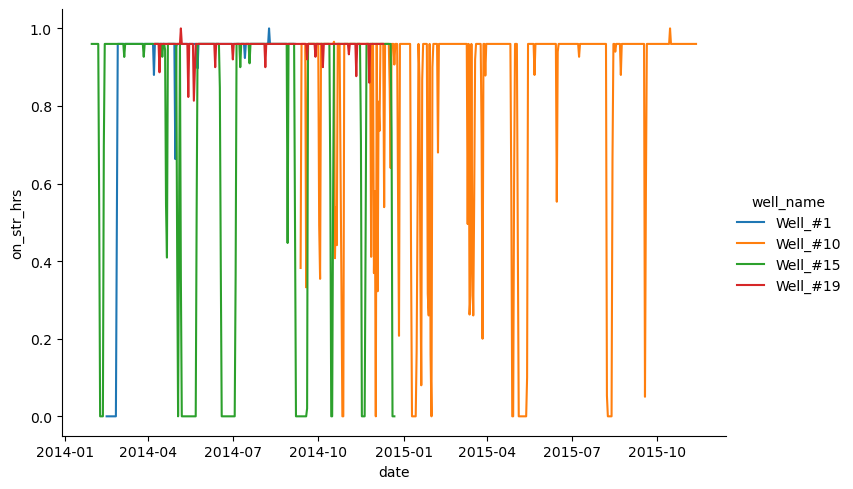

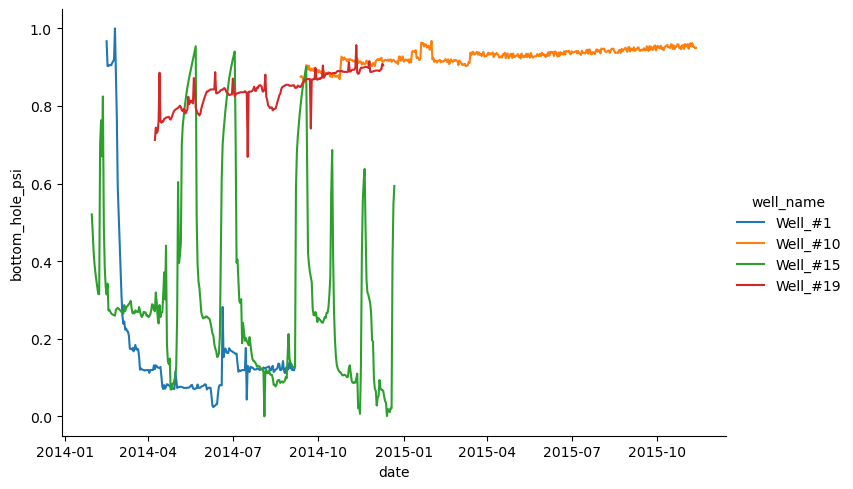

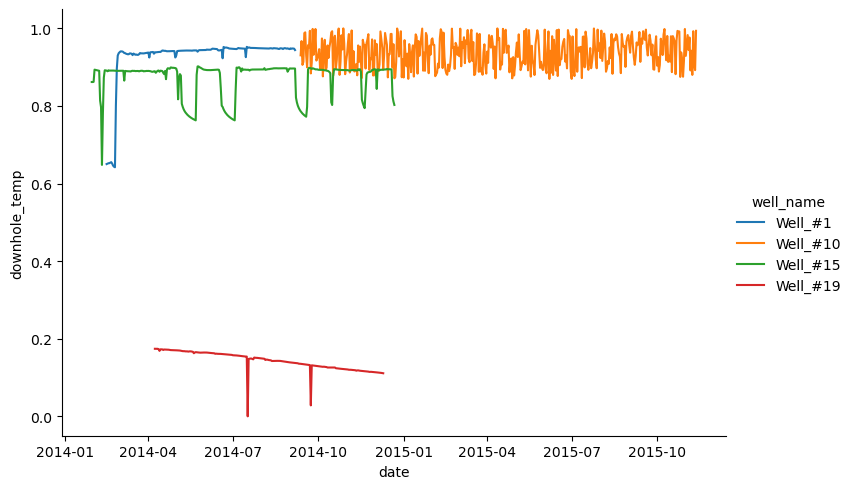

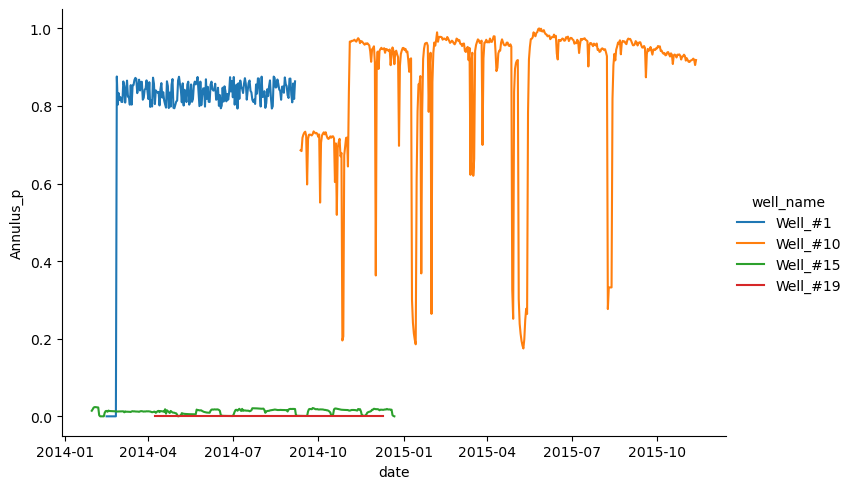

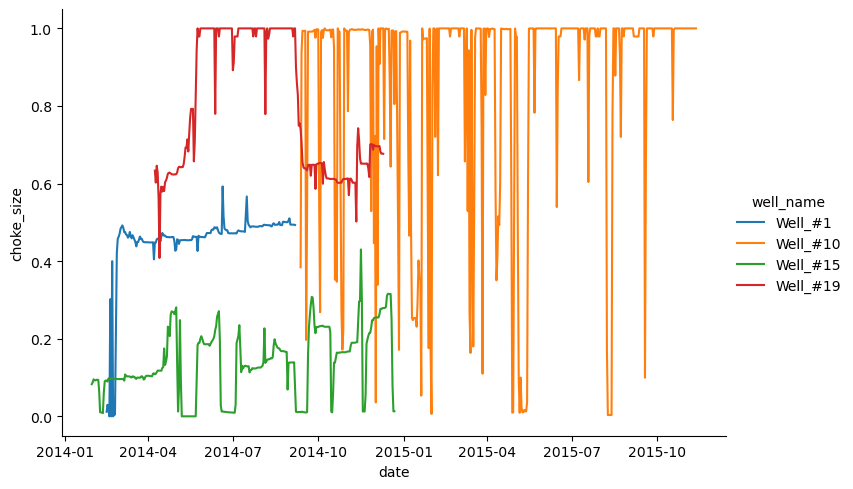

...

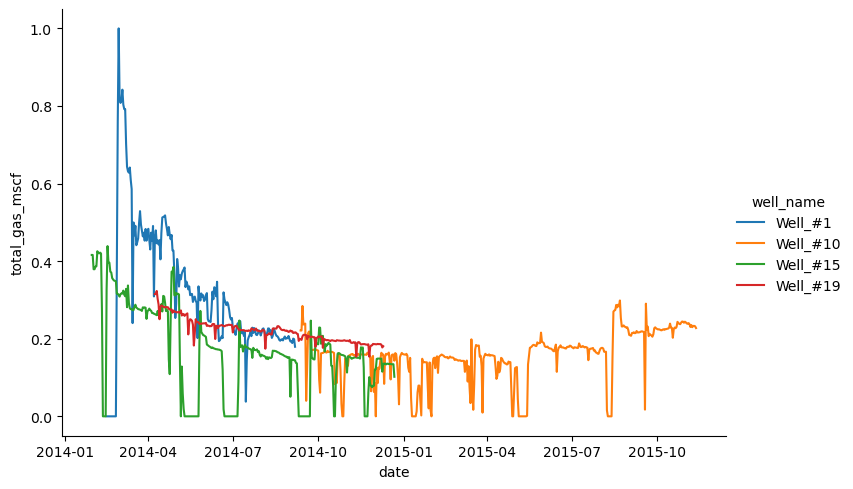

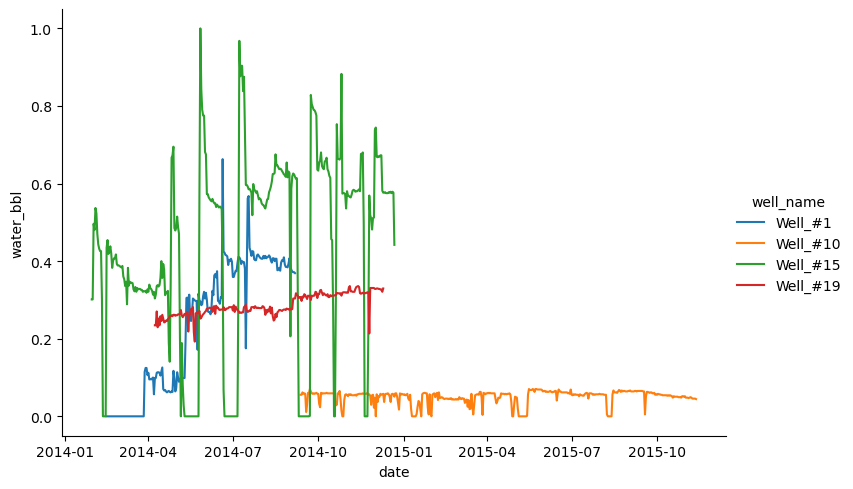

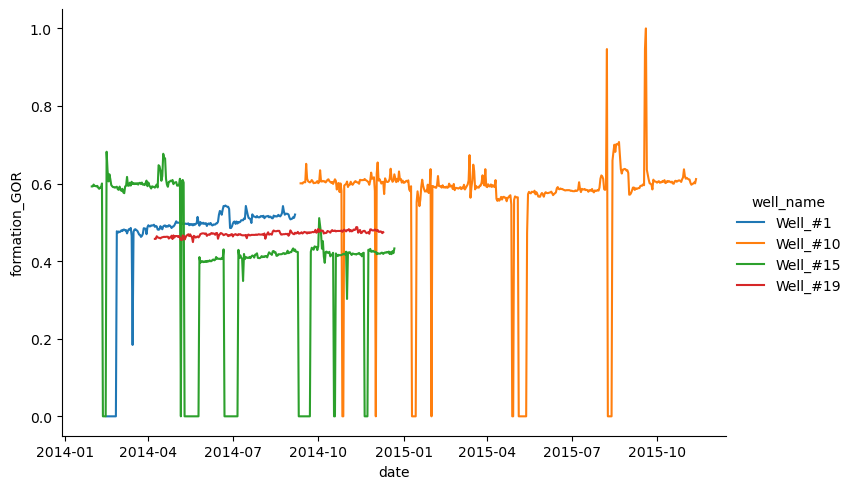

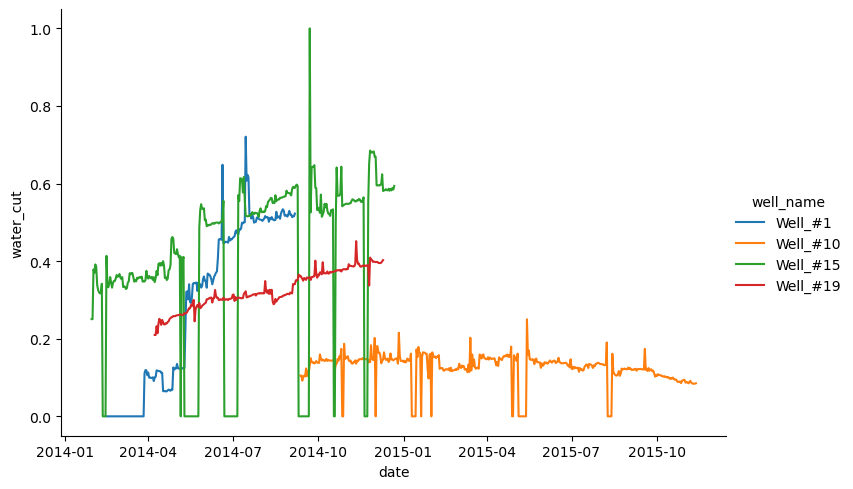

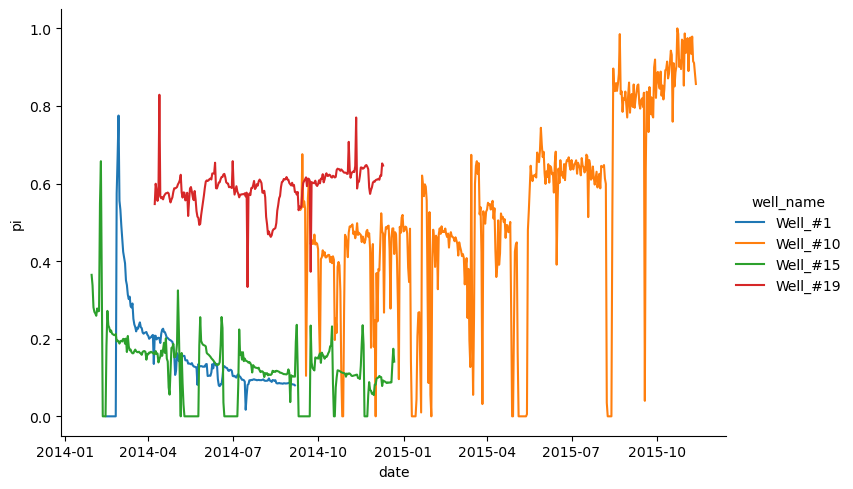

In [88]:
# Quick plot to see how other features tend per reservoir
potential_feats=['on_str_hrs', 'bottom_hole_psi', 'downhole_temp',
       'Annulus_p', 'choke_size', 'whp', 'wht', 'oil_stb',
       'form_gas_mscf', 'total_gas_mscf', 'water_bbl', 'formation_GOR', 'water_cut', 'pi']

for rsv in unique_rsvs:
    print('Feature Trend for Wells in Reservoir', rsv)
    # initializing the scaler
    mm_scaler = MinMaxScaler(clip = True)
    
    well_df_init=well_df_analysis[well_df_analysis['rsv_name']==rsv]
    dates=well_df_init.date_conv.values
    wells=well_df_init.well_name.values
    w_df=well_df_init.copy()[potential_feats]
    w_df = pd.DataFrame(mm_scaler.fit_transform(w_df),columns=potential_feats)
    
    # adding back the date column
    w_df['date']=dates
    w_df['well_name']=wells
    #display(well_df)

    for f in potential_feats:
        sns.relplot(x='date', y=f, data=w_df, kind='line', hue='well_name', height=5, aspect=1.5)
        plt.show()

**Observation**
1. Bottomhole PSI is very similar among wells in same reservoir which makes sense since that's what we used in the empirical formulae.

## ML Approaches

This phase was grouped into 2
1. Supervised Learning Phase: After we empirically found the well properties, it also made sense to use that as our label and predict the reservoir a well belonged to as well as other properties.
2. Unsupervised Learning Phase: Since the original dataset had just well data but we didn't know what reservoir any well fell in, it made sense to generate well features and perform clustering to group wells with similar behaviour and then compare the results to the empirical clustering of wells.

In [96]:
# Result of empircal clustering of wells. We basically try to know which wells fall in which reservoir and with this info, we know what result 
# to expect
well_df_analysis.groupby('rsv_name')['well_name'].unique()

rsv_name
ACHI    [Well_#8, Well_#11, Well_#12, Well_#18]
DEPU     [Well_#4, Well_#9, Well_#13, Well_#17]
JANI    [Well_#1, Well_#10, Well_#15, Well_#19]
KEMA      [Well_#2, Well_#6, Well_#7, Well_#16]
MAKO     [Well_#3, Well_#5, Well_#14, Well_#20]
Name: well_name, dtype: object

In [97]:
well_df_analysis['rsv_name'].value_counts(normalize=True)

rsv_name
KEMA   0.246
ACHI   0.226
DEPU   0.195
MAKO   0.181
JANI   0.151
Name: proportion, dtype: float64

**Observation**

1. Interestingly, there's 4 wells in each reservoir
2. The dataset is a bit imbalanced with a reservoir having 25% of the data and another having 15%

In [98]:
# Obtaining Oil Production in Reservoir barrels. To do that, we need to multiply by Oil Formation Volume Factor
well_df_a=pd.merge(well_df_analysis.copy(), rsv_details[['rsv_name', 'form_v_fact']], how='left', on='rsv_name')

In [99]:
well_df_a['oil_rb']=well_df_a['oil_stb']*well_df_a['form_v_fact']

In [100]:
oil_rsv_bbl=well_df_a.groupby('rsv_name', as_index=False)['oil_rb'].sum()

In [106]:
#oil_rsv_bbl.to_csv('oil_rsv_bbl.csv', index=False)

In [131]:
# Splitting the raw dataset specific to a timeseries dataset for both the supervised and unsupervised learning approaches
empty_train_df = pd.DataFrame(columns=well_df.columns)
empty_test_df = pd.DataFrame(columns=well_df.columns)

for well_ in all_wells:
    df=well_df.copy()
    df=df[df['well_name']==well_]
    
    # sorting by date
    df.sort_values('date_conv', inplace=True)
    rows=df.shape[0]
    _perc=0.25*rows
    end_perc_start=int(rows-_perc)
    
    train_=df.iloc[:end_perc_start,:]
    test_=df.iloc[end_perc_start:,:]

    # appending to empty dataframe
    empty_train_df=pd.concat([empty_train_df,train_], axis=0)
    empty_test_df=pd.concat([empty_test_df,test_], axis=0)


In [132]:
max(empty_train_df[empty_train_df.well_name=='Well_#1'].date_conv), min(empty_test_df[empty_test_df.well_name=='Well_#1'].date_conv), 

(Timestamp('2014-07-17 00:00:00'), Timestamp('2014-07-18 00:00:00'))

In [133]:
# More helper functions
def rsv_mapper(val):
    if val=='KEMA':
        return 0
    elif val=='ACHI':
        return 1
    elif val=='DEPU':
        return 2 
    elif val=='MAKO':
        return 3 
    elif val=='JANI':
        return 4 

def rsv_type_mapper(val):
    if val.lower()=='undersat':
        return 0
    elif val.lower()=='saturated':
        return 1

def rsv_flow_status_mapper(val):
    if val=='Gas Lifted':
        return 0
    else:
        return 1

def rsv_steady_mapper(val):
    if val=='Steady':
        return 0
    else:
        return 1

def rsv_gor_mapper(val):
    if val.lower()=='asolgor':
        return 0
    elif val.lower() =='bsolgor':
        return 1
    elif val.lower()=='combo':
        return 2
        
def rsv_water_pi_mapper(val):
    if val.lower()=='incr':
        return 0
    elif val.lower() =='decr':
        return 1
    elif val.lower()=='combo':
        return 2
    elif val.lower()=='flat':
        return 3

def apply_maps(df):
    df['target_type']=df['rsv_type'].apply(rsv_type_mapper)
    df['target_flow']=df['flow_status'].apply(rsv_flow_status_mapper)
    df['target_steady']=df['steady_unsteady_status'].apply(rsv_steady_mapper)
    df['target_gor']=df['gor_trend'].apply(rsv_gor_mapper)
    df['target_water_cut']=df['water_cut_trend'].apply(rsv_water_pi_mapper)
    df['target_pi']=df['pi_trend'].apply(rsv_water_pi_mapper)
    
# Feature Engineering
def get_empirical_feats(df, all_wells, cumm_feats):
    cp=df.copy()
    df_=pd.DataFrame(columns=['date', 'well_name', 'on_str_hrs', 'bottom_hole_psi', 'downhole_temp',
           'Annulus_p', 'choke_size', 'whp', 'wht', 'cumm_oil_stb',
           'cumm_form_gas_mscf', 'cumm_total_gas_mscf', 'cumm_water_bbl',
           'date_conv', 'oil_stb', 'form_gas_mscf', 'total_gas_mscf', 'water_bbl'])
    
    for well_n in all_wells:
        data=cp[cp.well_name==well_n]
        data.sort_values('date_conv', ascending=True, inplace=True)
        for feat in cumm_feats:
            new_feat=feat.replace('cumm_', '')
            data[new_feat]=data[feat]-data[feat].shift(1)
            data.fillna(method='bfill', inplace=True)
        df_=pd.concat([df_,data], axis=0)
    
    df_.drop(cumm_feats, axis=1, inplace=True)
    df_['gas_or_nat']=df_['total_gas_mscf']-df_['form_gas_mscf']
    df_['formation_GOR']=(df_['form_gas_mscf']*1000)/(df_['oil_stb']+0.0000001)
    df_['water_cut']=(df_['water_bbl']/(df_['oil_stb']+df_['water_bbl']+0.0000001))*100
    
    # Setting -ve values to 0
    df_['oil_stb']=df_['oil_stb'].apply(lambd)
    df_['form_gas_mscf']=df_['form_gas_mscf'].apply(lambd)
    df_['total_gas_mscf']=df_['total_gas_mscf'].apply(lambd)
    df_['water_bbl']=df_['water_bbl'].apply(lambd)
    #df_['pi']=df_['pi'].apply(lambd)

    return df_
    
def lag_feat(data, lag_range=[2,7], feat=''):
    '''For a given feature in the dataframe, we extract lags of days and compute percentage increase or decrease'''
    for a in range(lag_range[0], lag_range[1]+1):
        data[feat+'_'+str(a)+'days']=data[feat].shift(a)
    
    # filling na which arised from lag first
    data.fillna(method='bfill', inplace=True)
    
    # getting percentage increase or decrease (0.00001 is added to avoid zero division)
    for a in range(lag_range[0], lag_range[1]+1):
        data[feat+'_'+str(a)+'days_perc']=((data[feat] - data[feat+'_'+str(a)+'days'])/(data[feat]+0.00001))*100
        data[feat+'_'+str(a)+'days_perc_clip']=((data[feat] - data[feat+'_'+str(a)+'days'])
                                                /(data[feat]+data[feat+'_'+str(a)+'days']+0.00001))*100
    
def roll_feat(data, roll_range=[1,7], feat=''):
    '''For a given feature in the dataframe, we extract roling average of days'''
    for a in range(roll_range[0], roll_range[1]+1):
        data[feat+'_roll'+str(a)+'days']=data[feat].rolling(window=a).mean()
        
    # filling na which arised from rolling
    data.fillna(method='bfill', inplace=True)


def get_features(data, all_wells, cumm_feats, features=[]):
    '''Gets the date features, multiplied features and lagged features from a dataframe'''
    # empirical features
    data=get_empirical_feats(data, all_wells, cumm_feats)

    df=data.copy()
    df_1=df[df.well_name==all_wells[0]]
    df_1.sort_values('date_conv', ascending=True, inplace=True)

    #1 -7 days Lag 
    for feat in features:
        lag_feat(df_1, lag_range=[1,7], feat=feat)
        roll_feat(df_1, roll_range=[1,7], feat=feat)

    #df_1.fillna(method='bfill', inplace=True)

    for well_n in all_wells[1:]:
        df_2=df[df.well_name==well_n]
        df_2.sort_values('date_conv', ascending=True, inplace=True)
        
        #1 -7 days Lag 
        for feat in features:
            lag_feat(df_2, lag_range=[1,7], feat=feat)
            roll_feat(df_2, roll_range=[1,7], feat=feat)
            
        #df_2.fillna(method='bfill', inplace=True)
        df_1=pd.concat([df_1,df_2], axis=0)
    #print(df_1.shape)
    
    # date Features
    df_1['month'] = df_1['date_conv'].dt.month
    df_1['dayofyear'] = df_1['date_conv'].dt.dayofyear
    df_1['day'] = df_1['date_conv'].dt.day
    df_1['weekday'] = df_1['date_conv'].dt.weekday
    df_1['weekofyear'] = df_1['date_conv'].dt.isocalendar().week
    #df_1['year'] = df_1['date_conv'].dt.year
    
    return df_1
    
def recurse(X_train, y_train, model):
    '''Used in performing Recursive feature elimination cross validation which is a feature selection approach'''
    rfecv = RFECV(estimator= model, step=5, scoring = 'f1_macro', cv= 5, verbose= 5, n_jobs=2)
    
    # fitting with data
    rfecv.fit(X_train, y_train)
    
    # reducing the dataset and leaving the n best columns
    # rfecv.transform(X_train)
    model_name = model.__class__.__name__
    best_features = rfecv.get_feature_names_out()
    
    print('Optimal Number of features for {} is: {}'.format(model_name, rfecv.n_features_))
    print(rfecv.get_feature_names_out())
    
    # prints out the mean cv score when n features were used
    print(rfecv.cv_results_['mean_test_score'], '\n')
    
    return model_name, best_features

# Investigate the variance accounted for by each principal component.
def fraction_range(st, incre, stop):
    # like the range function but makes ranges of floats
    vals = [st]
    diff = stop - st
    for x in range(int(np.ceil(diff/incre))):
        st = st+incre
        if st <= stop and st < stop:
            vals.append(round(st,4))
        else:
            break
    return vals
    
def Explain_PCA(pca, cum_plot = True):
    num_components=len(pca.explained_variance_ratio_)
    ind = np.arange(num_components)
    vals = pca.explained_variance_ratio_
    
    cummulative = np.cumsum(vals)
 
    plt.figure(figsize=(10, 7))
    plt.bar(ind, vals)
    for i in range(num_components):
        plt.annotate(r"%s%%" % ((str(vals[i]*100)[:4])), (ind[i]+0.2, vals[i]), va="bottom", ha="center", fontsize=8)
    plt.xlabel('Components')
    plt.ylabel('% Variance explained')
    plt.yticks(fraction_range(0, 0.1, 1))
    plt.show()
    
    if cum_plot == True:
        plt.figure(figsize=(10, 7))
        plt.plot(ind, cummulative)
        plt.xlabel('Components')
        plt.ylabel('Cummulative % Variance explained')
        plt.yticks(fraction_range(0, 0.05, 1.05))
        plt.grid()
        plt.show()
        for b, a in zip(ind,cummulative):
            if round(a, 2)>=0.95:
                print('We have 90% Variance explained at n_components =', b)
                return b
                break


def get_pca(data):
    # Apply PCA to the data.
    n_comp = 10
    pca = PCA(n_components= n_comp)
    pca = pca.fit(data)

    # Explaining the Variance captured by the principal components
    optimal_components=Explain_PCA(pca)
    # Re-applying PCA to the data while using only optimal components
    pca = PCA(n_components=optimal_components)
    pca_data = pca.fit_transform(data)

    return pca_data

def class_report(y_true, y_pred):
    report = classification_report(y_true, y_pred, output_dict= True)
    report_df = pd.DataFrame(report).transpose()
    n = list(report_df.index[:5])
    n.append('accuracy')
    n.append('macro avg')
    n.append('weighted avg')
    report_df.index = n
    display(report_df)
    
    plt.figure(figsize=(10,7))
    sns.heatmap(confusion_matrix(y_true, y_pred), annot= True, fmt= '.2f')
    plt.xlabel('Predicted')
    plt.ylabel('Truth')
    plt.show()

In [134]:

test=get_features(empty_test_df, all_wells, cumm_feats, ['bottom_hole_psi', 'Annulus_p', 'choke_size', 
                                                                                'whp', 'wht', 'oil_stb','form_gas_mscf', 
                                                                                'total_gas_mscf', 'water_bbl', 'water_cut'])

In [135]:
train=get_features(empty_train_df, all_wells, cumm_feats, ['bottom_hole_psi', 'Annulus_p', 'choke_size', 
                                                                                'whp', 'wht', 'oil_stb','form_gas_mscf', 
                                                                                'total_gas_mscf', 'water_bbl', 'water_cut'])

In [136]:
train=pd.merge(train, max_well_bottom_psis[['well_name', 'rsv_name']], on='well_name', how='left')
test=pd.merge(test, max_well_bottom_psis[['well_name', 'rsv_name']], on='well_name', how='left')

In [137]:
# Visualizing train and test data distribution. They are mostly the same
display(train['rsv_name'].value_counts(normalize=True))
test['rsv_name'].value_counts(normalize=True)

rsv_name
KEMA   0.246
ACHI   0.226
DEPU   0.195
MAKO   0.181
JANI   0.151
Name: proportion, dtype: float64

rsv_name
KEMA   0.246
ACHI   0.226
DEPU   0.196
MAKO   0.181
JANI   0.151
Name: proportion, dtype: float64

In [138]:
train['target']=train['rsv_name'].apply(rsv_mapper)
test['target']=test['rsv_name'].apply(rsv_mapper)

In [139]:
drop_columns=['date', 'date_conv', 'well_name', 'rsv_name', 'target']

In [112]:
# Experimenting on 3 models
classifiers = {
    'RF': RandomForestClassifier(random_state=0, class_weight='balanced'),
    'ExtraTrees': ExtraTreesClassifier(random_state= 40),
    'XGB': XGBClassifier(random_state = 66)
}

In [92]:
%%time
model_best_feats = {}
for mods in classifiers:
    model, best_feats = recurse(train.drop(drop_columns, axis=1), train['target'], classifiers[mods])
    model_best_feats[model] = best_feats

Fitting estimator with 299 features.
Fitting estimator with 294 features.
Fitting estimator with 289 features.
Fitting estimator with 284 features.
Fitting estimator with 279 features.
Fitting estimator with 274 features.
Fitting estimator with 269 features.
Fitting estimator with 264 features.
Fitting estimator with 259 features.
Fitting estimator with 254 features.
Fitting estimator with 249 features.
Fitting estimator with 244 features.
Fitting estimator with 239 features.
Fitting estimator with 234 features.
Fitting estimator with 229 features.
Fitting estimator with 224 features.
Fitting estimator with 219 features.
Fitting estimator with 214 features.
Fitting estimator with 209 features.
Fitting estimator with 204 features.
Fitting estimator with 199 features.
Fitting estimator with 194 features.
Fitting estimator with 189 features.
Fitting estimator with 184 features.
Fitting estimator with 179 features.
Fitting estimator with 174 features.
Fitting estimator with 169 features.
F

In [93]:
# Combining all the best features from RFECV
all_best_feats = set()

for model_best_feat in model_best_feats:
    for md_feat in model_best_feats[model_best_feat]:
        all_best_feats.add(md_feat)

In [94]:
all_best_feats

{'Annulus_p',
 'Annulus_p_1days',
 'Annulus_p_3days',
 'Annulus_p_4days',
 'Annulus_p_5days',
 'Annulus_p_5days_perc',
 'Annulus_p_6days',
 'Annulus_p_7days',
 'Annulus_p_7days_perc',
 'Annulus_p_roll2days',
 'Annulus_p_roll3days',
 'Annulus_p_roll5days',
 'Annulus_p_roll6days',
 'Annulus_p_roll7days',
 'bottom_hole_psi',
 'bottom_hole_psi_1days',
 'bottom_hole_psi_2days',
 'bottom_hole_psi_2days_perc',
 'bottom_hole_psi_3days',
 'bottom_hole_psi_3days_perc',
 'bottom_hole_psi_4days',
 'bottom_hole_psi_5days',
 'bottom_hole_psi_5days_perc',
 'bottom_hole_psi_5days_perc_clip',
 'bottom_hole_psi_6days',
 'bottom_hole_psi_7days',
 'bottom_hole_psi_7days_perc',
 'bottom_hole_psi_roll1days',
 'bottom_hole_psi_roll2days',
 'bottom_hole_psi_roll3days',
 'bottom_hole_psi_roll4days',
 'bottom_hole_psi_roll5days',
 'bottom_hole_psi_roll6days',
 'bottom_hole_psi_roll7days',
 'choke_size',
 'choke_size_1days',
 'choke_size_1days_perc',
 'choke_size_3days',
 'choke_size_3days_perc_clip',
 'choke_si

In [140]:
# Manually pasting the features obtained from RFECV
use_cols=['Annulus_p',
 'Annulus_p_1days',
 'Annulus_p_3days',
 'Annulus_p_4days',
 'Annulus_p_5days',
 'Annulus_p_5days_perc',
 'Annulus_p_6days',
 'Annulus_p_7days',
 'Annulus_p_7days_perc',
 'Annulus_p_roll2days',
 'Annulus_p_roll3days',
 'Annulus_p_roll5days',
 'Annulus_p_roll6days',
 'Annulus_p_roll7days',
 'bottom_hole_psi',
 'bottom_hole_psi_1days',
 'bottom_hole_psi_2days',
 'bottom_hole_psi_2days_perc',
 'bottom_hole_psi_3days',
 'bottom_hole_psi_3days_perc',
 'bottom_hole_psi_4days',
 'bottom_hole_psi_5days',
 'bottom_hole_psi_5days_perc',
 'bottom_hole_psi_5days_perc_clip',
 'bottom_hole_psi_6days',
 'bottom_hole_psi_7days',
 'bottom_hole_psi_7days_perc',
 'bottom_hole_psi_roll1days',
 'bottom_hole_psi_roll2days',
 'bottom_hole_psi_roll3days',
 'bottom_hole_psi_roll4days',
 'bottom_hole_psi_roll5days',
 'bottom_hole_psi_roll6days',
 'bottom_hole_psi_roll7days',
 'choke_size',
 'choke_size_1days',
 'choke_size_1days_perc',
 'choke_size_3days',
 'choke_size_3days_perc_clip',
 'choke_size_5days_perc_clip',
 'choke_size_7days',
 'choke_size_roll2days',
 'choke_size_roll7days',
 'dayofyear',
 'downhole_temp',
 'form_gas_mscf',
 'form_gas_mscf_1days_perc',
 'form_gas_mscf_1days_perc_clip',
 'form_gas_mscf_2days',
 'form_gas_mscf_3days',
 'form_gas_mscf_3days_perc',
 'form_gas_mscf_4days',
 'form_gas_mscf_6days_perc',
 'form_gas_mscf_7days',
 'form_gas_mscf_roll2days',
 'form_gas_mscf_roll3days',
 'form_gas_mscf_roll5days',
 'formation_GOR',
 'month',
 'oil_stb',
 'oil_stb_1days',
 'oil_stb_7days',
 'oil_stb_roll2days',
 'oil_stb_roll3days',
 'oil_stb_roll4days',
 'oil_stb_roll6days',
 'on_str_hrs',
 'total_gas_mscf',
 'total_gas_mscf_1days',
 'total_gas_mscf_2days',
 'total_gas_mscf_5days',
 'total_gas_mscf_6days',
 'total_gas_mscf_7days',
 'total_gas_mscf_7days_perc',
 'total_gas_mscf_roll3days',
 'water_bbl',
 'water_bbl_3days',
 'water_bbl_5days',
 'water_bbl_7days',
 'water_bbl_roll5days',
 'water_bbl_roll6days',
 'water_cut',
 'water_cut_1days_perc',
 'water_cut_3days_perc_clip',
 'water_cut_4days_perc',
 'water_cut_6days',
 'water_cut_roll2days',
 'water_cut_roll7days',
 'whp',
 'whp_1days',
 'whp_2days',
 'whp_2days_perc',
 'whp_3days',
 'whp_4days',
 'whp_4days_perc',
 'whp_5days',
 'whp_6days',
 'whp_7days',
 'whp_roll2days',
 'whp_roll3days',
 'whp_roll4days',
 'whp_roll5days',
 'whp_roll6days',
 'whp_roll7days',
 'wht',
 'wht_1days',
 'wht_1days_perc',
 'wht_2days',
 'wht_2days_perc',
 'wht_3days',
 'wht_4days',
 'wht_5days',
 'wht_6days',
 'wht_7days',
 'wht_7days_perc',
 'wht_roll2days',
 'wht_roll3days',
 'wht_roll4days',
 'wht_roll5days',
 'wht_roll6days',
 'wht_roll7days']

In [141]:
train[train.well_name=='Well_#2'].date_conv.max(), test[test.well_name=='Well_#2'].date_conv.min(),

(Timestamp('2012-12-22 00:00:00'), Timestamp('2012-12-23 00:00:00'))

In [142]:
# Training with XGBoost and predicting on the test data to see performance
xg=RandomForestClassifier(random_state=0, class_weight='balanced')
xg.fit(train[use_cols], train['target'])


RandomForestClassifier(class_weight='balanced', random_state=0)

In [143]:
test_preds=xg.predict(test[use_cols])

In [144]:
f1_score(test.target, test_preds, average='macro'), accuracy_score(test.target, test_preds)

(0.9979686335908328, 0.9979939819458375)

,precision,recall,f1-score,support
0,0.992,1.000,0.996,491.000
1,1.000,1.000,1.000,450.000
2,1.000,1.000,1.000,390.000
3,1.000,0.994,0.997,361.000
4,1.000,0.993,0.997,302.000
accuracy,0.998,0.998,0.998,0.998
macro avg,0.998,0.998,0.998,1994.000
weighted avg,0.998,0.998,0.998,1994.000


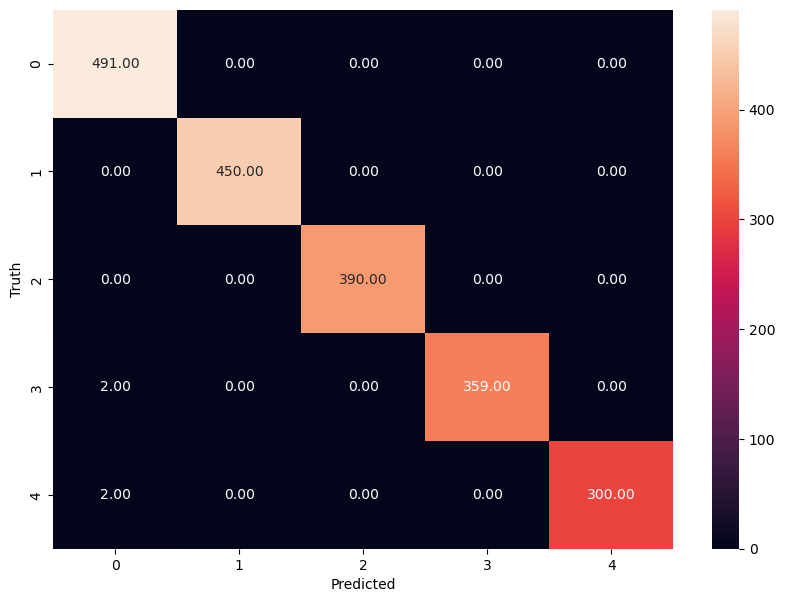

In [145]:
class_report(test.target, test_preds)

In [146]:
importances = xg.feature_importances_
feature_imp_df = pd.DataFrame({'Feature': use_cols, 'Gini Importance': importances}).sort_values('Gini Importance', ascending=False) 
display(feature_imp_df.head(10))

,Feature,Gini Importance
57,formation_GOR,0.063
44,downhole_temp,0.042
29,bottom_hole_psi_roll3days,0.039
31,bottom_hole_psi_roll5days,0.038
14,bottom_hole_psi,0.037
28,bottom_hole_psi_roll2days,0.035
30,bottom_hole_psi_roll4days,0.034
33,bottom_hole_psi_roll7days,0.033
32,bottom_hole_psi_roll6days,0.033
20,bottom_hole_psi_4days,0.027


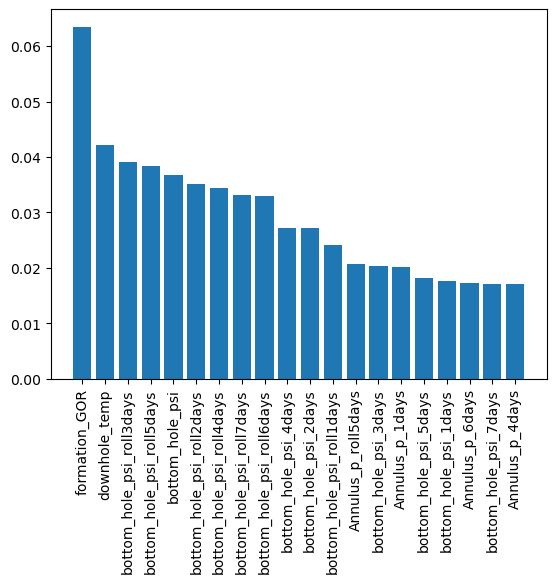

In [147]:
plt.bar(feature_imp_df.Feature[:20], feature_imp_df['Gini Importance'][:20])
plt.xticks(rotation=90)
plt.show()

In [148]:
top_10=feature_imp_df.Feature[:10].values
top_50=feature_imp_df.Feature[:50].values

In [149]:
# Training with RandomForest and predicting on the test data to see performance with top 50 features only
xg_50=RandomForestClassifier(random_state=0, class_weight='balanced')
xg_50.fit(train[top_50], train['target'])

RandomForestClassifier(class_weight='balanced', random_state=0)

In [150]:
test_50_pr=xg_50.predict(test[top_50])

In [151]:
f1_score(test.target, test_50_pr, average='macro'), accuracy_score(test.target, test_50_pr)

(0.9951276562290946, 0.9954864593781344)

**Summary**

1. An untuned random forest with class_weight as balanced had very good performance from just Feature engineering alone. Due to this, there was no further need for Hyperparameter Tuning.
2. Initially, the only misclassification happened where some wells from Kema were predicted as being from Jani and Mako.
3. Using just the top 50 important features provides very similar metric scores, so that's what we went for.
4. Additionally, it makes sense that the top 10 features include the formation gas-oil ratio and bottomhole psi which are features that indeed point to a reservoir, also it makes sense that rolling average features of the bottomhole psi are part of the important features.

### Unsupervised Learning
Using top_10 and top_50 features with and without PCA for unsupervised learning performance assessment.

The expectation is to have 5 clusters where 4 wells fall in each of the 5 clusters.

Using top_10 features and minmax scaler


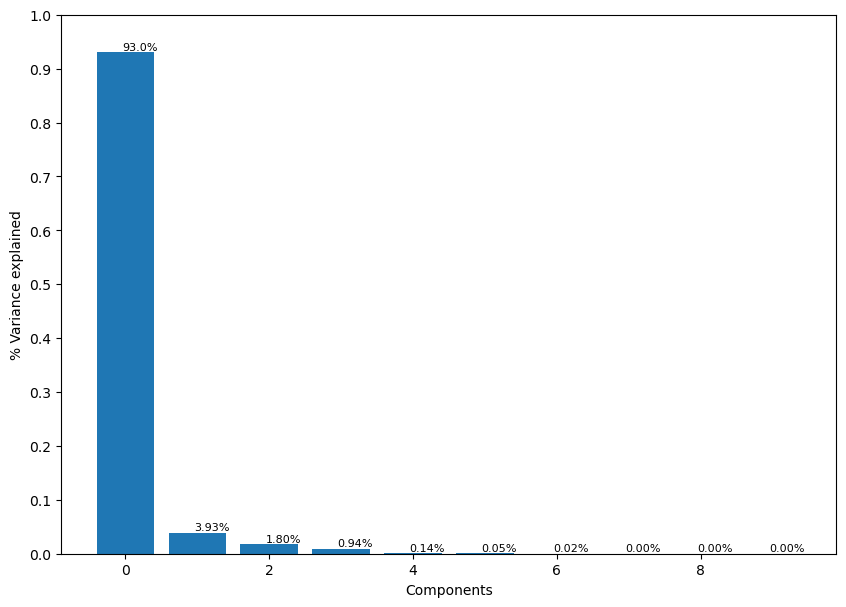

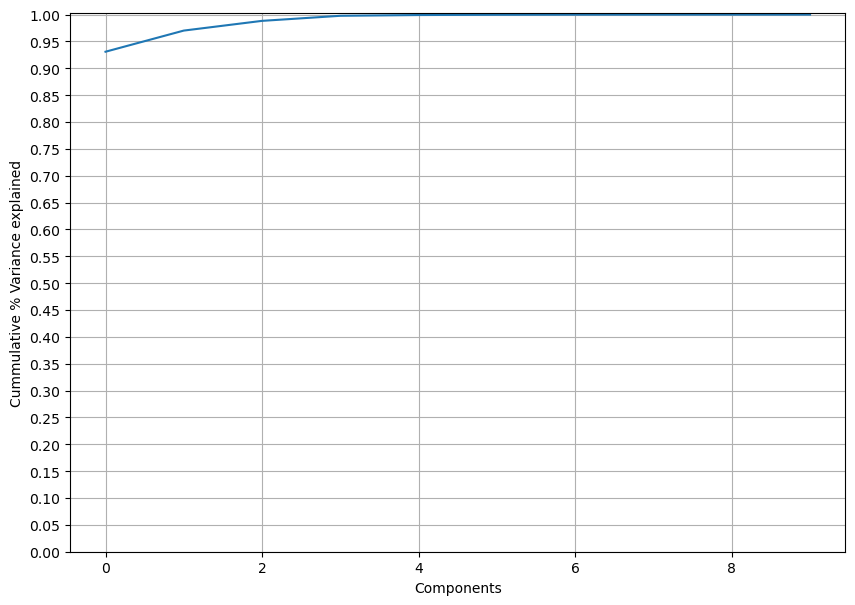

We have 90% Variance explained at n_components = 1
Using just scaled dataset


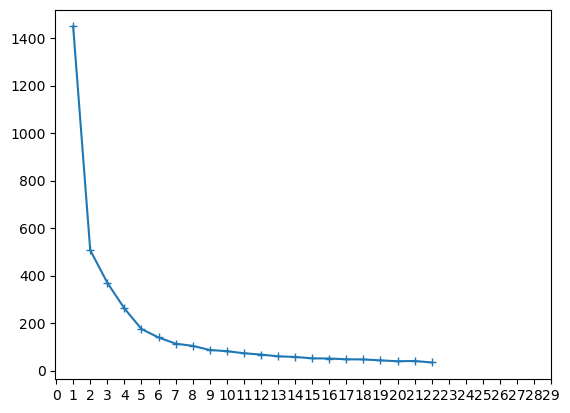

cluster  well_name
0        Well_#20     605
         Well_#8      279
         Well_#11     255
         Well_#12     249
         Well_#5      229
         Well_#18     218
         Well_#16     208
         Well_#9      194
         Well_#17     160
         Well_#4      160
         Well_#14     138
         Well_#3       67
         Well_#13       5
         Well_#6        2
         Well_#2        1
1        Well_#10     320
         Well_#19     185
         Well_#7      168
         Well_#2       92
         Well_#6       66
         Well_#15      55
         Well_#1       16
2        Well_#12      21
         Well_#3       17
         Well_#18       9
         Well_#6        4
3        Well_#12     308
         Well_#9      242
         Well_#13     180
         Well_#17     167
         Well_#4       57
         Well_#20      10
         Well_#18       7
         Well_#6        4
         Well_#3        3
4        Well_#6      420
         Well_#2      264
         Well_#7   

Using pca_data dataset


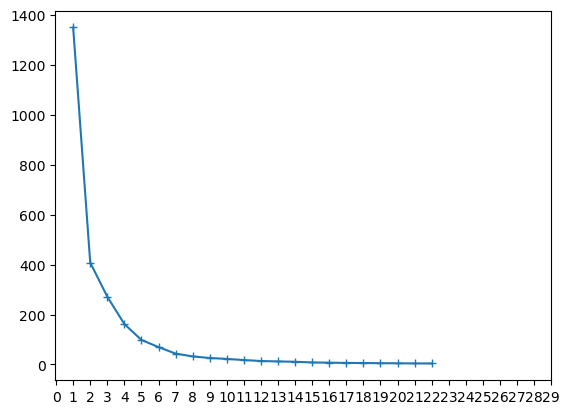

cluster  well_name
0        Well_#20     603
         Well_#8      279
         Well_#12     256
         Well_#11     255
         Well_#5      225
         Well_#18     218
         Well_#16     209
         Well_#9      201
         Well_#17     167
         Well_#4      163
         Well_#14     138
         Well_#3       67
         Well_#2        7
         Well_#6        2
         Well_#13       1
1        Well_#10     320
         Well_#19     185
         Well_#7      179
         Well_#2       95
         Well_#6       66
         Well_#15      56
         Well_#1       16
2        Well_#6      420
         Well_#2      255
         Well_#7      214
         Well_#15     189
         Well_#1      137
         Well_#16      11
         Well_#5       10
         Well_#3        6
3        Well_#12     301
         Well_#9      235
         Well_#13     184
         Well_#17     160
         Well_#4       54
         Well_#20      12
         Well_#18       6
         Well_#6   

Using top_10 features and standardsc scaler


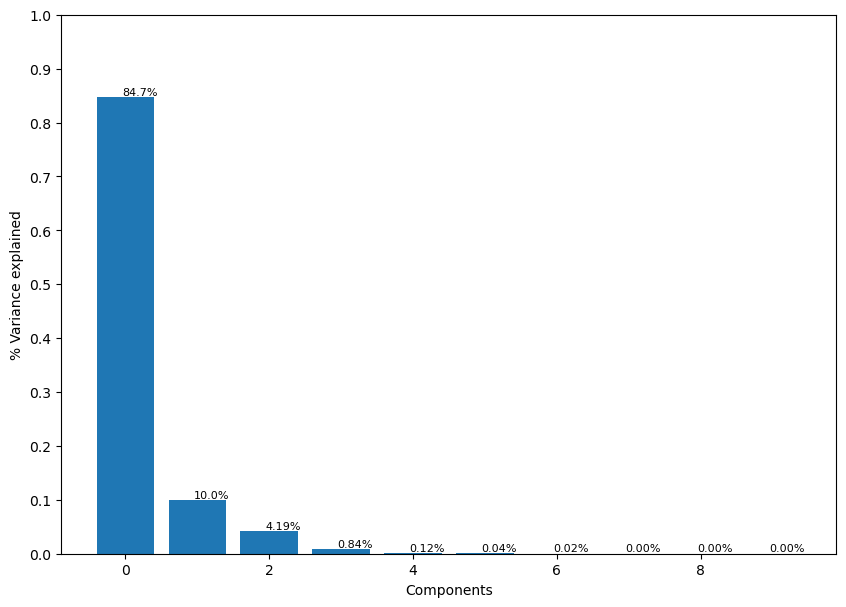

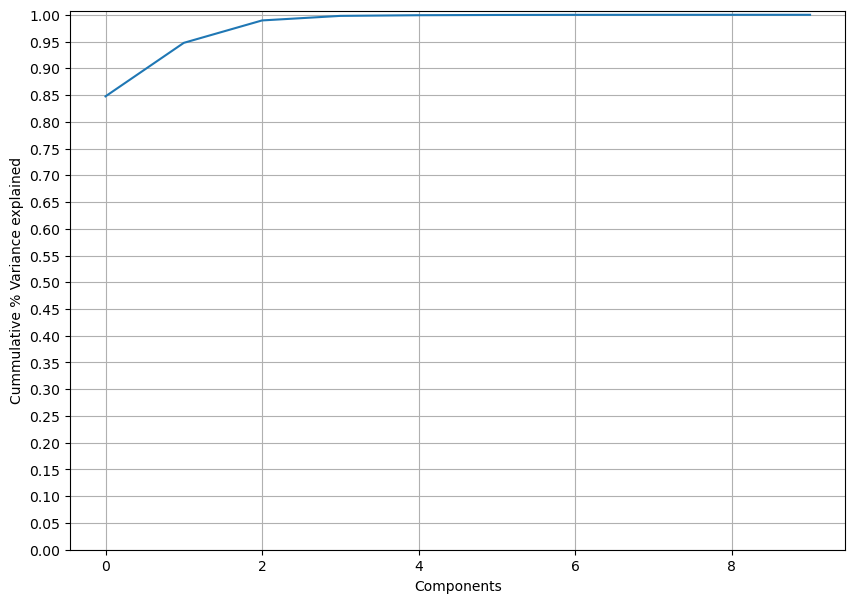

We have 90% Variance explained at n_components = 1
Using just scaled dataset


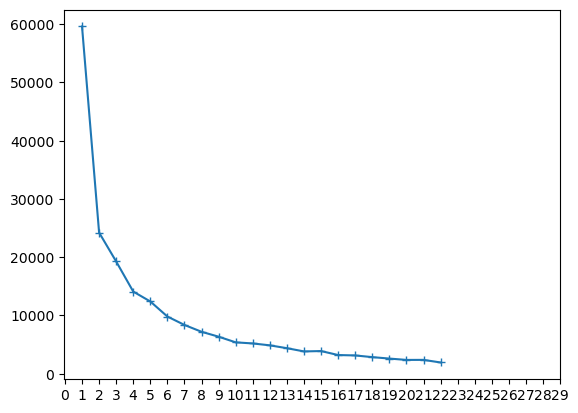

cluster  well_name
0        Well_#20     614
         Well_#12     553
         Well_#9      436
         Well_#17     327
         Well_#8      279
         Well_#11     255
         Well_#18     223
         Well_#4      217
         Well_#13     185
         Well_#5      158
         Well_#14     135
         Well_#3       63
         Well_#6        5
1        Well_#10     320
         Well_#19     185
         Well_#6       44
         Well_#15      17
         Well_#1       15
         Well_#7       10
2        Well_#6      262
         Well_#16     216
         Well_#15     180
         Well_#1      135
         Well_#7      106
         Well_#2       91
         Well_#5       74
         Well_#3        8
         Well_#14       3
3        Well_#12      25
         Well_#3       17
         Well_#18      11
         Well_#6        5
         Well_#20       1
4        Well_#7      277
         Well_#2      266
         Well_#6      180
         Well_#15      48
         Well_#3   

Using pca_data dataset


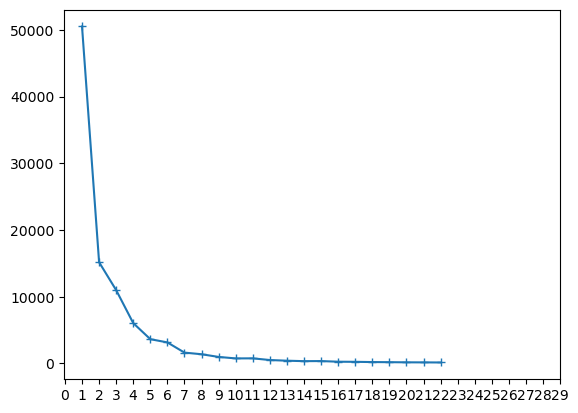

cluster  well_name
0        Well_#12     391
         Well_#9      268
         Well_#4      204
         Well_#17     193
         Well_#13     185
         Well_#20      15
         Well_#18       9
         Well_#3        4
         Well_#6        4
1        Well_#10     320
         Well_#19     185
         Well_#2       57
         Well_#15      48
         Well_#6       39
         Well_#7       24
         Well_#1       15
2        Well_#20     600
         Well_#8      279
         Well_#11     255
         Well_#5      231
         Well_#18     215
         Well_#16     211
         Well_#9      168
         Well_#12     164
         Well_#14     138
         Well_#17     134
         Well_#3       69
         Well_#2       22
         Well_#4       13
         Well_#6        2
3        Well_#12      23
         Well_#3       17
         Well_#18      10
         Well_#6        4
4        Well_#6      447
         Well_#7      369
         Well_#2      278
         Well_#15  

Using top_50 features and minmax scaler


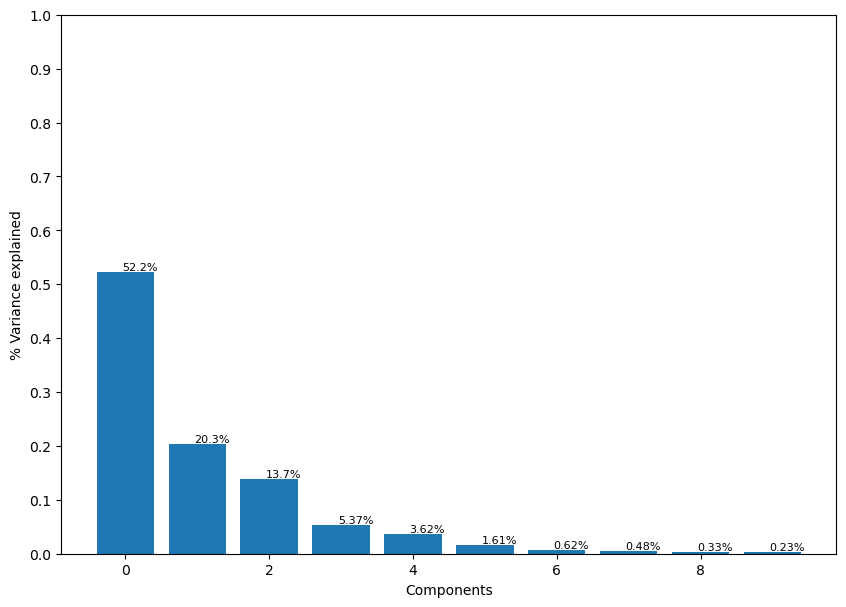

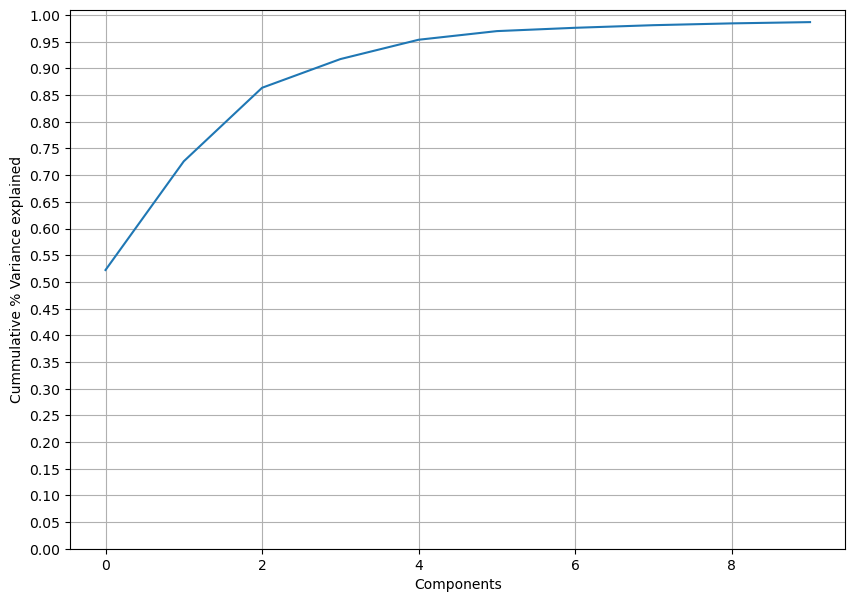

We have 90% Variance explained at n_components = 4
Using just scaled dataset


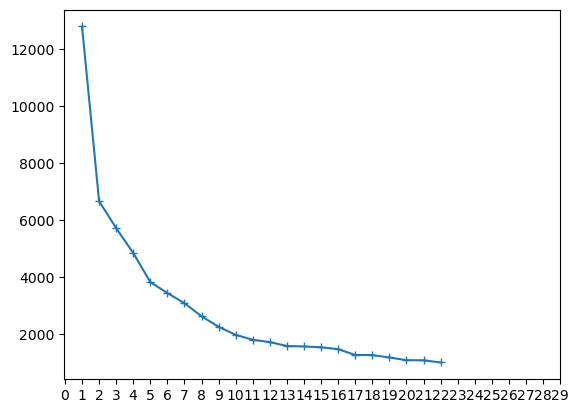

cluster  well_name
0        Well_#20     615
         Well_#9      397
         Well_#17     288
         Well_#8      244
         Well_#11     237
         Well_#4      213
         Well_#3       11
1        Well_#6      485
         Well_#15     245
         Well_#19     185
         Well_#2      115
         Well_#1       11
         Well_#10       9
         Well_#16       6
2        Well_#7      393
         Well_#10     311
         Well_#1      136
         Well_#3       29
3        Well_#12     578
         Well_#18     234
         Well_#5      234
         Well_#16     214
         Well_#13     185
         Well_#14     138
         Well_#17      39
         Well_#9       39
         Well_#8       35
         Well_#3       28
         Well_#11      18
         Well_#2       16
         Well_#6       11
4        Well_#2      226
         Well_#3       25
         Well_#1        6
         Well_#4        4
         Well_#5        1
Name: count, dtype: int64

Using pca_data dataset


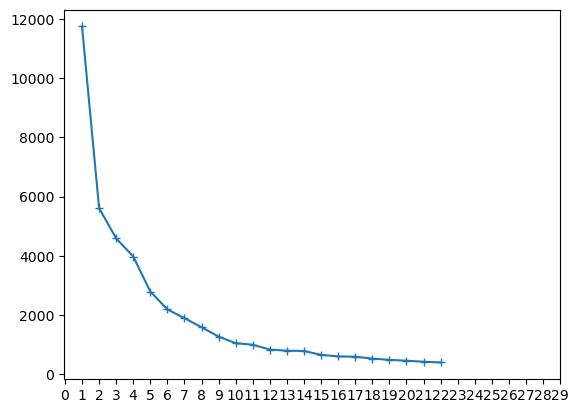

cluster  well_name
0        Well_#20     613
         Well_#11     222
         Well_#4      191
         Well_#9      157
         Well_#17     129
         Well_#8      123
         Well_#3       40
         Well_#1        5
1        Well_#12     560
         Well_#6      493
         Well_#15     245
         Well_#5      235
         Well_#18     226
         Well_#16     220
         Well_#13     185
         Well_#19     185
         Well_#14     138
         Well_#2      132
         Well_#8       24
         Well_#1       10
         Well_#11      10
         Well_#3        9
         Well_#10       6
2        Well_#7      393
         Well_#10     314
         Well_#1      131
3        Well_#2      225
         Well_#3       25
         Well_#1        7
         Well_#4        3
4        Well_#9      279
         Well_#17     198
         Well_#8      132
         Well_#11      23
         Well_#4       23
         Well_#3       19
         Well_#12      18
         Well_#18  

Using top_50 features and standardsc scaler


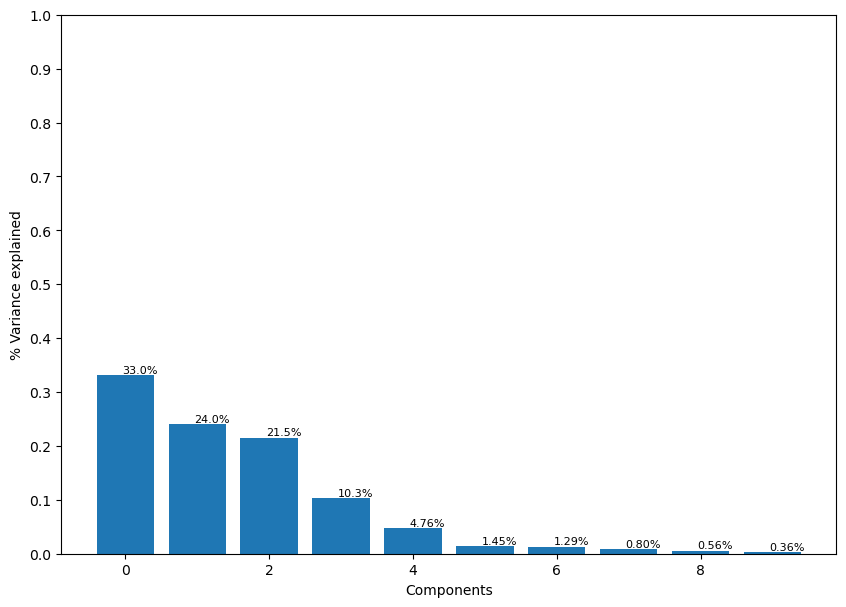

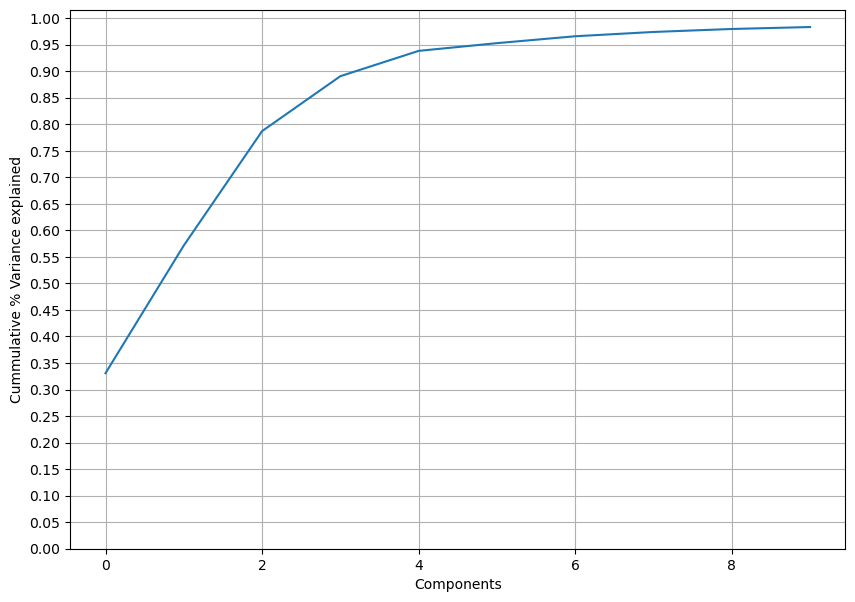

We have 90% Variance explained at n_components = 5
Using just scaled dataset


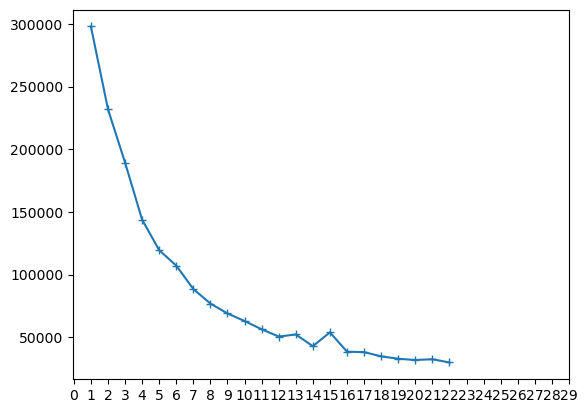

cluster  well_name
0        Well_#7      393
         Well_#10     320
         Well_#6      302
         Well_#19     185
1        Well_#20     615
         Well_#9      385
         Well_#17     276
         Well_#8      248
         Well_#11     236
         Well_#4      207
         Well_#1       31
2        Well_#15     245
         Well_#5      235
         Well_#16     220
         Well_#6      184
         Well_#2      147
         Well_#1       11
         Well_#14      10
         Well_#8        4
         Well_#3        2
3        Well_#12     578
         Well_#18     234
         Well_#13     185
         Well_#14     128
         Well_#17      51
         Well_#9       51
         Well_#8       27
         Well_#3       26
         Well_#11      19
         Well_#6       10
4        Well_#2      210
         Well_#1      111
         Well_#3       65
         Well_#4       10
Name: count, dtype: int64

Using pca_data dataset


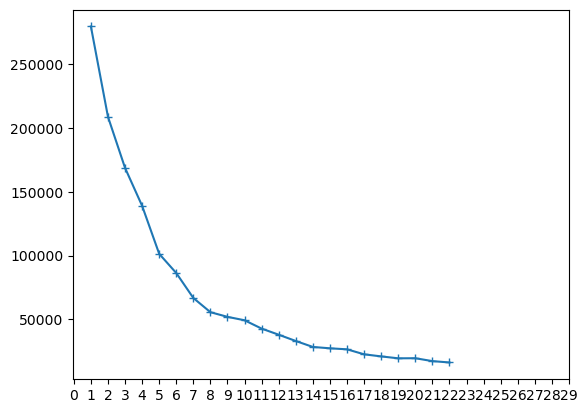

cluster  well_name
0        Well_#7      393
         Well_#10     316
         Well_#1        5
1        Well_#6      484
         Well_#15     245
         Well_#19     185
         Well_#2      110
         Well_#1       11
         Well_#16       6
         Well_#10       4
2        Well_#20     615
         Well_#9      433
         Well_#17     324
         Well_#8      247
         Well_#11     239
3        Well_#2      240
         Well_#4      217
         Well_#1      137
         Well_#3       66
         Well_#5        2
4        Well_#12     578
         Well_#18     234
         Well_#5      233
         Well_#16     214
         Well_#13     185
         Well_#14     138
         Well_#8       32
         Well_#3       27
         Well_#11      16
         Well_#6       12
         Well_#2        7
         Well_#17       3
         Well_#9        3
Name: count, dtype: int64

In [117]:
top_features={'top_10':top_10, 'top_50':top_50}

# Apply feature scaling
scalers= {'minmax':MinMaxScaler(), 'standardsc':StandardScaler()}


for top_feature in top_features.keys():
    for scaler in scalers.keys():
        print(f'Using {top_feature} features and {scaler} scaler')
        scaled = scalers[scaler].fit_transform(train.copy()[top_features[top_feature]])
        train_sc = pd.DataFrame(scaled, columns=train[top_features[top_feature]].columns)
        pca_data=get_pca(train_sc)
        datasets={'just scaled':train_sc, 'pca_data':pca_data}

        for dataset in datasets.keys():
            print(f'Using {dataset} dataset')
            # Over a number of different cluster counts...
            k_range = range(1, 23)
            sse = list()
            
            for k in k_range:
                # run k-means clustering on the data and...
                km = KMeans(n_clusters= k)
                #print('Fitting cluster', k)
                km.fit(datasets[dataset])
                # compute the average within-cluster distances.
                sse.append(abs(km.score(datasets[dataset])))
        
            # Investigate the change in within-cluster distance across number of clusters.
            plt.plot(k_range, sse, marker= '+')
            plt.xticks(range(0,30))
            plt.show()
            
            # Re-fit the k-means model with the selected number of clusters and obtain
            km=KMeans(n_clusters=5)
            clustered_gen=km.fit_predict(datasets[dataset])
            train['cluster']=clustered_gen
            display(train.groupby('cluster')['well_name'].value_counts())

In [118]:
well_df_analysis.groupby('rsv_name')['well_name'].unique()

rsv_name
ACHI    [Well_#8, Well_#11, Well_#12, Well_#18]
DEPU     [Well_#4, Well_#9, Well_#13, Well_#17]
JANI    [Well_#1, Well_#10, Well_#15, Well_#19]
KEMA      [Well_#2, Well_#6, Well_#7, Well_#16]
MAKO     [Well_#3, Well_#5, Well_#14, Well_#20]
Name: well_name, dtype: object

**Summary**
1. On manual inspection, the unsupervised learning approach doesn't do well in categorizing the wells. There's always many more wells in a single class making using this approach unstable. Thus, the recommended approach is to empirically obtain the classes and then with the classs, we train a supervised learning model which can classify any reservoir based on it's properties.

### Using a Classifier Chain with some extra features in classifying for the other requested parameters in a supervised learinig approach.

Towards creating a single model that does multioutput classification, we needed to compute some features we thought necessary in addition to the top 50 features previously obtained.

In [152]:
max_well_bottom_psis.columns

Index(['well_name', 'bottom_hole_psi', 'reservoir', 'reservoir_using_avg',
       'rsv_name', 'rsv_value', 'rsv_type', 'flow_status', 'solution_gor',
       'steady_unsteady_status', 'gor_trend', 'water_cut_trend', 'pi_trend'],
      dtype='object')

In [153]:
#adding other targets to train and test
train=pd.merge(train, max_well_bottom_psis[['well_name', 'rsv_type', 'flow_status', 'steady_unsteady_status', 'gor_trend', 'water_cut_trend', 
                                            'pi_trend']], on='well_name', how='left')
test=pd.merge(test, max_well_bottom_psis[['well_name', 'rsv_type', 'flow_status','steady_unsteady_status', 'gor_trend', 'water_cut_trend',
                                          'pi_trend']], on='well_name', how='left')

In [154]:
test

,date,well_name,on_str_hrs,bottom_hole_psi,downhole_temp,Annulus_p,choke_size,whp,wht,date_conv,...,weekday,weekofyear,rsv_name,target,rsv_type,flow_status,steady_unsteady_status,gor_trend,water_cut_trend,pi_trend
0,18-Jul-14,Well_#1,24.000,2869.000,209.003,1029.870,49.371,547.943,112.102,2014-07-18,...,4,29,JANI,4,Undersat,Gas Lifted,Unsteady,aSolGOR,Incr,Decr
1,19-Jul-14,Well_#1,24.000,2864.000,209.013,1037.240,49.030,548.718,111.656,2014-07-19,...,5,29,JANI,4,Undersat,Gas Lifted,Unsteady,aSolGOR,Incr,Decr
2,20-Jul-14,Well_#1,24.000,2883.000,208.948,1005.590,48.702,553.210,112.377,2014-07-20,...,6,29,JANI,4,Undersat,Gas Lifted,Unsteady,aSolGOR,Incr,Decr
3,21-Jul-14,Well_#1,24.000,2880.000,208.954,1000.470,48.917,556.875,108.440,2014-07-21,...,0,30,JANI,4,Undersat,Gas Lifted,Unsteady,aSolGOR,Incr,Decr
4,22-Jul-14,Well_#1,24.000,2880.000,208.944,977.649,48.978,569.657,105.739,2014-07-22,...,1,30,JANI,4,Undersat,Gas Lifted,Unsteady,aSolGOR,Incr,Decr
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,05-Apr-15,Well_#20,18.940,2505.000,149.177,633.188,77.321,115.406,85.532,2015-04-05,...,6,14,MAKO,3,Saturated,Gas Lifted,Unsteady,Combo,Incr,Decr
1990,06-Apr-15,Well_#20,21.060,2503.000,149.169,617.591,72.403,116.285,84.959,2015-04-06,...,0,15,MAKO,3,Saturated,Gas Lifted,Unsteady,Combo,Incr,Decr
1991,07-Apr-15,Well_#20,24.000,2481.000,149.175,645.435,100.000,111.943,87.361,2015-04-07,...,1,15,MAKO,3,Saturated,Gas Lifted,Unsteady,Combo,Incr,Decr
1992,08-Apr-15,Well_#20,15.940,2485.000,149.178,651.282,76.408,111.962,87.583,2015-04-08,...,2,15,MAKO,3,Saturated,Gas Lifted,Unsteady,Combo,Incr,Decr


In [155]:
apply_maps(train)
apply_maps(test)

In [156]:
test

,date,well_name,on_str_hrs,bottom_hole_psi,downhole_temp,Annulus_p,choke_size,whp,wht,date_conv,...,steady_unsteady_status,gor_trend,water_cut_trend,pi_trend,target_type,target_flow,target_steady,target_gor,target_water_cut,target_pi
0,18-Jul-14,Well_#1,24.000,2869.000,209.003,1029.870,49.371,547.943,112.102,2014-07-18,...,Unsteady,aSolGOR,Incr,Decr,0,0,1,0,0,1
1,19-Jul-14,Well_#1,24.000,2864.000,209.013,1037.240,49.030,548.718,111.656,2014-07-19,...,Unsteady,aSolGOR,Incr,Decr,0,0,1,0,0,1
2,20-Jul-14,Well_#1,24.000,2883.000,208.948,1005.590,48.702,553.210,112.377,2014-07-20,...,Unsteady,aSolGOR,Incr,Decr,0,0,1,0,0,1
3,21-Jul-14,Well_#1,24.000,2880.000,208.954,1000.470,48.917,556.875,108.440,2014-07-21,...,Unsteady,aSolGOR,Incr,Decr,0,0,1,0,0,1
4,22-Jul-14,Well_#1,24.000,2880.000,208.944,977.649,48.978,569.657,105.739,2014-07-22,...,Unsteady,aSolGOR,Incr,Decr,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,05-Apr-15,Well_#20,18.940,2505.000,149.177,633.188,77.321,115.406,85.532,2015-04-05,...,Unsteady,Combo,Incr,Decr,1,0,1,2,0,1
1990,06-Apr-15,Well_#20,21.060,2503.000,149.169,617.591,72.403,116.285,84.959,2015-04-06,...,Unsteady,Combo,Incr,Decr,1,0,1,2,0,1
1991,07-Apr-15,Well_#20,24.000,2481.000,149.175,645.435,100.000,111.943,87.361,2015-04-07,...,Unsteady,Combo,Incr,Decr,1,0,1,2,0,1
1992,08-Apr-15,Well_#20,15.940,2485.000,149.178,651.282,76.408,111.962,87.583,2015-04-08,...,Unsteady,Combo,Incr,Decr,1,0,1,2,0,1


In [157]:
top_x=list(top_50)
extra_feats=['gas_or_nat', 'water_cut']
all_feats=['target', 'target_type', 'target_flow', 'target_steady', 'target_gor', 'target_water_cut','target_pi']

In [158]:
top_x.extend(extra_feats)

In [159]:
# Defining the chained multioutput model (The values for the parameters were gotten after tuning which is below)
rf_chain = ClassifierChain(RandomForestClassifier(class_weight='balanced', random_state=0))

final_train_X = train[top_x]
final_train_y = train[all_feats]

final_test_X = test[top_x]
final_test_y = test[all_feats]

rf_chain.fit(final_train_X,final_train_y)


ClassifierChain(base_estimator=RandomForestClassifier(class_weight='balanced',
                                                      random_state=0))

In [160]:
preds=rf_chain.predict(final_test_X)

In [161]:
preds

array([[4., 0., 0., ..., 0., 0., 1.],
       [4., 0., 0., ..., 0., 0., 1.],
       [4., 0., 0., ..., 0., 0., 1.],
       ...,
       [3., 1., 0., ..., 2., 0., 1.],
       [3., 1., 0., ..., 2., 0., 1.],
       [3., 1., 0., ..., 2., 0., 1.]])

In [170]:
# Computing F1 and Accuracy for all the predictions
for target, ind in zip(all_feats, list(range(7))):
    print(f"for {target} f1 is {f1_score(test[target], preds[:,ind], average='macro')} and accuracy is {accuracy_score(test[target],preds[:,ind])}")

for target f1 is 0.9968973879381421 and accuracy is 0.9969909729187563
for target_type f1 is 0.9989314040728832 and accuracy is 0.9989969909729187
for target_flow f1 is 1.0 and accuracy is 1.0
for target_steady f1 is 0.9782997366367234 and accuracy is 0.9929789368104313
for target_gor f1 is 0.996638895697672 and accuracy is 0.9969909729187563
for target_water_cut f1 is 0.9532052836631068 and accuracy is 0.9543630892678034
for target_pi f1 is 0.997504627827185 and accuracy is 0.9974924774322969
